## Импорт библиотек

In [ ]:
# !pip install zeep
# !pip install yfinance
# !pip install pymannkendall

In [13]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import requests
import yfinance as yf
pd.set_option('display.max_columns', None)

# 1. Сбор данных

In [ ]:
# import importlib 
# import data_download_functions
# importlib.reload(data_download_functions)

<module 'data_download_functions' from '/mnt/c/Users/User/Desktop/ML_DL_knowledge/RiskManagement/project2/rm_project_2/data_download_functions.py'>

In [1]:
from functions.data_download_functions import (download_int_rates,
                                     get_moex_data_bond,
                                     get_moex_data_sha,
                                     get_moex_data_idx)

Кривая тут https://www.cbr.ru/hd_base/zcyc_params/zcyc/. Все ожидают снижения процентных ставок в будущем, поэтому кривая инвертированная

Заходим на сайт ЦБ, который предоставляет данные по API: https://www.cbr.ru/secinfo/secinfo.asmx, далее в https://www.cbr.ru/secinfo/secinfo.asmx?WSDL и уже используя метод `ZCYC` получаем код для данных

## 1.a Скачиваем процентные ставки

In [15]:
interest_rates = download_int_rates(from_date = '2021-01-01T00:00:00', to_date = '2025-01-01T23:59:59')

Forcing soap:address location to HTTPS
Forcing soap:address location to HTTPS


In [16]:
interest_rates

,date,y_0_25,y_0_5,y_0_75,y_1,y_2,y_3,y_5,y_7,y_10,y_15,y_20,y_30
0,2024-12-30 00:00:00+03:00,18.80,18.75,18.68,18.58,18.06,17.48,16.53,15.87,15.22,14.57,14.22,13.90
1,2024-12-28 00:00:00+03:00,18.55,18.58,18.57,18.53,18.15,17.67,16.83,16.21,15.57,14.92,14.55,14.20
2,2024-12-27 00:00:00+03:00,17.49,17.59,17.64,17.67,17.56,17.29,16.65,16.08,15.43,14.75,14.36,13.99
3,2024-12-26 00:00:00+03:00,17.97,17.99,17.98,17.96,17.70,17.33,16.57,15.95,15.28,14.62,14.26,13.94
4,2024-12-25 00:00:00+03:00,18.33,18.33,18.30,18.24,17.88,17.44,16.58,15.91,15.21,14.52,14.15,13.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,2021-01-11 00:00:00+03:00,4.17,4.19,4.22,4.26,4.56,4.92,5.52,5.93,6.34,6.70,6.89,7.07
998,2021-01-08 00:00:00+03:00,3.78,3.88,3.99,4.08,4.46,4.84,5.45,5.85,6.24,6.59,6.76,6.92
999,2021-01-06 00:00:00+03:00,3.85,3.95,4.04,4.11,4.42,4.79,5.40,5.83,6.24,6.62,6.82,7.03
1000,2021-01-05 00:00:00+03:00,3.98,4.04,4.11,4.18,4.48,4.82,5.38,5.80,6.22,6.62,6.84,7.06


## 1.b Скачиваем описание облигаций ОФЗ ПД (постоянный доход)

Список облигаций:
1. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26212RMFS9 ОФЗ-ПД 26212 19/01/28 SU26212RMFS9
2. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26228RMFS5 ОФЗ-ПД 26228 10/04/30 SU26228RMFS5
3. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26225RMFS1 ОФЗ-ПД 26225 10/05/34 SU26225RMFS1
4. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26207RMFS9 ОФЗ-ПД 26207 03/02/27 SU26207RMFS9
5. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26224RMFS4 ОФЗ-ПД 26224 23/05/29 SU26224RMFS4

In [17]:
bonds_list = ['SU26228RMFS5',
            'SU26212RMFS9',
            'SU26207RMFS9',
            'SU26224RMFS4',
            'SU26225RMFS1']

skiprows = [*range(32)]
bonds = pd.DataFrame()
for i in bonds_list:
    url = f'https://iss.moex.com/iss/securities/{i}.csv'
    urlData = requests.get(url).content
    df = pd.read_csv(url, encoding="windows-1251", sep=';', skiprows = lambda x: x not in skiprows, header=1)
    df['bond'] = i
    df = df[['title', 'value', 'bond']]
    df = df.pivot(index="bond", columns="title", values="value").reset_index()
    bonds = pd.concat([bonds, df])

In [18]:
bonds

title,bond,ISIN код,Английское наименование,Бумаги для квалифицированных инвесторов,Валюта номинала,Возможен досрочный выкуп,Дата выплаты купона,Дата начала торгов,Дата начала торгов на Московской Бирже,Дата погашения,Дата принятия решения организатором торговли о включении ценной бумаги в Список,Дней до погашения,Допуск к утренней дополнительной торговой сессии,Допущен дефолт,Допущен технический дефолт,Код ценной бумаги,Краткое наименование,Наименование ценной бумаги,Наличие проспекта,Номер государственной регистрации,Номинальная стоимость,Облигации размещены с целью финансирования соглашений о партнерстве,Объем выпуска,Первоначальная номинальная стоимость,Периодичность выплаты купона в год,Полное наименование,"Ставка купона, %","Сумма купона, в валюте номинала",Уровень листинга,Эмитент не соответствует требованию на текущий Список,Допуск к вечерней дополнительной торговой сессии
0,SU26228RMFS5,RU000A100A82,OFZ-PD 26228,0,SUR,0,2025-10-15,2019-04-24,2019-04-24,2030-04-10,2019-04-23,1748,1,0,0,SU26228RMFS5,ОФЗ 26228,облигации федерального займа с постоянным купо...,0,26228RMFS,1000,0,492018800,1000,2,ОФЗ-ПД 26228 10/04/30,7.65,38.15,1,0,NaN
0,SU26212RMFS9,RU000A0JTK38,OFZ-PD 26212,0,SUR,NaN,2025-07-23,2013-01-23,2013-01-23,2028-01-19,2013-01-22,936,1,0,0,SU26212RMFS9,ОФЗ 26212,облигации федерального займа с постоянным купо...,0,26212RMFS,1000,0,356981514,1000,2,ОФЗ-ПД 26212 19/01/28,7.05,35.15,1,0,1
0,SU26207RMFS9,RU000A0JS3W6,OFZ-PD 26207,0,SUR,NaN,2025-08-06,2012-02-22,2012-02-22,2027-02-03,2012-02-16,586,1,0,0,SU26207RMFS9,ОФЗ 26207,Облигации федерального займа с постоянным купо...,0,26207RMFS,1000,0,370299980,1000,2,ОФЗ-ПД 26207 03/02/27,8.15,40.64,1,0,1
0,SU26224RMFS4,RU000A0ZYUA9,OFZ-PD 26224,0,SUR,0,2025-11-26,2018-02-21,2018-03-07,2029-05-23,2018-02-20,1426,1,0,0,SU26224RMFS4,ОФЗ 26224,облигации федерального займа с постоянным купо...,0,26224RMFS,1000,0,396912955,1000,2,ОФЗ-ПД 26224 23/05/29,6.9,34.41,1,0,NaN
0,SU26225RMFS1,RU000A0ZYUB7,OFZ-PD 26225,0,SUR,0,2025-11-19,2018-02-21,2018-02-28,2034-05-10,2018-02-20,3239,1,0,0,SU26225RMFS1,ОФЗ 26225,облигации федерального займа с постоянным купо...,0,26225RMFS,1000,0,397974096,1000,2,ОФЗ-ПД 26225 10/05/34,7.25,36.15,1,0,NaN


## 1.c Рыночные котировки этих облигаций

In [19]:
bond_quotes = pd.DataFrame()
for i in bonds_list:
    df = get_moex_data_bond(i, "2021-01-01", "2025-01-01")
    bond_quotes = pd.concat([bond_quotes, df])

bond_quotes = bond_quotes[['TRADEDATE', 'SHORTNAME', 'SECID', 'NUMTRADES', 'VALUE', 'LOW', 'HIGH', 'CLOSE',
                          'ACCINT', #нкд - накопленный купонный доход
                         'WAPRICE', # Средневзвешенная цена
                          'YIELDCLOSE', # Доходность к погашению по цене последней сделки (Close)
                          'OPEN', 'VOLUME',
                          'MARKETPRICE2', # Рыночная цена, рассчитанная в соответствии с Постановлением ФКЦБ
                          'MARKETPRICE3', # Рыночная цена 3
                          'ADMITTEDQUOTE', # Признаваемая котировка
                          'DURATION',
                          'COUPONPERCENT', 'COUPONVALUE', 'LASTTRADEDATE', 'FACEVALUE', 'CURRENCYID', 'FACEUNIT', 'TRADINGSESSION']]

In [20]:
bond_quotes

,TRADEDATE,SHORTNAME,SECID,NUMTRADES,VALUE,LOW,HIGH,CLOSE,ACCINT,WAPRICE,YIELDCLOSE,OPEN,VOLUME,MARKETPRICE2,MARKETPRICE3,ADMITTEDQUOTE,DURATION,COUPONPERCENT,COUPONVALUE,LASTTRADEDATE,FACEVALUE,CURRENCYID,FACEUNIT,TRADINGSESSION
0,2021-01-04,ОФЗ 26228,SU26228RMFS5,90,1.082319e+06,112.600,113.589,113.050,15.72,113.095,5.89,113.589,957,113.095,113.095,113.050,2510,7.65,38.15,2021-01-04,1000,SUR,RUB,3
1,2021-01-05,ОФЗ 26228,SU26228RMFS5,110,1.867626e+06,112.941,113.321,112.941,15.93,113.258,5.91,113.001,1649,113.258,113.258,112.966,2510,7.65,38.15,2021-01-05,1000,SUR,RUB,3
2,2021-01-06,ОФЗ 26228,SU26228RMFS5,52,3.590218e+05,113.027,113.595,113.053,16.14,113.256,5.89,113.595,317,NaN,113.252,113.054,2509,7.65,38.15,2021-01-06,1000,SUR,RUB,3
3,2021-01-08,ОФЗ 26228,SU26228RMFS5,57,5.760908e+05,112.943,113.318,113.251,16.56,113.181,5.86,113.318,509,113.181,113.181,113.251,2507,7.65,38.15,2021-01-08,1000,SUR,RUB,3
4,2021-01-11,ОФЗ 26228,SU26228RMFS5,158,2.130890e+08,112.200,113.268,112.500,17.19,112.426,5.96,113.268,189458,112.473,112.473,112.498,2500,7.65,38.15,2021-01-11,1000,SUR,RUB,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1012,2024-12-25,ОФЗ 26225,SU26225RMFS1,1758,6.631439e+07,59.914,60.700,60.205,6.95,60.105,16.00,60.681,110331,60.081,60.081,NaN,2220,7.25,36.15,2024-12-25,1000,SUR,RUB,3
1013,2024-12-26,ОФЗ 26225,SU26225RMFS1,1682,1.674005e+08,60.130,60.921,60.396,7.15,60.384,15.94,60.205,277226,60.379,60.379,NaN,2222,7.25,36.15,2024-12-26,1000,SUR,RUB,3
1014,2024-12-27,ОФЗ 26225,SU26225RMFS1,1590,4.220086e+08,59.752,60.800,60.348,7.35,60.375,15.96,60.635,698982,60.376,60.376,NaN,2221,7.25,36.15,2024-12-27,1000,SUR,RUB,3
1015,2024-12-28,ОФЗ 26225,SU26225RMFS1,1466,2.973391e+07,59.900,60.774,60.318,7.55,60.316,15.97,60.348,49297,60.318,60.318,NaN,2218,7.25,36.15,2024-12-28,1000,SUR,RUB,3


## 1.d Котировки 10 российских акций

In [21]:
shares_quotes = pd.DataFrame()
for i in ['SBER', 'GAZP', 'ROSN', 'LKOH', 'GMKN', 'NVTK', 'TRNFP', 'MGNT', 'MTSS', 'YNDX']:
    df = get_moex_data_sha(i, "2021-01-01", "2025-01-01")
    shares_quotes = pd.concat([shares_quotes, df])

shares_quotes = shares_quotes[['TRADEDATE', 'SHORTNAME', 'SECID', 'NUMTRADES', 'VALUE',
       'OPEN', 'LOW', 'HIGH', 'LEGALCLOSEPRICE', 'WAPRICE', 'CLOSE', 'VOLUME',
       'MARKETPRICE2', 'MARKETPRICE3', 'ADMITTEDQUOTE', 'MP2VALTRD',
       'MARKETPRICE3TRADESVALUE', 'ADMITTEDVALUE', 'WAVAL', 'TRADINGSESSION',
       'CURRENCYID', 'TRENDCLSPR']]

In [22]:
shares_quotes

,TRADEDATE,SHORTNAME,SECID,NUMTRADES,VALUE,OPEN,LOW,HIGH,LEGALCLOSEPRICE,WAPRICE,CLOSE,VOLUME,MARKETPRICE2,MARKETPRICE3,ADMITTEDQUOTE,MP2VALTRD,MARKETPRICE3TRADESVALUE,ADMITTEDVALUE,WAVAL,TRADINGSESSION,CURRENCYID,TRENDCLSPR
0,2021-01-04,Сбербанк,SBER,74192,1.343454e+10,274.67,270.61,276.60,276.00,274.61,272.00,48922920,275.06,275.06,276.00,1.099544e+10,1.099544e+10,1.099544e+10,0,3,SUR,0.13
1,2021-01-05,Сбербанк,SBER,74787,1.244994e+10,272.69,270.28,275.70,273.82,273.12,275.20,45583910,272.97,272.97,273.82,1.133575e+10,1.133575e+10,1.133575e+10,0,3,SUR,1.18
2,2021-01-06,Сбербанк,SBER,64392,1.119879e+10,275.94,271.62,275.94,274.68,273.49,272.93,40948520,273.45,273.45,274.68,9.933000e+09,9.933000e+09,9.933000e+09,0,3,SUR,-0.82
3,2021-01-08,Сбербанк,SBER,126247,2.496560e+10,275.11,275.11,283.99,282.08,280.74,283.64,88928790,280.62,280.62,282.08,2.341421e+10,2.341421e+10,2.341421e+10,0,3,SUR,3.92
4,2021-01-11,Сбербанк,SBER,167977,3.238759e+10,282.86,279.48,292.95,288.85,288.30,289.49,112349520,288.23,288.23,288.85,3.106934e+10,3.106934e+10,3.106934e+10,0,3,SUR,2.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
887,2024-07-03,Yandex clA,YNDX,0,0.000000e+00,NaN,NaN,NaN,4073.20,NaN,NaN,0,NaN,4090.00,NaN,0.000000e+00,6.135000e+05,NaN,0,3,SUR,NaN
888,2024-07-04,Yandex clA,YNDX,0,0.000000e+00,NaN,NaN,NaN,4073.20,NaN,NaN,0,NaN,4090.00,NaN,0.000000e+00,6.135000e+05,NaN,0,3,SUR,NaN
889,2024-07-05,Yandex clA,YNDX,0,0.000000e+00,NaN,NaN,NaN,4073.20,NaN,NaN,0,NaN,4090.00,NaN,0.000000e+00,6.135000e+05,NaN,0,3,SUR,NaN
890,2024-07-08,Yandex clA,YNDX,0,0.000000e+00,NaN,NaN,NaN,4073.20,NaN,NaN,0,NaN,4090.00,NaN,0.000000e+00,6.135000e+05,NaN,0,3,SUR,NaN


## 1.e Значения индекса МосБиржи, индекса РТС, цены на нефть Brent и курса доллара и евро за тот же период

In [23]:
index_values = pd.DataFrame()
for i in ['MOEXBC', 'RTSI', 'IMOEX', 'IMOEX10']:
    df = get_moex_data_idx(i, "2021-01-01", "2025-01-01")
    index_values = pd.concat([index_values, df])

/tmp/ipykernel_311379/970326971.py:4: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  index_values = pd.concat([index_values, df])


In [24]:
index_values

,BOARDID,SECID,TRADEDATE,SHORTNAME,NAME,CLOSE,OPEN,HIGH,LOW,VALUE,DURATION,YIELD,DECIMALS,CAPITALIZATION,CURRENCYID,DIVISOR,TRADINGSESSION,VOLUME,TRADE_SESSION_DATE
0,RTSI,MOEXBC,2021-01-04,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22057.67,21771.67,22057.67,21747.67,5.032124e+10,0,0,2,1.358970e+13,RUB,6.160985e+08,3,None,2021-01-04
1,RTSI,MOEXBC,2021-01-05,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22109.01,21890.17,22160.66,21698.70,5.301180e+10,0,0,2,1.362133e+13,RUB,6.160985e+08,3,None,2021-01-05
2,RTSI,MOEXBC,2021-01-06,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22211.91,22220.05,22269.25,22008.59,5.576058e+10,0,0,2,1.368472e+13,RUB,6.160985e+08,3,None,2021-01-06
3,RTSI,MOEXBC,2021-01-08,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22752.43,22362.95,22927.20,22362.95,1.046062e+11,0,0,2,1.401774e+13,RUB,6.160985e+08,3,None,2021-01-08
4,RTSI,MOEXBC,2021-01-11,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22967.97,22771.97,23208.75,22614.69,1.087189e+11,0,0,2,1.415053e+13,RUB,6.160985e+08,3,None,2021-01-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,SNDX,IMOEX,2024-12-25,Индекс МосБиржи,Индекс МосБиржи,2732.83,2680.25,2751.11,2666.38,1.471084e+11,0,0,2,5.910295e+12,RUB,2.162703e+09,3,None,2024-12-25
996,SNDX,IMOEX,2024-12-26,Индекс МосБиржи,Индекс МосБиржи,2766.57,2749.49,2776.33,2738.31,1.093092e+11,0,0,2,5.983264e+12,RUB,2.162703e+09,3,None,2024-12-26
997,SNDX,IMOEX,2024-12-27,Индекс МосБиржи,Индекс МосБиржи,2757.45,2754.56,2766.03,2743.18,7.307235e+10,0,0,2,5.963554e+12,RUB,2.162703e+09,3,None,2024-12-27
998,SNDX,IMOEX,2024-12-28,Индекс МосБиржи,Индекс МосБиржи,2786.67,2763.48,2798.49,2763.48,7.881748e+10,0,0,2,6.026748e+12,RUB,2.162703e+09,3,None,2024-12-28


In [25]:
RTSI = index_values[index_values['SECID'] == 'RTSI'].reset_index(drop=True)
df_RTSI = RTSI[['TRADEDATE','CLOSE']].rename(columns={'CLOSE': 'RTSI','TRADEDATE':'date'})
df_RTSI['date'] = pd.to_datetime(df_RTSI['date']).dt.date

IMOEX = index_values[index_values['SECID'] == 'IMOEX'].reset_index(drop=True)
df_risk = IMOEX[['TRADEDATE','CLOSE']].rename(columns={'CLOSE': 'MOEX','TRADEDATE':'date'})
df_risk['date'] = pd.to_datetime(df_risk['date']).dt.date

MOEXBC = index_values[index_values['SECID'] == 'MOEXBC'].reset_index(drop=True)
df_MOEXBC = MOEXBC[['TRADEDATE','CLOSE']].rename(columns={'CLOSE': 'MOEXBC','TRADEDATE':'date'})
df_MOEXBC['date'] = pd.to_datetime(df_MOEXBC['date']).dt.date

In [26]:
df_RTSI.head()

,date,RTSI
0,2021-01-04,1424.84
1,2021-01-05,1426.11
2,2021-01-06,1436.71
3,2021-01-08,1466.50
4,2021-01-11,1466.56


In [27]:
df_risk.head()

,date,MOEX
0,2021-01-04,3350.51
1,2021-01-05,3359.15
2,2021-01-06,3371.03
3,2021-01-08,3454.82
4,2021-01-11,3482.48


In [28]:
df_MOEXBC.head()

,date,MOEXBC
0,2021-01-04,22057.67
1,2021-01-05,22109.01
2,2021-01-06,22211.91
3,2021-01-08,22752.43
4,2021-01-11,22967.97


In [29]:
# Скачиваем Brent
brent_price = yf.download('BZ=F', start='2021-01-01', end='2025-01-01')

/tmp/ipykernel_311379/1719979541.py:2: FutureWarning: YF.download() has changed argument auto_adjust default to True
  brent_price = yf.download('BZ=F', start='2021-01-01', end='2025-01-01')
[*********************100%***********************]  1 of 1 completed


In [30]:
brent_price.columns = brent_price.columns.droplevel(1)

df_BRENT = brent_price.reset_index()[['Date','Close']].rename(columns={'Close': 'BRENT','Date':'date'})
df_BRENT['date'] = pd.to_datetime(df_BRENT['date']).dt.date

In [31]:
df_BRENT

Price,date,BRENT
0,2021-01-04,51.090000
1,2021-01-05,53.599998
2,2021-01-06,54.299999
3,2021-01-07,54.380001
4,2021-01-08,55.990002
...,...,...
1001,2024-12-24,73.580002
1002,2024-12-26,73.260002
1003,2024-12-27,74.169998
1004,2024-12-30,74.389999


In [32]:
# Скачиваем доллар и евро
url_usd = 'https://www.cbr.ru/scripts/XML_dynamic.asp?date_req1=01/01/2021&date_req2=01/01/2025&VAL_NM_RQ=R01235'
url_eur = 'https://www.cbr.ru/scripts/XML_dynamic.asp?date_req1=01/01/2021&date_req2=01/01/2025&VAL_NM_RQ=R01239'

usd = pd.read_xml(url_usd)
eur = pd.read_xml(url_eur)

usd['Date'] = pd.to_datetime(usd['Date'], dayfirst=True)
usd['Date'] = pd.to_datetime(usd['Date']).dt.date
df_usd = usd[['Date','Value']].rename(columns={'Value': 'USD','Date':'date'})

eur['Date'] = pd.to_datetime(eur['Date'], dayfirst=True)
eur['Date'] = pd.to_datetime(eur['Date']).dt.date
df_eur = eur[['Date','Value']].rename(columns={'Value': 'EUR','Date':'date'})

In [33]:
df_usd.head()

,date,USD
0,2021-01-01,"73,8757"
1,2021-01-12,"74,5157"
2,2021-01-13,"74,2663"
3,2021-01-14,"73,5264"
4,2021-01-15,"73,7961"


In [34]:
df_eur.head()

,date,EUR
0,2021-01-01,"90,7932"
1,2021-01-12,"90,8123"
2,2021-01-13,"90,3227"
3,2021-01-14,"89,7831"
4,2021-01-15,"89,6475"


## 1.f Котировки фьючерса и опционов на фьючерс на один выбранный актив

Возьмем фьючерс на нефть Brent https://smart-lab.ru/q/futures/BRQ4/ с экспирацией в августе 2024

In [35]:
# URL опциона с фьючерса
futures_contract = pd.read_csv("https://iss.moex.com/iss/history/engines/futures/markets/forts/securities/BRQ4.csv",
                                encoding="windows-1251", sep=';', skiprows = lambda x: x not in skiprows, header=1)

In [36]:
futures_contract.head()

,BOARDID,TRADEDATE,SECID,OPEN,LOW,HIGH,CLOSE,OPENPOSITIONVALUE,VALUE,VOLUME,OPENPOSITION,SETTLEPRICE,SWAPRATE,WAPRICE,SETTLEPRICEDAY,CHANGE,QTY,NUMTRADES
0,RFUD,2023-07-26,BRQ4,NaN,NaN,NaN,NaN,0.00,NaN,NaN,0,86.63,0.0,NaN,85.99,NaN,NaN,0
1,RFUD,2023-07-27,BRQ4,NaN,NaN,NaN,NaN,0.00,NaN,NaN,0,86.09,0.0,NaN,85.89,NaN,NaN,0
2,RFUD,2023-07-28,BRQ4,NaN,NaN,NaN,NaN,0.00,NaN,NaN,0,86.81,0.0,NaN,86.62,NaN,NaN,0
3,RFUD,2023-07-31,BRQ4,89.39,89.39,89.4,89.4,327450.04,163715.86,2.0,4,89.40,0.0,89.4,87.07,NaN,1.0,2
4,RFUD,2023-08-01,BRQ4,NaN,NaN,NaN,NaN,322086.60,NaN,NaN,4,87.24,0.0,NaN,87.24,NaN,NaN,0


Опцион https://mfd.ru/marketdata/ticker/?id=67805#id=67805&timeframe=1440&i0=EMA&i1=EMA&i1_Period=50&i2=MACD&count=NaN

In [37]:
option_contract = pd.read_csv("https://iss.moex.com/iss/history/engines/futures/markets/options/securities/BR100BH4.csv",
                               encoding="windows-1251", sep=';', skiprows = lambda x: x not in skiprows, header=1)

In [38]:
option_contract.head()

,BOARDID,TRADEDATE,SECID,OPEN,LOW,HIGH,CLOSE,OPENPOSITIONVALUE,VALUE,VOLUME,OPENPOSITION,SETTLEPRICE,WAPRICE,SETTLEPRICEDAY,CHANGE,QTY,NUMTRADES
0,ROPD,2023-11-21,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5.86,NaN,NaN,NaN,NaN,0
1,ROPD,2023-11-22,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5.71,NaN,NaN,NaN,NaN,0
2,ROPD,2023-11-23,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,8.85,NaN,NaN,NaN,NaN,0
3,ROPD,2023-11-24,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5.68,NaN,NaN,NaN,NaN,0
4,ROPD,2023-11-27,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3.99,NaN,NaN,NaN,NaN,0


# 2. Риск-факторы

# Ключевые риск-факторы для анализа российского финансового рынка

В исследовании рассматриваются следующие критические финансовые индикаторы:

1. **Индекс Московской Биржи (IMOEX)**  
2. **Индекс государственных облигаций МосБиржи (MOEXBC)**  
3. **Индекс РТС (RTSI)**  
4. **Цена нефти марки Brent (BRENT)**  
5. **Процентные ставки (interest_rates)**  

---

### 📈 Индекс Московской Биржи (IMOEX)  
*Основной индикатор российского фондового рынка*  

**Обоснование выбора:**  
- Служит **ключевым барометром** состояния акций крупнейших российских компаний  
- Позволяет оценить **рыночные риски** изменения цен акций  
- Влияет на **инвестиционные решения** институциональных и частных инвесторов  

---

### 🏦 Индекс государственных облигаций (MOEXBC)  
*Бенчмарк долгового рынка России*  

**Обоснование выбора:**  
- Отражает **риск-доходность** государственных долговых инструментов  
- Критичен для оценки **кредитного риска** и стабильности рынка  
- Индикатор **доверия инвесторов** к фискальной политике  

---

### 💵 Индекс РТС (RTSI)  
*Долларовый индикатор российского рынка*  

**Обоснование выбора:**  
- Учитывает **валютные риски** благодаря долларовой номинации  
- Позволяет проводить **кросс-рыночные сравнения** с международными активами  
- Чувствителен к **геополитическим факторам** и внешним шокам  

---

### 🛢️ Цена нефти Brent (BRENT)  
*Ключевой макроэкономический драйвер*  

**Обоснование выбора:**  
- Формирует **основу бюджетных доходов** и торгового баланса РФ  
- Непосредственно влияет на **курс рубля** и инфляционные процессы  
- Источник **системной волатильности** на финансовых рынках  

---

### 📉 Процентные ставки (interest_rates)  
*Стоимость денег в экономике*  

**Обоснование выбора:**  
- Главный инструмент **денежно-кредитной политики** ЦБ РФ  
- Определяют **дисконтирование денежных потоков** для всех активов  
- Влияют на **переток капитала** между долговыми и долевыми инструментами  

---

### 🔍 Значимость комплексного анализа  
| Аспект | Вклад в исследование |
|--------|-----------------------|
| **Совокупное воздействие** | Выявление кросс-рыночных зависимостей |
| **Прогнозирование рисков** | Моделирование реакции на макрошоки |
| **Управление портфелем** | Оптимизация хеджирования и аллокации активов |
| **Сценарный анализ** | Оценка устойчивости в стресс-условиях |

> 💡 Анализ этих взаимосвязанных факторов обеспечивает **системное понимание** рыночной динамики и создает основу для **эффективного управления рисками** в условиях российской экономической специфики.

## 2.с Визуализировать историю значений риск-факторов, построить описательную статистику

In [39]:
df_interest_rates = interest_rates.sort_values(by=['date']).reset_index(drop=True)
df_interest_rates['date'] = pd.to_datetime(df_interest_rates['date'], utc=True).dt.date

In [40]:
df_interest_rates

,date,y_0_25,y_0_5,y_0_75,y_1,y_2,y_3,y_5,y_7,y_10,y_15,y_20,y_30
0,2021-01-03,4.03,4.09,4.14,4.20,4.50,4.87,5.44,5.84,6.25,6.65,6.87,7.08
1,2021-01-04,3.98,4.04,4.11,4.18,4.48,4.82,5.38,5.80,6.22,6.62,6.84,7.06
2,2021-01-05,3.85,3.95,4.04,4.11,4.42,4.79,5.40,5.83,6.24,6.62,6.82,7.03
3,2021-01-07,3.78,3.88,3.99,4.08,4.46,4.84,5.45,5.85,6.24,6.59,6.76,6.92
4,2021-01-10,4.17,4.19,4.22,4.26,4.56,4.92,5.52,5.93,6.34,6.70,6.89,7.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,2024-12-24,18.33,18.33,18.30,18.24,17.88,17.44,16.58,15.91,15.21,14.52,14.15,13.80
998,2024-12-25,17.97,17.99,17.98,17.96,17.70,17.33,16.57,15.95,15.28,14.62,14.26,13.94
999,2024-12-26,17.49,17.59,17.64,17.67,17.56,17.29,16.65,16.08,15.43,14.75,14.36,13.99
1000,2024-12-27,18.55,18.58,18.57,18.53,18.15,17.67,16.83,16.21,15.57,14.92,14.55,14.20


In [41]:
df_risk2 = (df_risk.merge(df_MOEXBC, on='date', how='inner')
            .merge(df_RTSI, on='date', how='inner')
            .merge(df_usd, on='date', how='inner')
            .merge(df_eur, on='date', how='inner')
            .merge(df_BRENT, on='date', how='inner')
            .merge(df_interest_rates, on='date', how='inner')
            .dropna()
            )

In [42]:
df_risk2

,date,MOEX,MOEXBC,RTSI,USD,EUR,BRENT,y_0_25,y_0_5,y_0_75,y_1,y_2,y_3,y_5,y_7,y_10,y_15,y_20,y_30
0,2021-01-12,3471.65,22899.91,1484.96,"74,5157","90,8123",56.580002,4.16,4.18,4.23,4.29,4.63,4.99,5.58,5.99,6.38,6.73,6.91,7.07
1,2021-01-13,3470.26,22925.91,1486.77,"74,2663","90,3227",56.060001,4.20,4.23,4.29,4.35,4.67,5.01,5.58,5.98,6.39,6.76,6.95,7.13
2,2021-01-14,3490.85,23017.13,1500.58,"73,5264","89,7831",56.419998,4.17,4.22,4.28,4.36,4.73,5.09,5.67,6.07,6.47,6.85,7.04,7.22
3,2021-01-19,3443.23,22567.45,1470.63,"73,9735","89,3304",55.900002,4.09,4.15,4.23,4.31,4.70,5.08,5.67,6.07,6.46,6.82,7.01,7.17
4,2021-01-20,3466.80,22743.47,1486.90,"73,7243","89,2064",56.080002,4.13,4.16,4.21,4.29,4.68,5.08,5.71,6.11,6.50,6.84,7.02,7.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,2024-12-18,2409.35,15457.21,738.50,"102,9979","108,3444",73.389999,22.41,22.35,22.24,22.10,21.35,20.49,18.86,17.58,16.23,14.94,14.24,13.56
553,2024-12-19,2416.45,15485.36,736.06,"102,7763","108,5083",72.879997,20.28,20.25,20.19,20.09,19.49,18.77,17.45,16.45,15.42,14.43,13.90,13.37
554,2024-12-24,2690.96,17290.96,848.79,"101,6143","105,2512",73.580002,18.33,18.33,18.30,18.24,17.88,17.44,16.58,15.91,15.21,14.52,14.15,13.80
555,2024-12-26,2766.57,17814.68,878.30,"99,6125","103,9416",73.260002,17.49,17.59,17.64,17.67,17.56,17.29,16.65,16.08,15.43,14.75,14.36,13.99


In [43]:
for column in df_risk2:
    if df_risk2[column].dtype == 'O' and column != 'date':
        if(column == 'USD' or column == 'EUR'):
            df_risk2[column] = df_risk2[column].str.replace(',', '.').astype(float)
        else:
            df_risk2[column] = df_risk2[column].astype(float)

df_risk2

,date,MOEX,MOEXBC,RTSI,USD,EUR,BRENT,y_0_25,y_0_5,y_0_75,y_1,y_2,y_3,y_5,y_7,y_10,y_15,y_20,y_30
0,2021-01-12,3471.65,22899.91,1484.96,74.5157,90.8123,56.580002,4.16,4.18,4.23,4.29,4.63,4.99,5.58,5.99,6.38,6.73,6.91,7.07
1,2021-01-13,3470.26,22925.91,1486.77,74.2663,90.3227,56.060001,4.20,4.23,4.29,4.35,4.67,5.01,5.58,5.98,6.39,6.76,6.95,7.13
2,2021-01-14,3490.85,23017.13,1500.58,73.5264,89.7831,56.419998,4.17,4.22,4.28,4.36,4.73,5.09,5.67,6.07,6.47,6.85,7.04,7.22
3,2021-01-19,3443.23,22567.45,1470.63,73.9735,89.3304,55.900002,4.09,4.15,4.23,4.31,4.70,5.08,5.67,6.07,6.46,6.82,7.01,7.17
4,2021-01-20,3466.80,22743.47,1486.90,73.7243,89.2064,56.080002,4.13,4.16,4.21,4.29,4.68,5.08,5.71,6.11,6.50,6.84,7.02,7.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,2024-12-18,2409.35,15457.21,738.50,102.9979,108.3444,73.389999,22.41,22.35,22.24,22.10,21.35,20.49,18.86,17.58,16.23,14.94,14.24,13.56
553,2024-12-19,2416.45,15485.36,736.06,102.7763,108.5083,72.879997,20.28,20.25,20.19,20.09,19.49,18.77,17.45,16.45,15.42,14.43,13.90,13.37
554,2024-12-24,2690.96,17290.96,848.79,101.6143,105.2512,73.580002,18.33,18.33,18.30,18.24,17.88,17.44,16.58,15.91,15.21,14.52,14.15,13.80
555,2024-12-26,2766.57,17814.68,878.30,99.6125,103.9416,73.260002,17.49,17.59,17.64,17.67,17.56,17.29,16.65,16.08,15.43,14.75,14.36,13.99


In [ ]:
bond_quotes['TRADEDATE'] = pd.to_datetime(bond_quotes['TRADEDATE'])
shares_quotes['TRADEDATE'] = pd.to_datetime(shares_quotes['TRADEDATE'])
df_risk2['date'] = pd.to_datetime(df_risk2['date'])

bond_pivot = bond_quotes.pivot(index='TRADEDATE', columns='SECID', values='CLOSE')
shares_pivot = shares_quotes.pivot(index='TRADEDATE', columns='SECID', values='CLOSE')

df_risk3 = (df_risk2
            .merge(bond_pivot, left_on='date', right_index=True, how='inner', suffixes=('', '_bond'))
            .merge(shares_pivot, left_on='date', right_index=True, how='inner', suffixes=('', '_share')))

# сохранение
df_risk3.to_csv('data/df_risk.csv', index=False)
df_risk2.to_csv('data/df_risk2.csv', index=False)

In [ ]:
# import importlib 
# import visualize_functions
# importlib.reload(visualize_functions)

<module 'visualize_functions' from '/mnt/c/Users/User/Desktop/ML_DL_knowledge/RiskManagement/project2/rm_project_2/visualize_functions.py'>

Смотрим на визуализации

In [2]:
from functions.visualize_functions import plot_columns, get_description, plot_corr_matrix, plot_pca

In [46]:
df_risk2.columns

Index(['date', 'MOEX', 'MOEXBC', 'RTSI', 'USD', 'EUR', 'BRENT', 'y_0_25',
       'y_0_5', 'y_0_75', 'y_1', 'y_2', 'y_3', 'y_5', 'y_7', 'y_10', 'y_15',
       'y_20', 'y_30'],
      dtype='object')

In [47]:
df_risk2.head()

,date,MOEX,MOEXBC,RTSI,USD,EUR,BRENT,y_0_25,y_0_5,y_0_75,y_1,y_2,y_3,y_5,y_7,y_10,y_15,y_20,y_30
0,2021-01-12,3471.65,22899.91,1484.96,74.5157,90.8123,56.580002,4.16,4.18,4.23,4.29,4.63,4.99,5.58,5.99,6.38,6.73,6.91,7.07
1,2021-01-13,3470.26,22925.91,1486.77,74.2663,90.3227,56.060001,4.20,4.23,4.29,4.35,4.67,5.01,5.58,5.98,6.39,6.76,6.95,7.13
2,2021-01-14,3490.85,23017.13,1500.58,73.5264,89.7831,56.419998,4.17,4.22,4.28,4.36,4.73,5.09,5.67,6.07,6.47,6.85,7.04,7.22
3,2021-01-19,3443.23,22567.45,1470.63,73.9735,89.3304,55.900002,4.09,4.15,4.23,4.31,4.70,5.08,5.67,6.07,6.46,6.82,7.01,7.17
4,2021-01-20,3466.80,22743.47,1486.90,73.7243,89.2064,56.080002,4.13,4.16,4.21,4.29,4.68,5.08,5.71,6.11,6.50,6.84,7.02,7.18


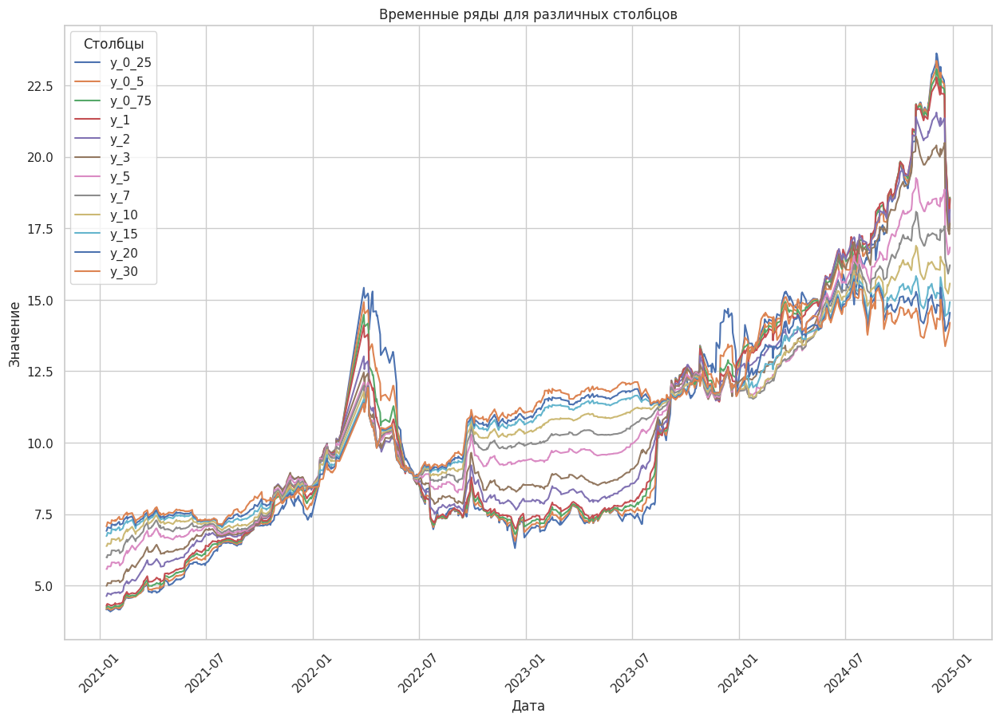

In [48]:
plot_columns(df_risk2, ['y_0_25', 'y_0_5', 'y_0_75', 'y_1', 'y_2','y_3', 'y_5', 'y_7', 'y_10', 'y_15', 'y_20', 'y_30'], single_plot=True)  # % ставки по разным срокам

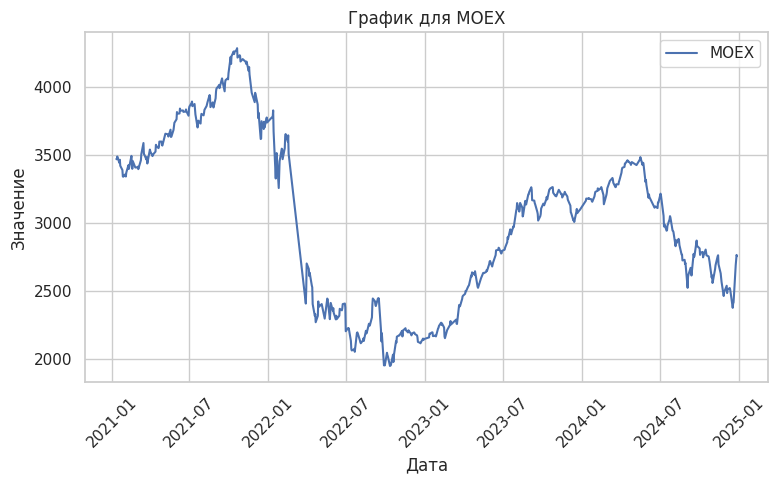

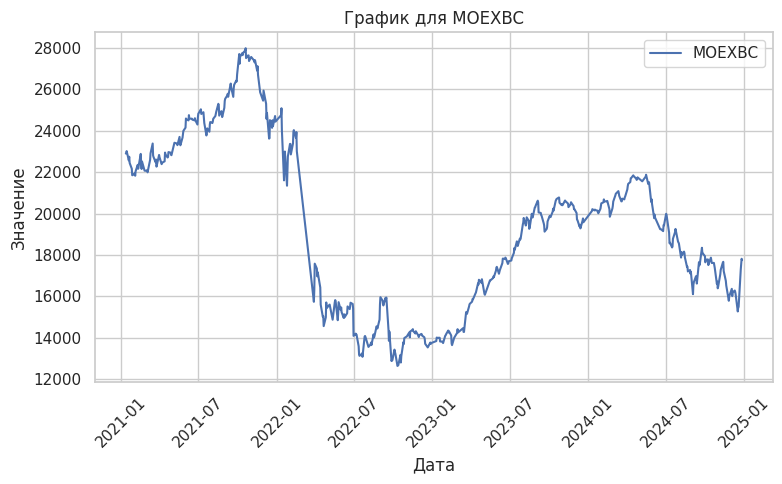

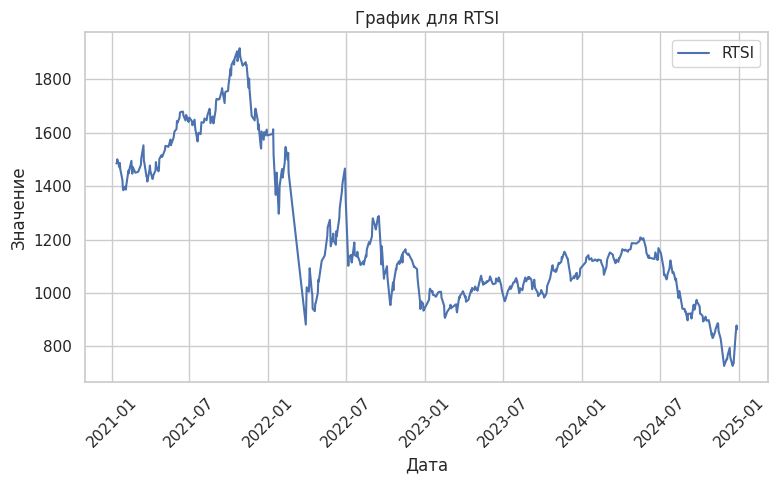

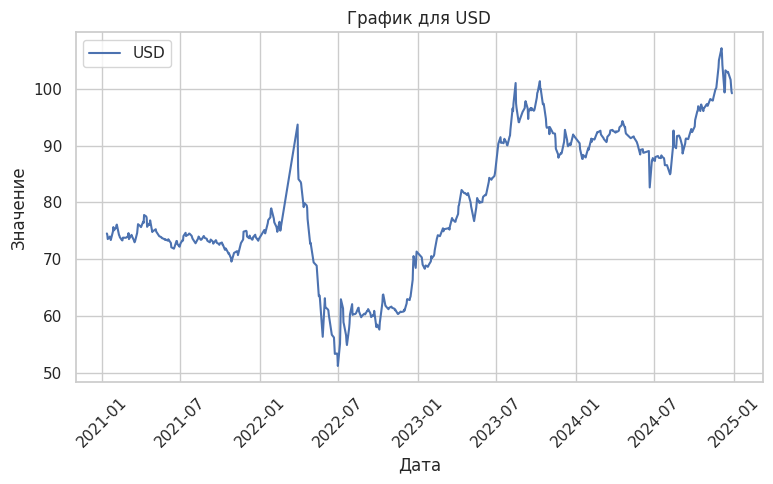

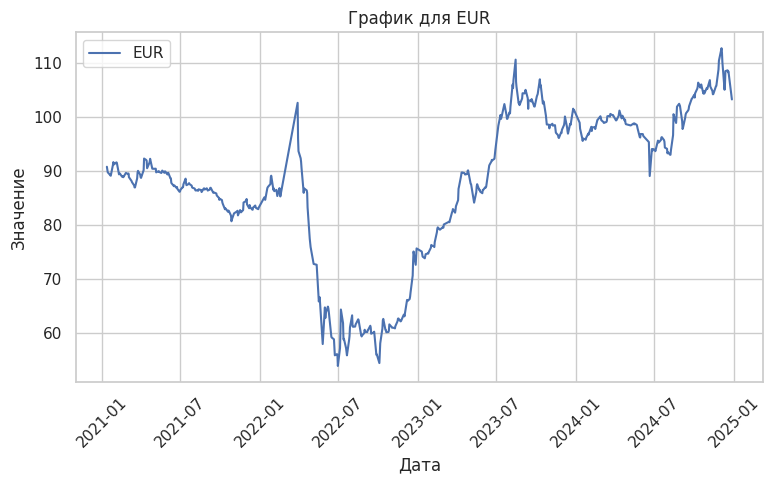

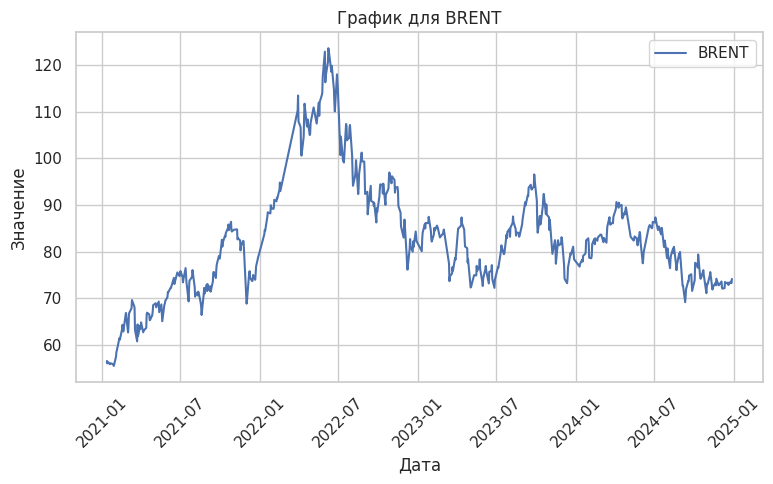

In [49]:
plot_columns(df_risk2, ['MOEX'], single_plot=False) 
plot_columns(df_risk2, ['MOEXBC'], single_plot=False) 
plot_columns(df_risk2, ['RTSI'], single_plot=False) 
plot_columns(df_risk2, ['USD'], single_plot=False) 
plot_columns(df_risk2, ['EUR'], single_plot=False) 
plot_columns(df_risk2, ['BRENT'], single_plot=False) 

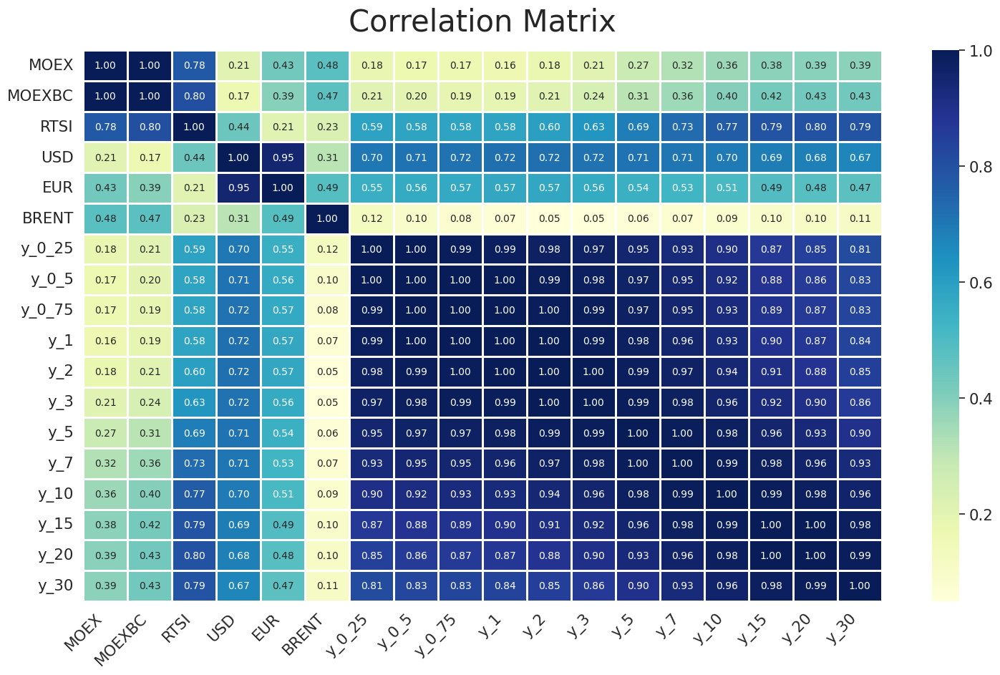

In [50]:
plot_corr_matrix(df_risk2)

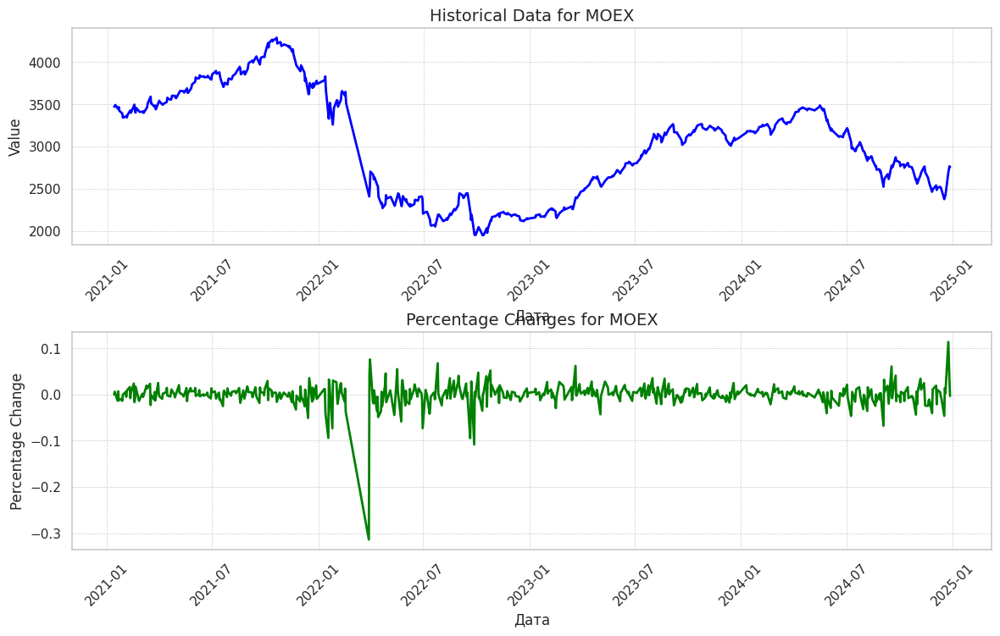

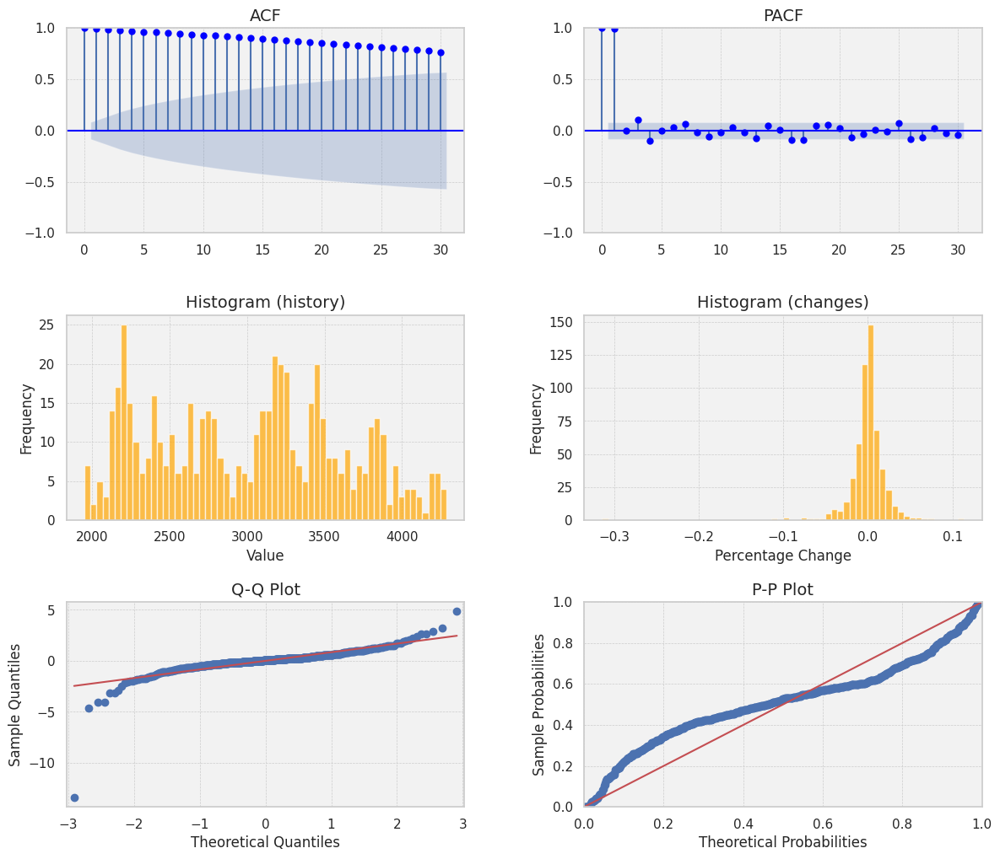

MOEX
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.584)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.857)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.915)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.422)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


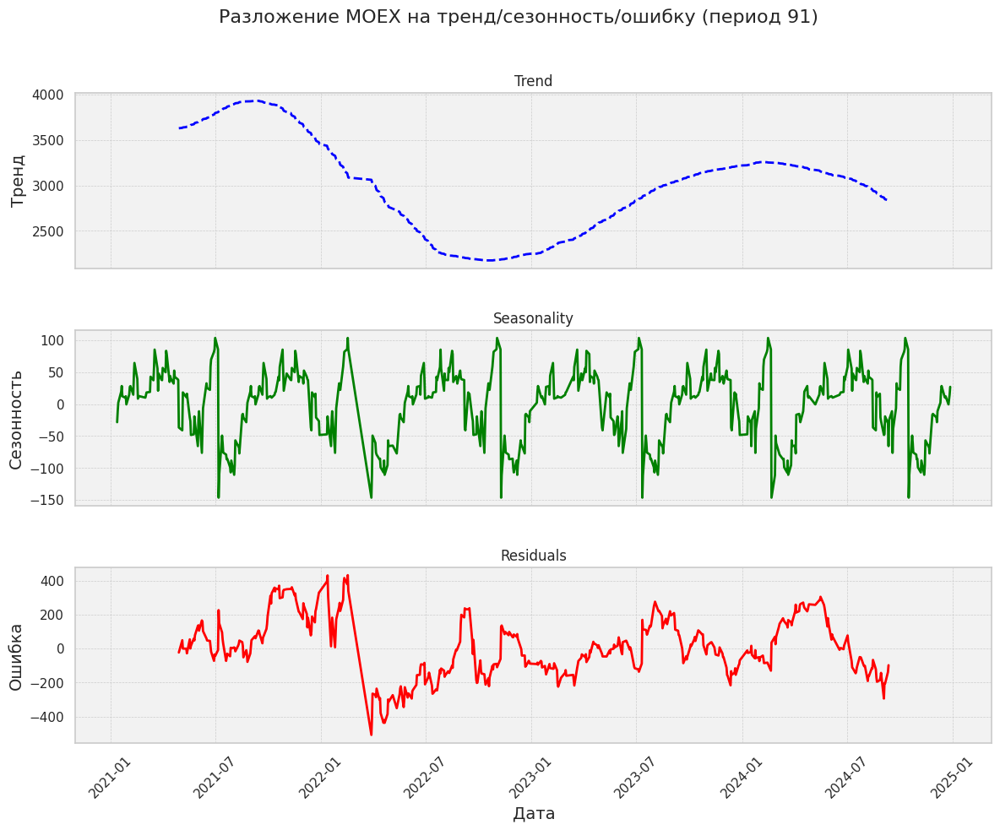

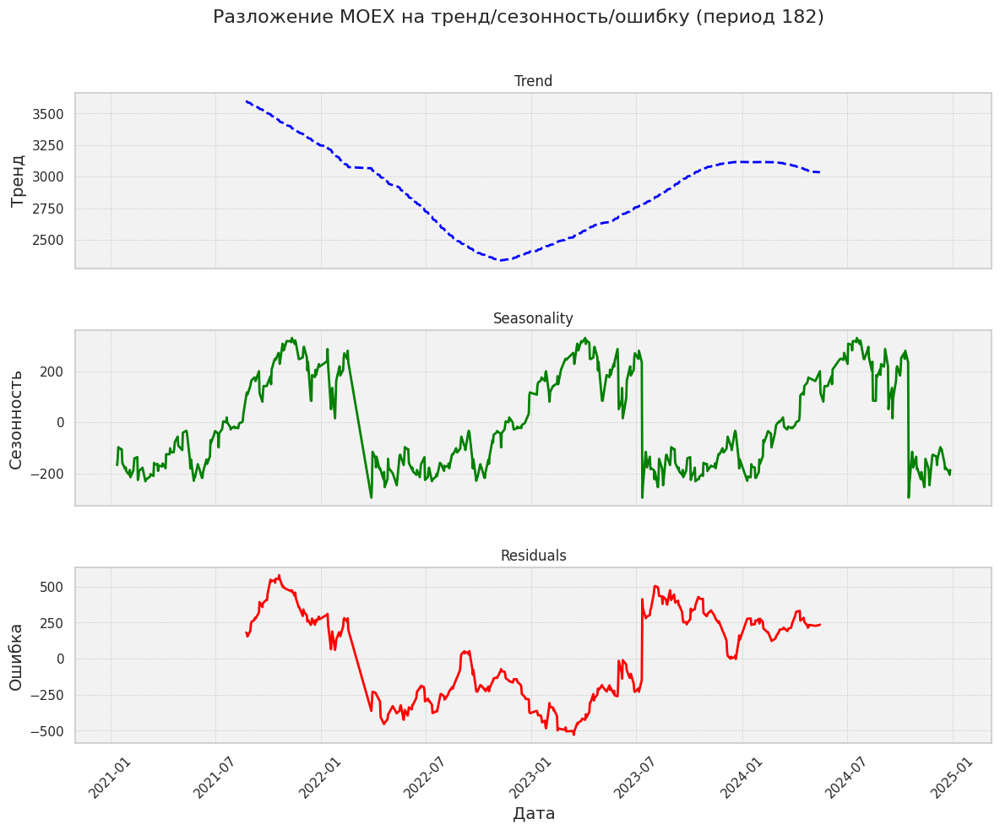

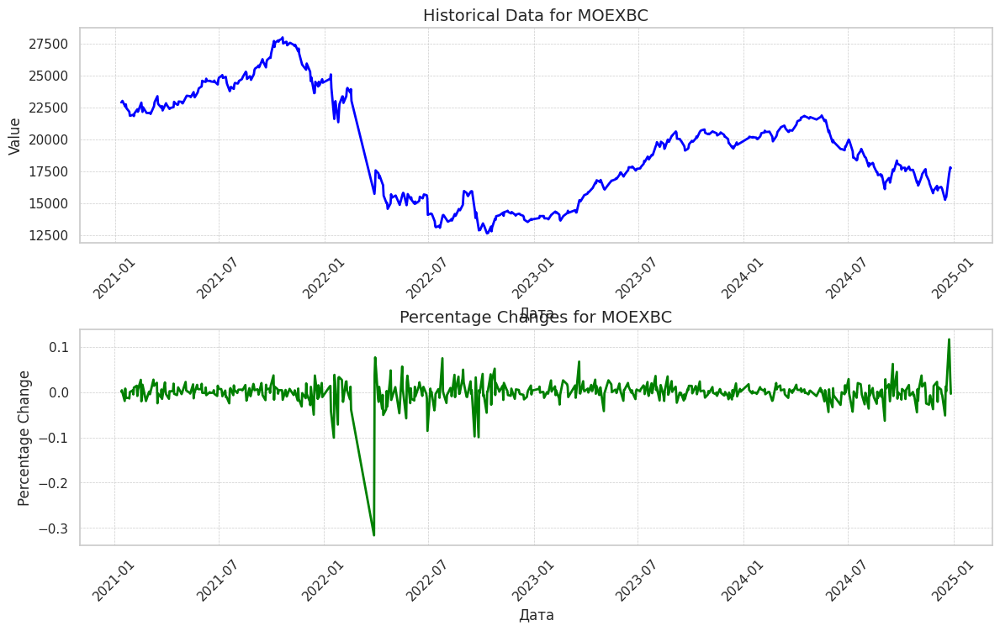

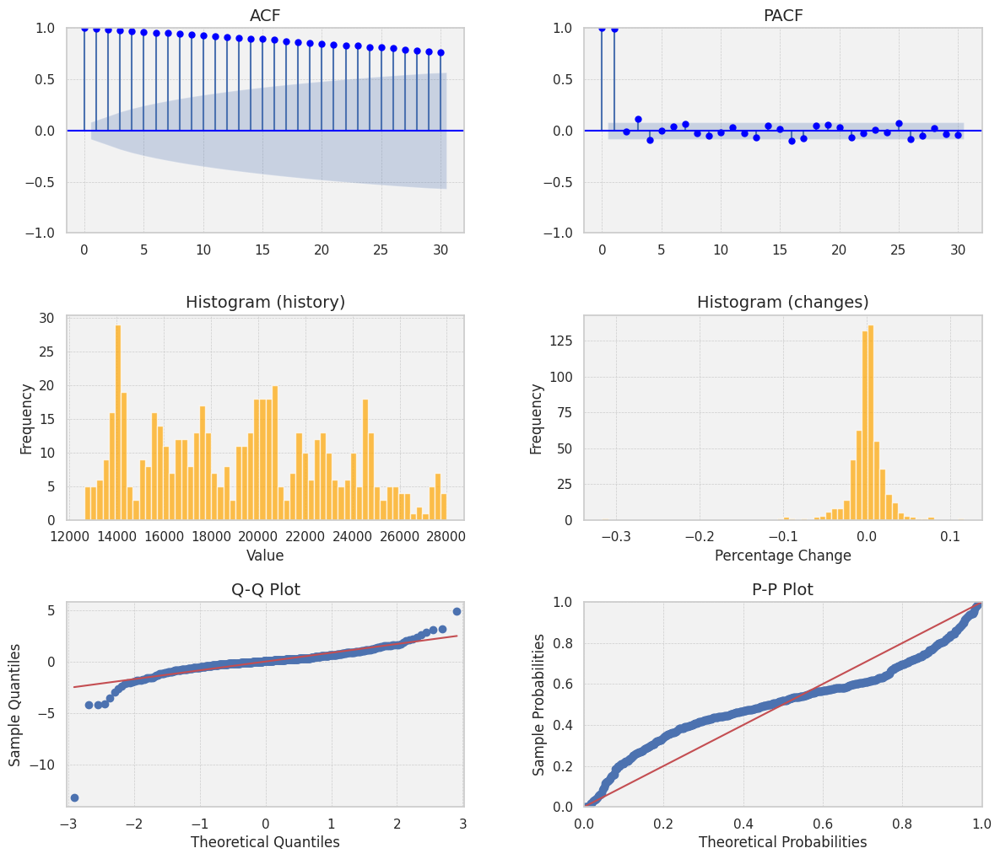

MOEXBC
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.552)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.841)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.895)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.405)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


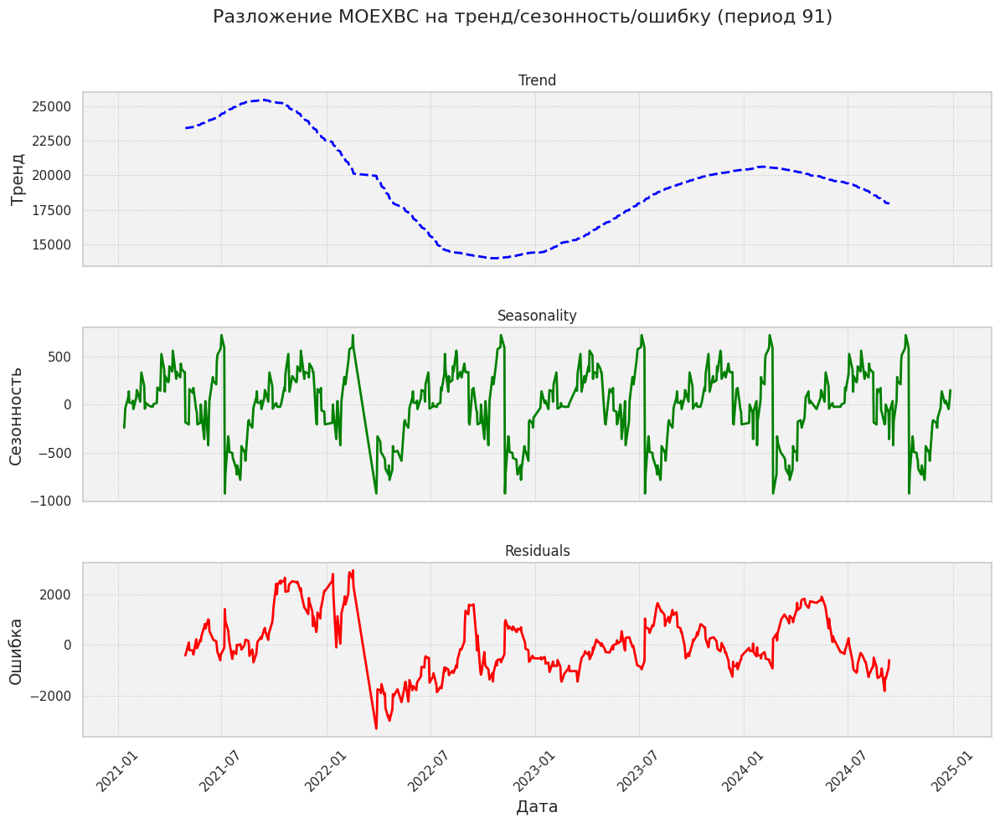

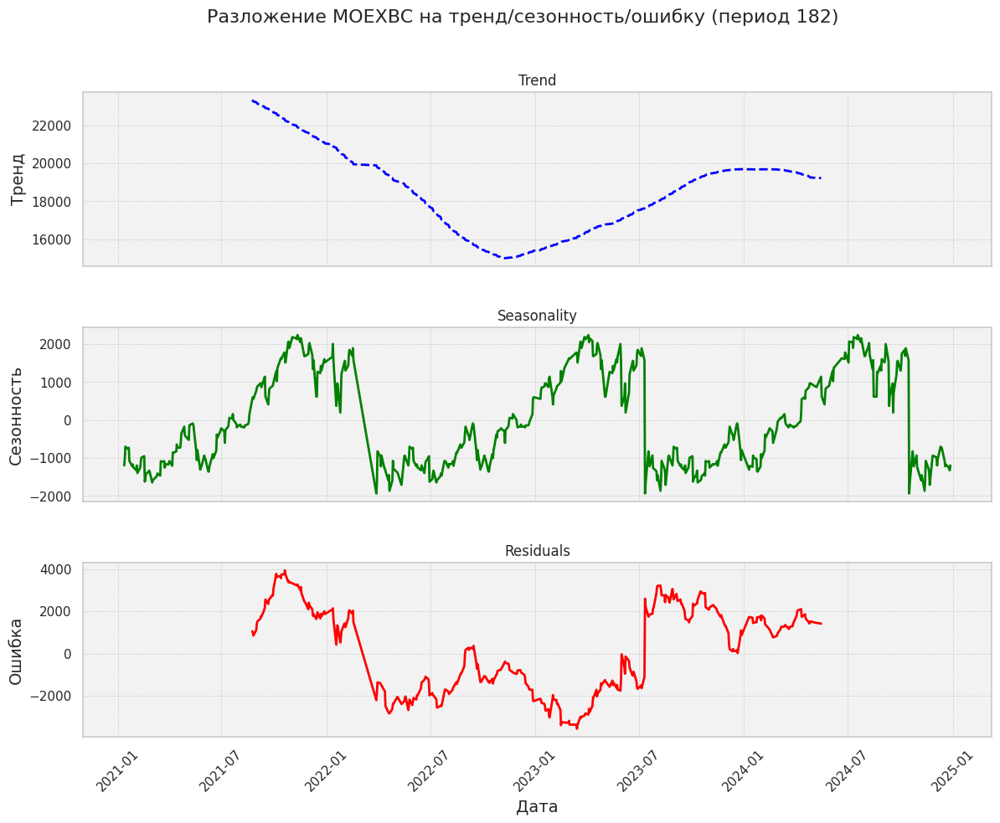

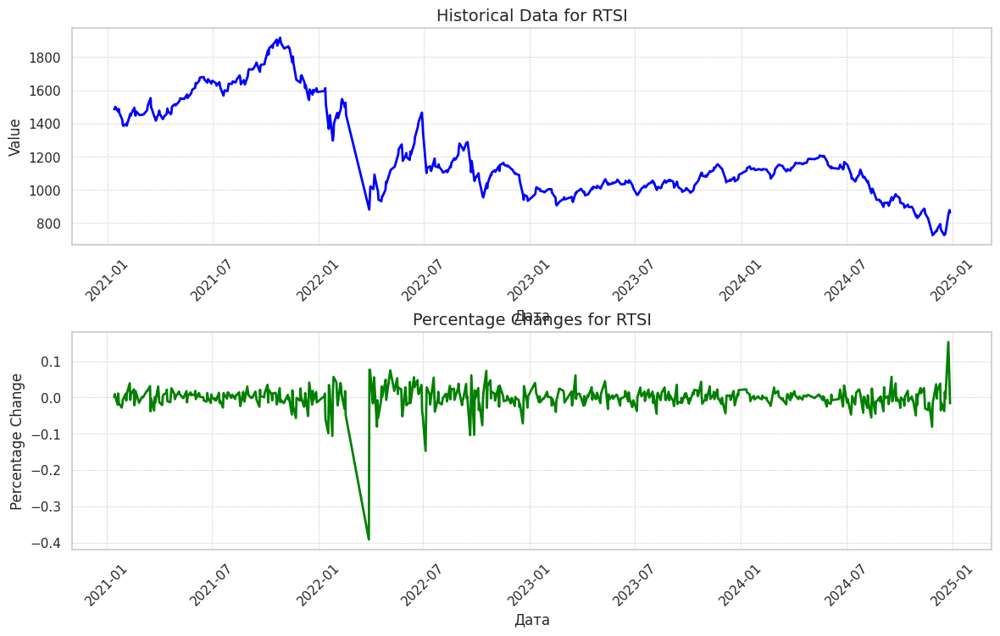

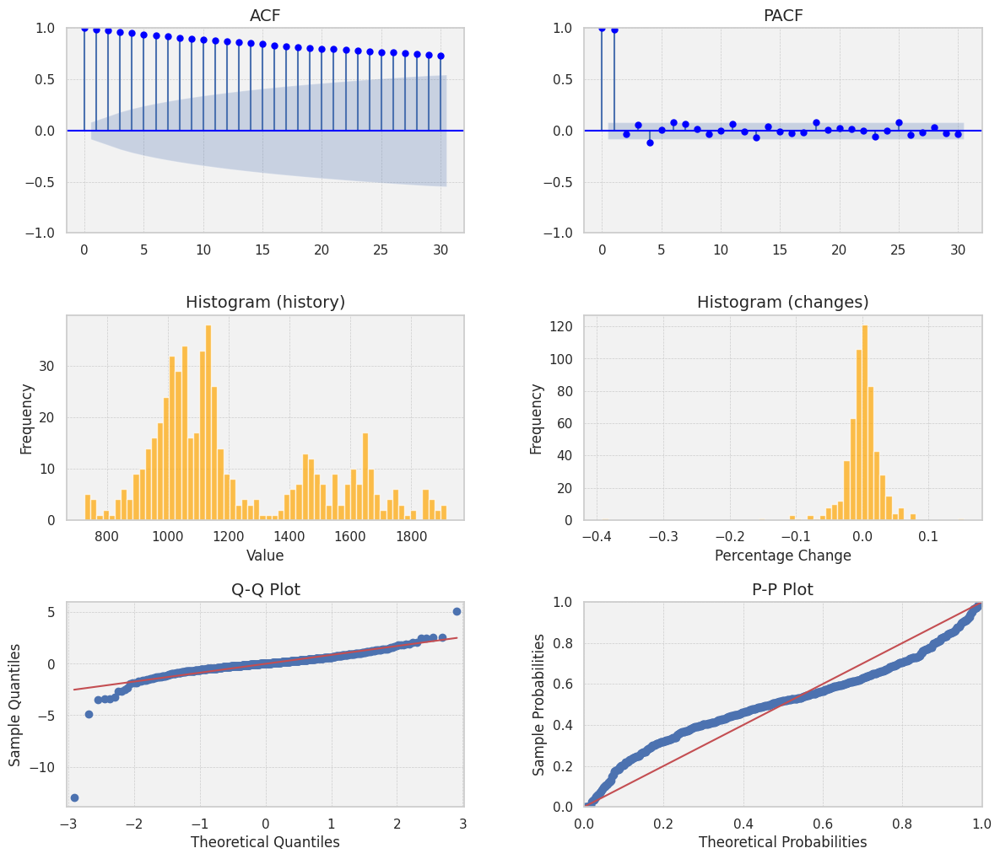

RTSI
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.593)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.335)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.411)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.283)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


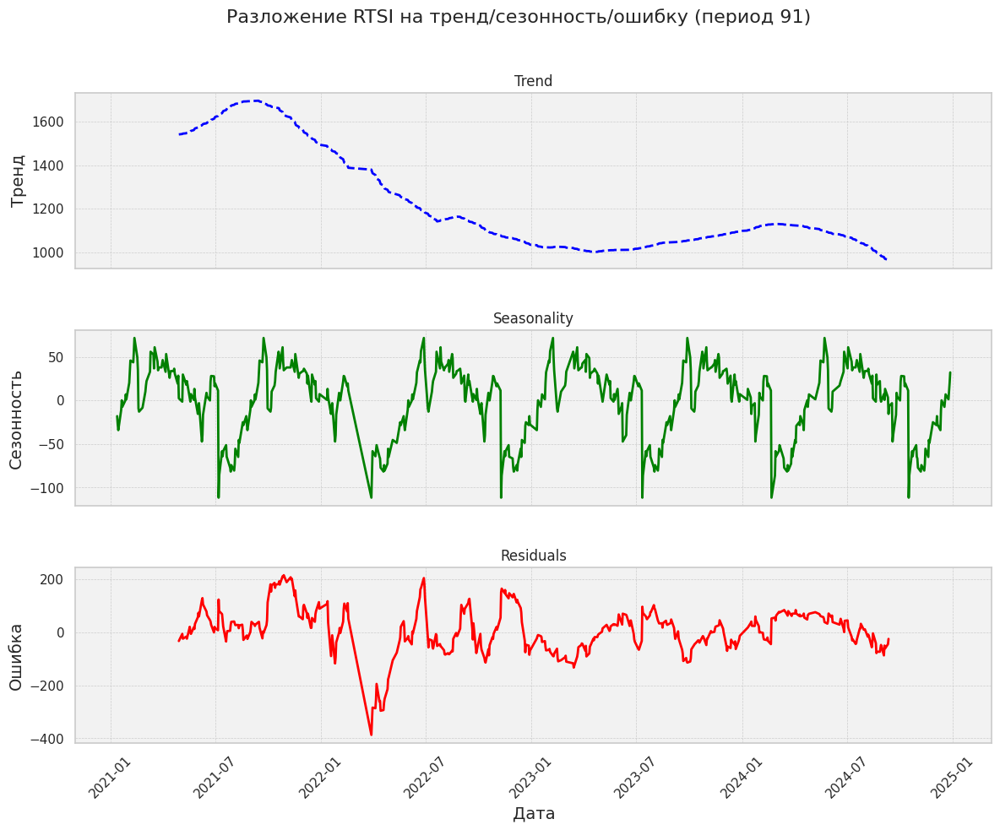

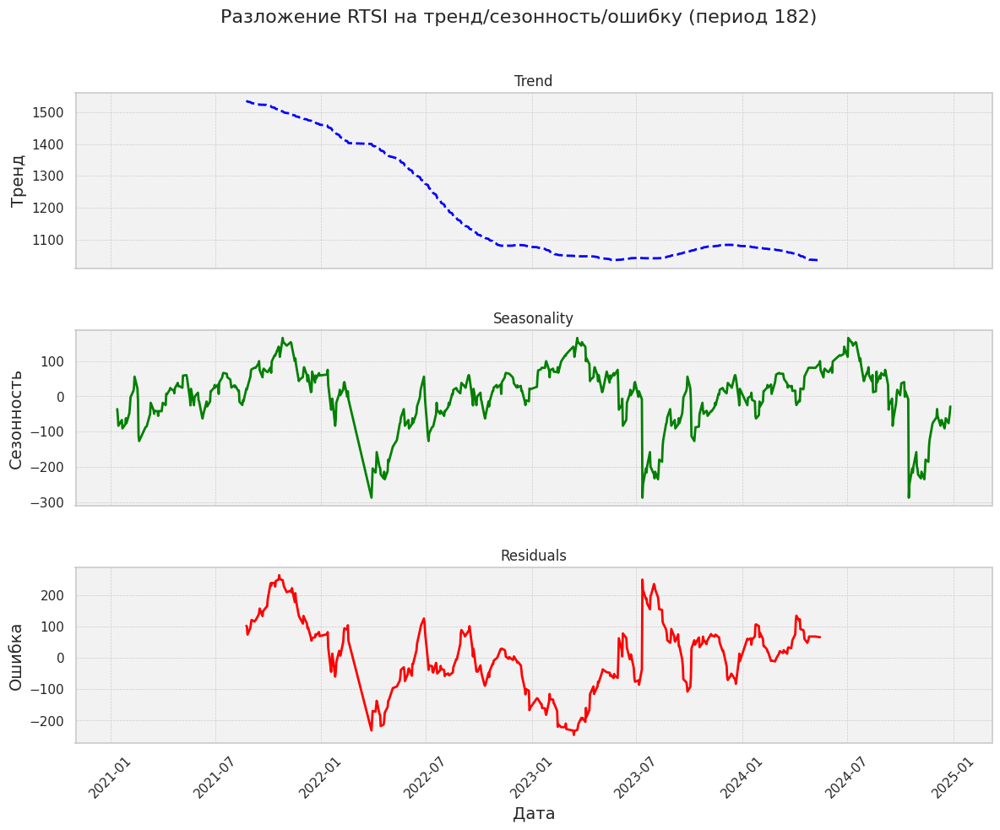

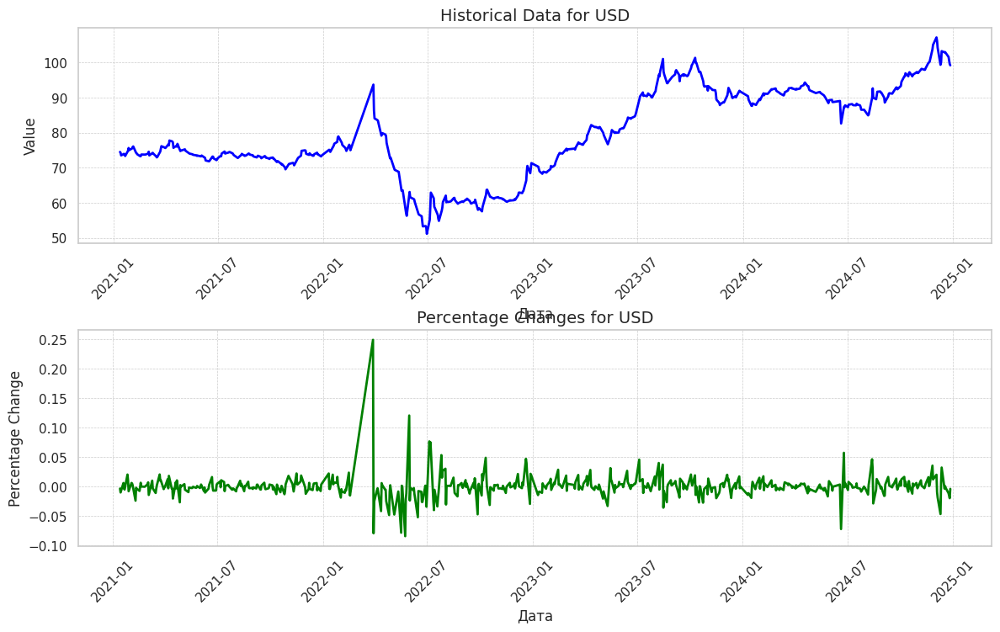

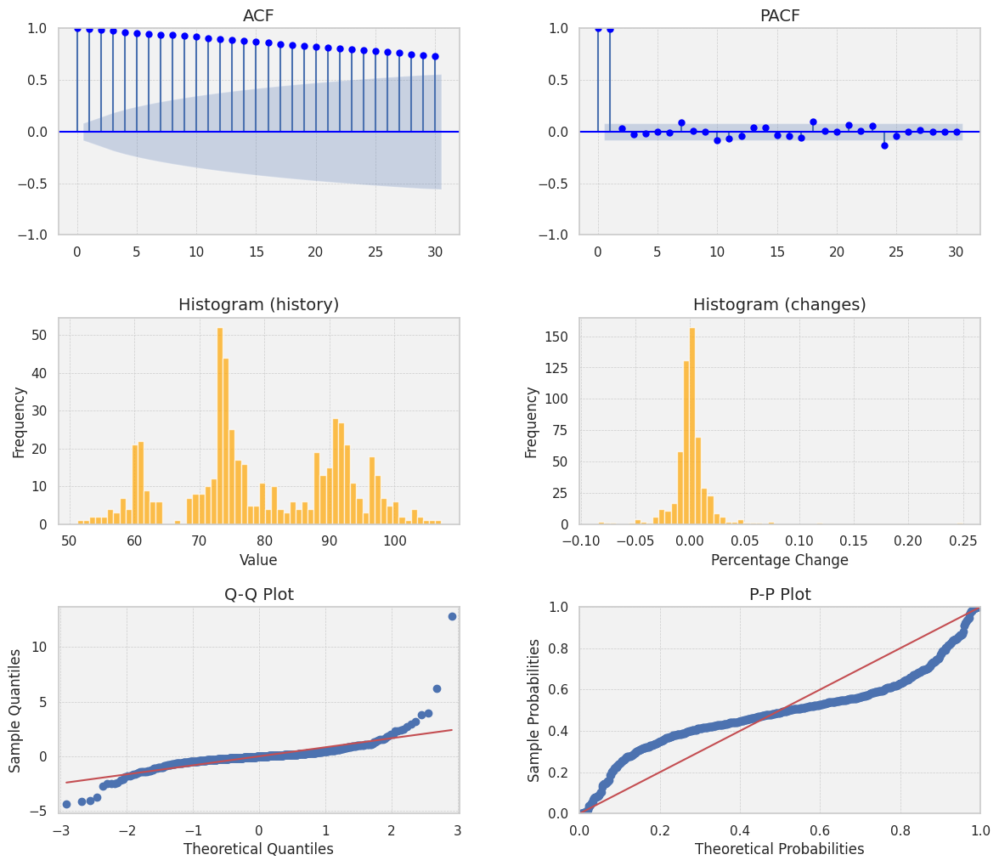

USD
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.773)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.575)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.751)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.854)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


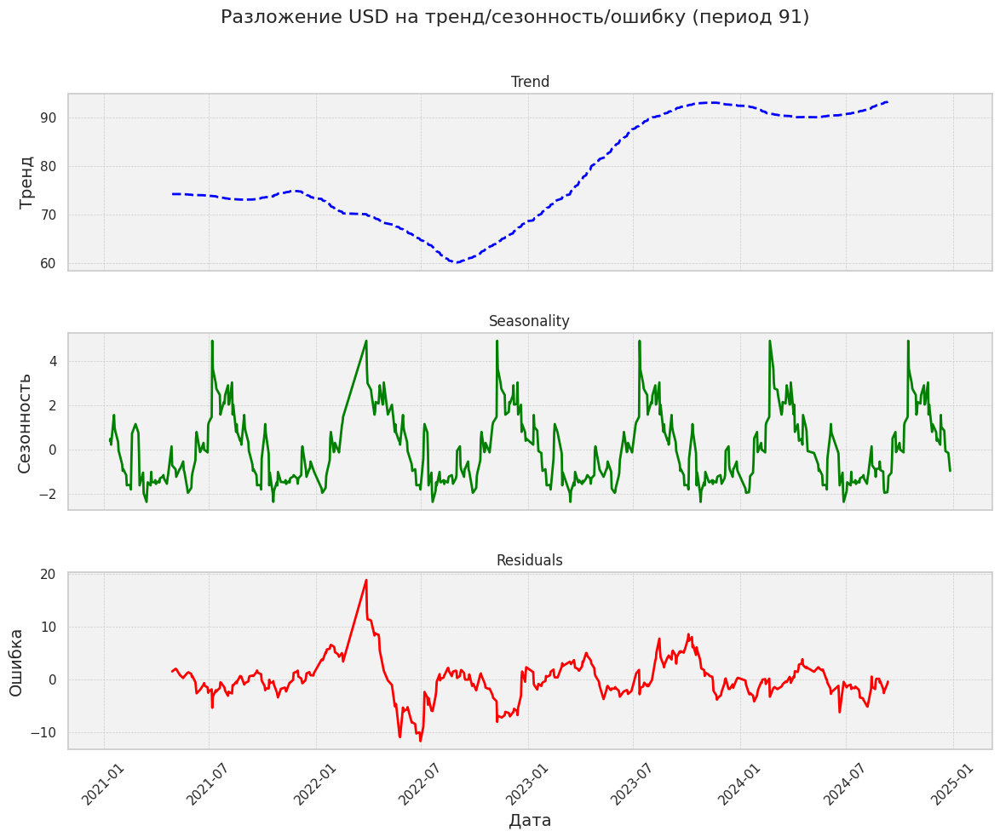

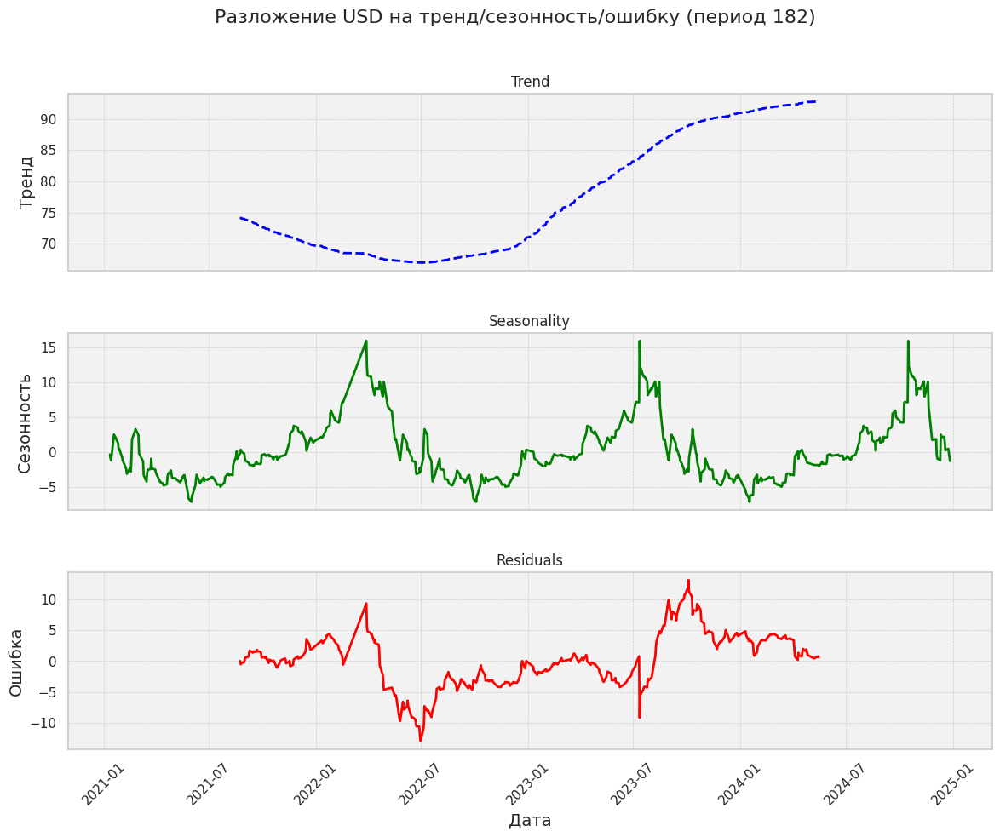

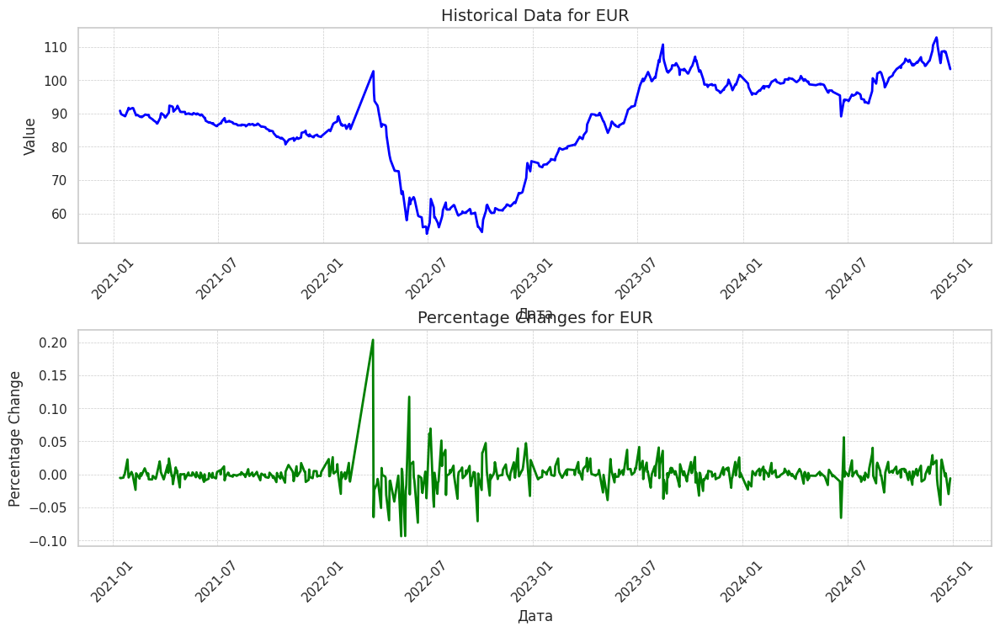

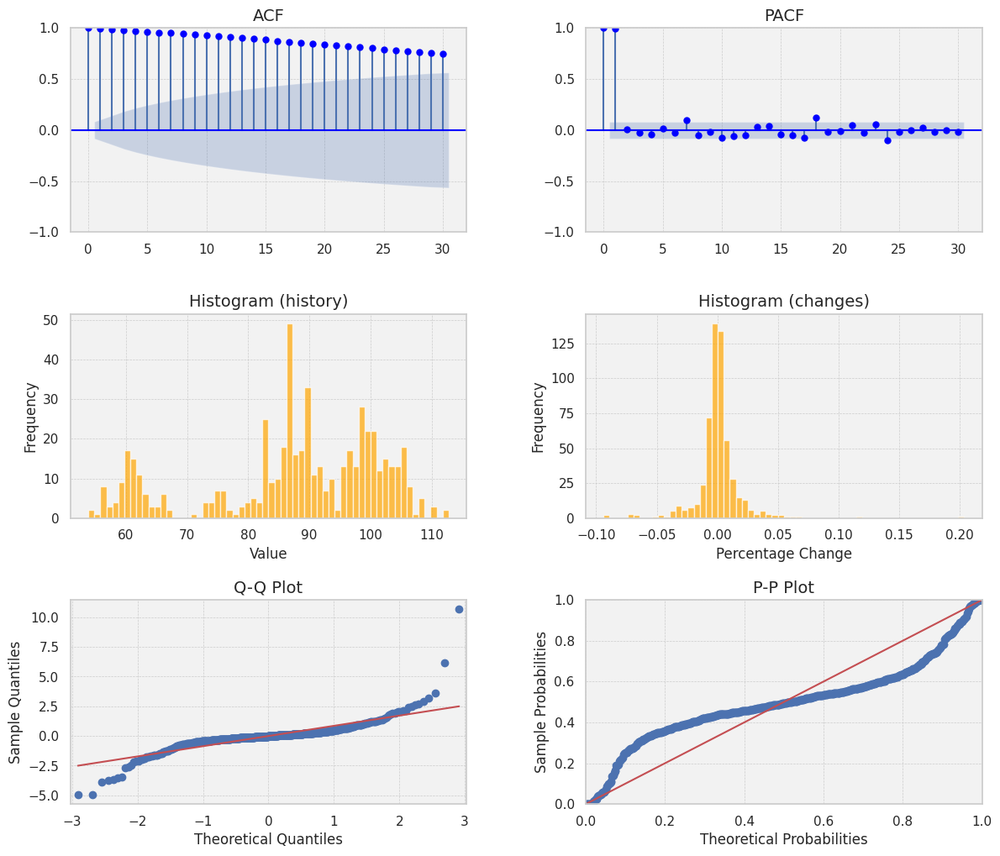

EUR
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.603)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.633)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.859)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.713)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


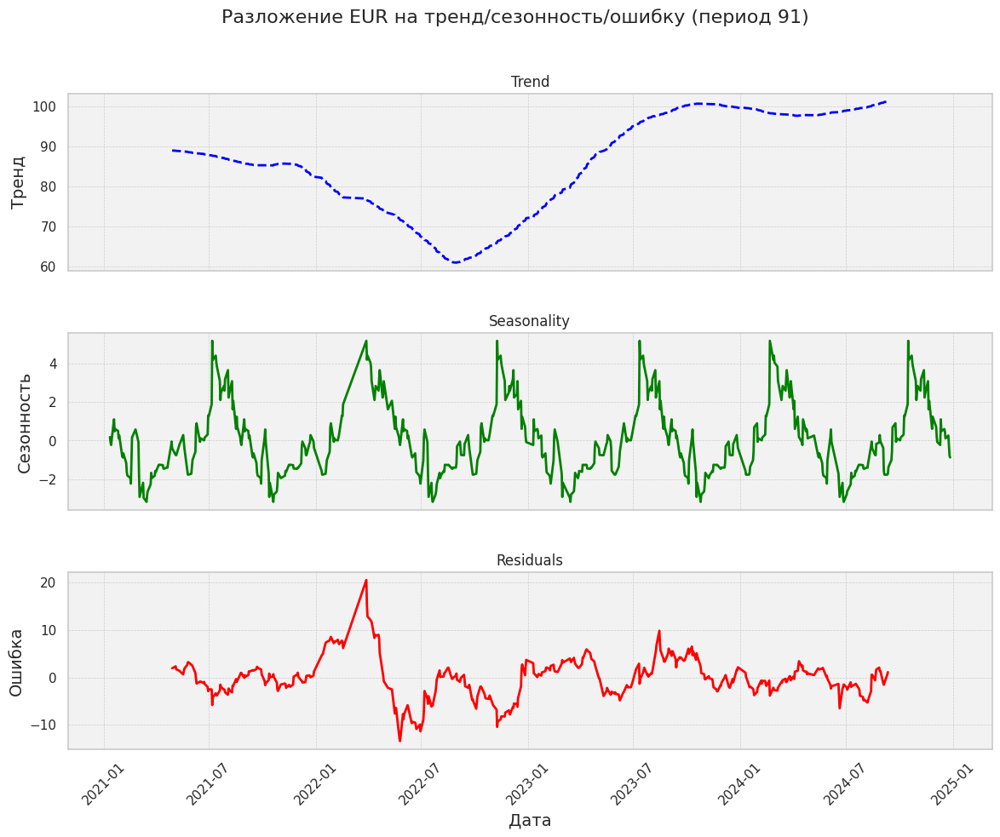

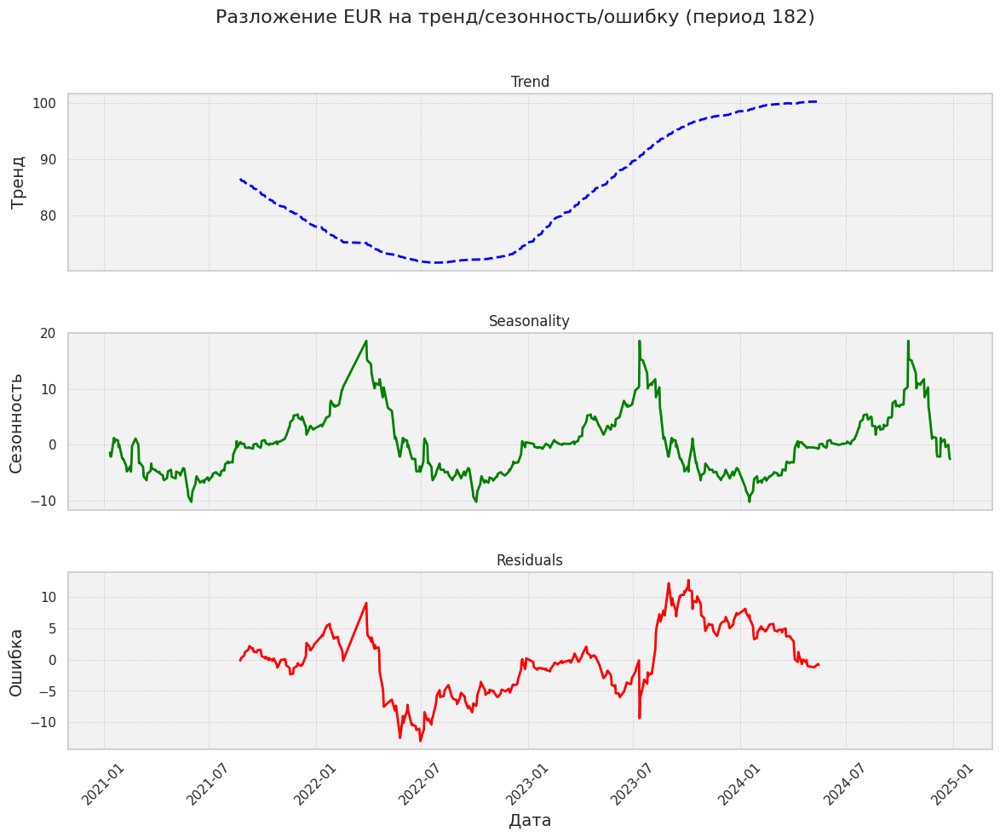

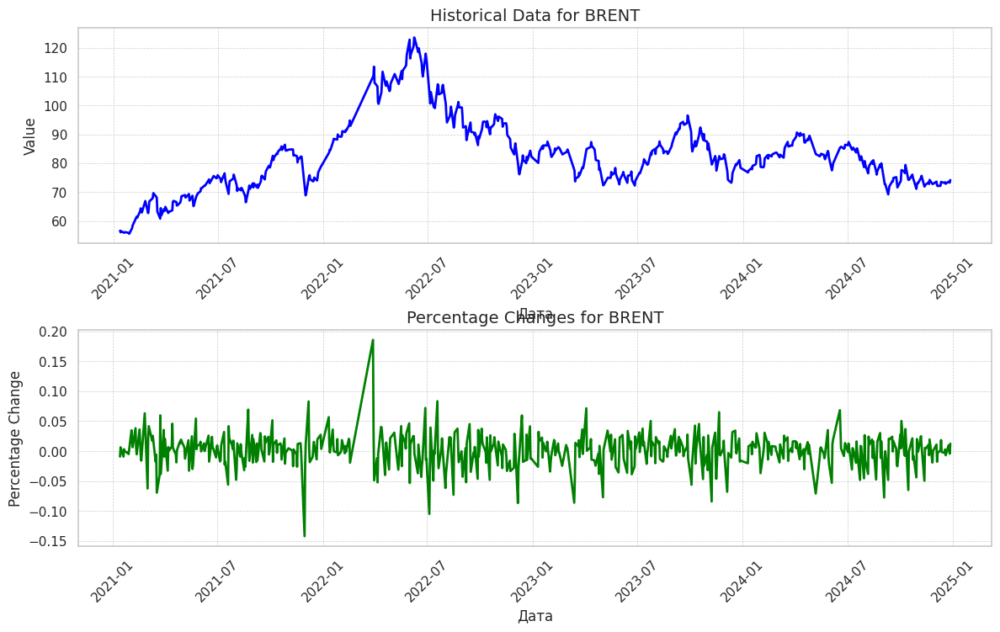

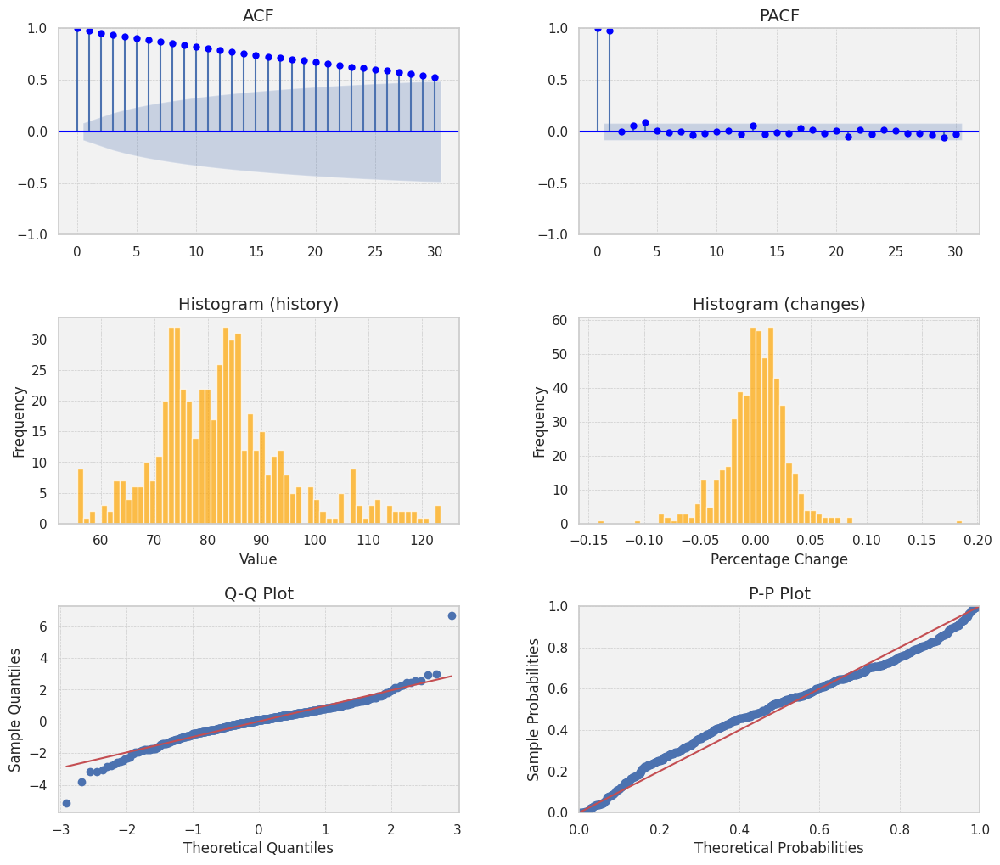

BRENT
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.129)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.420)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.613)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.698)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


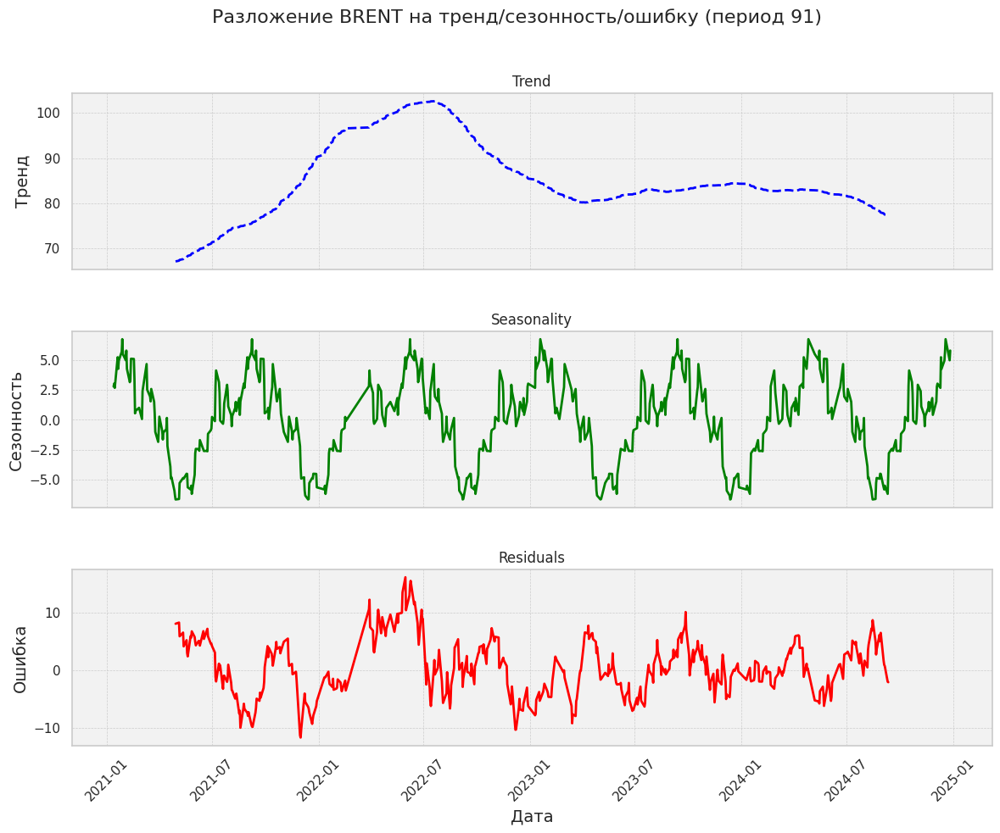

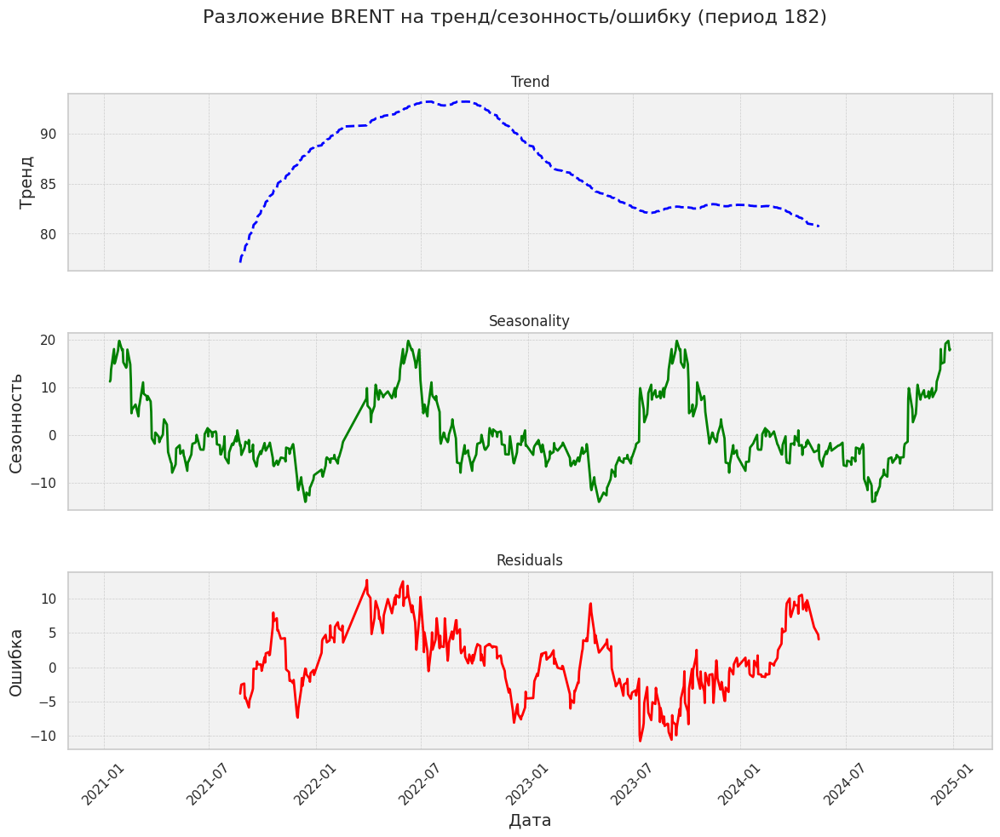

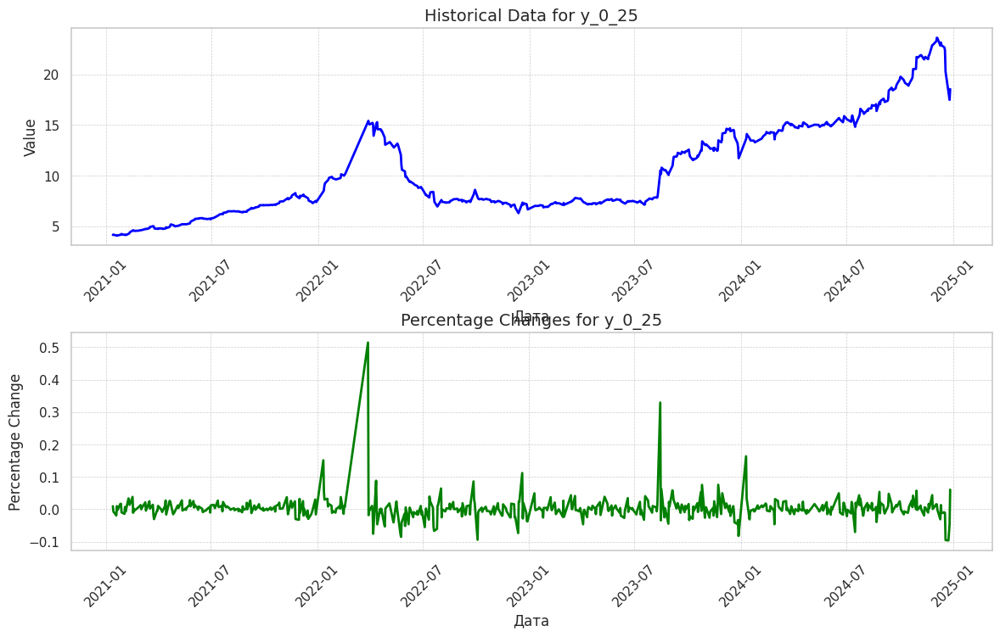

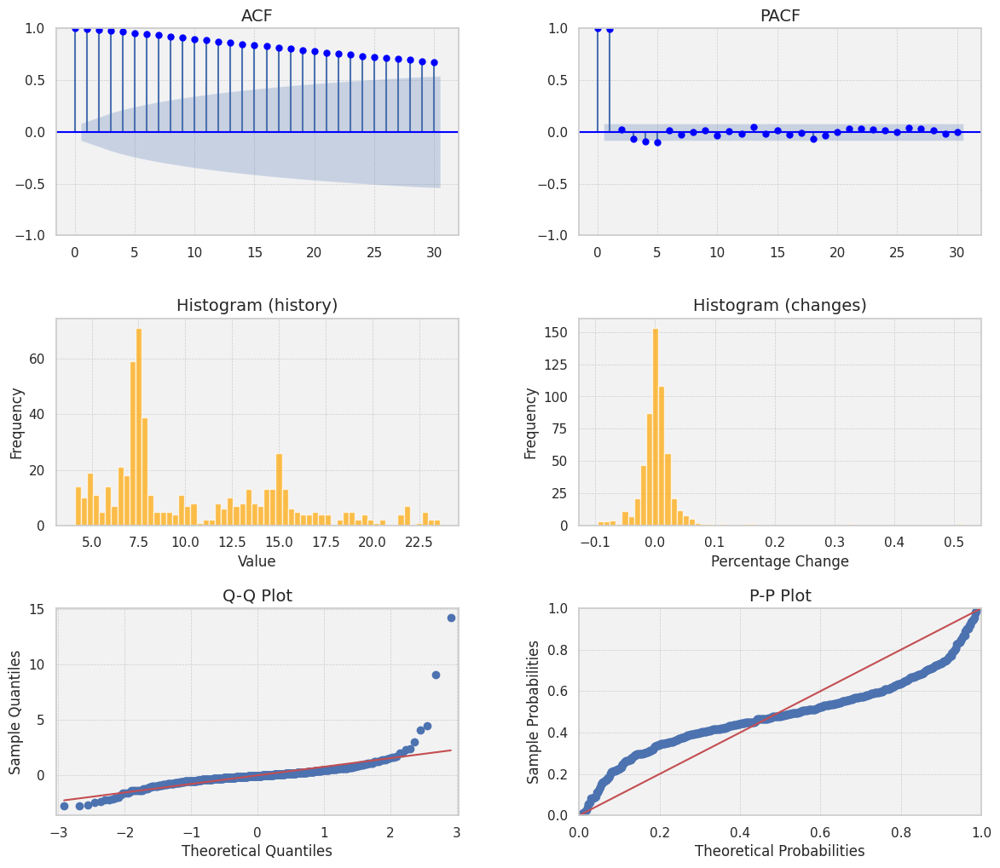

y_0_25
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.856)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.713)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.683)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.934)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


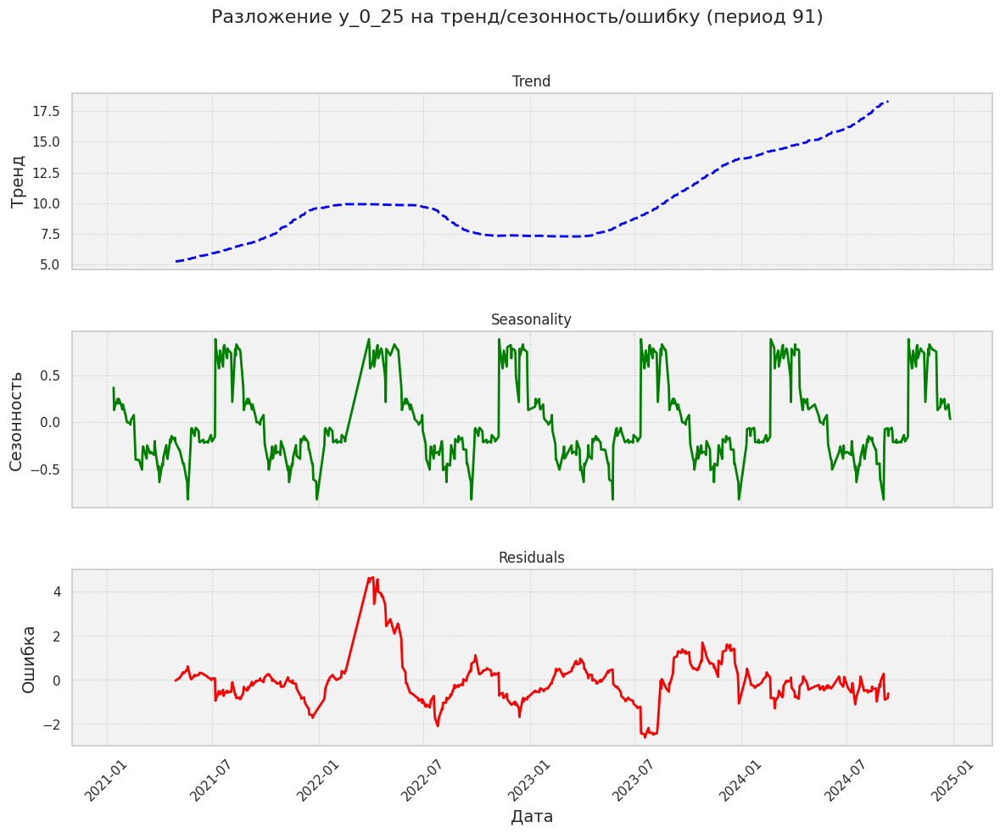

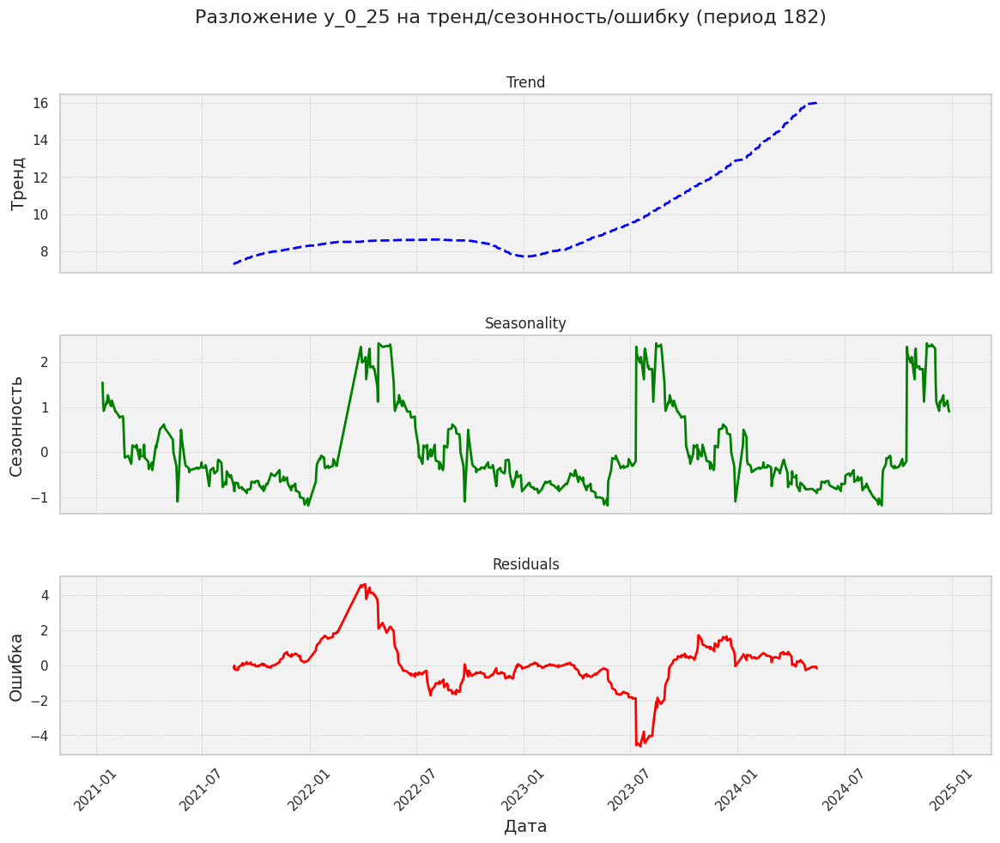

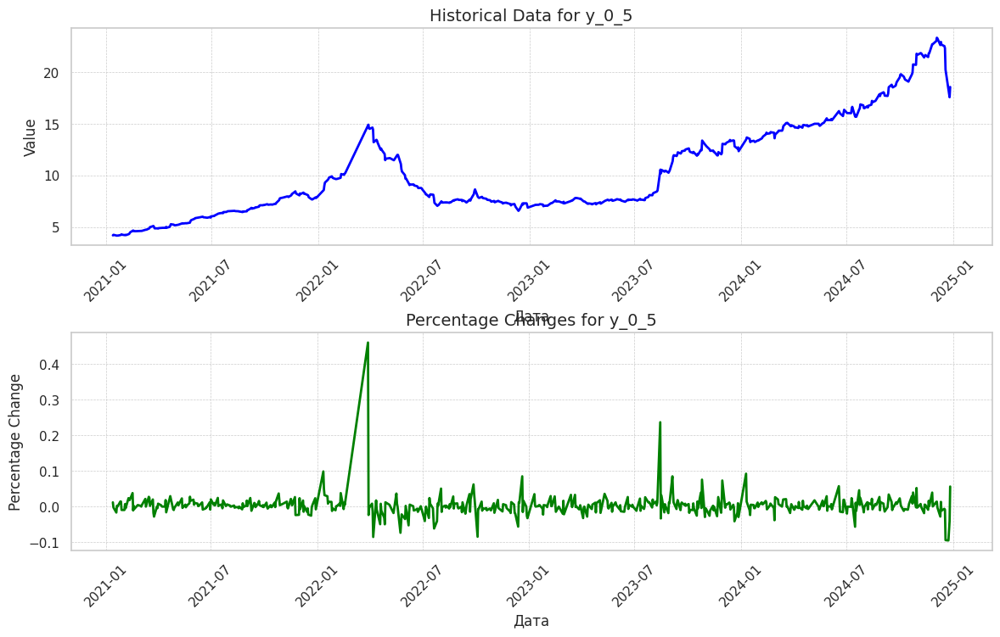

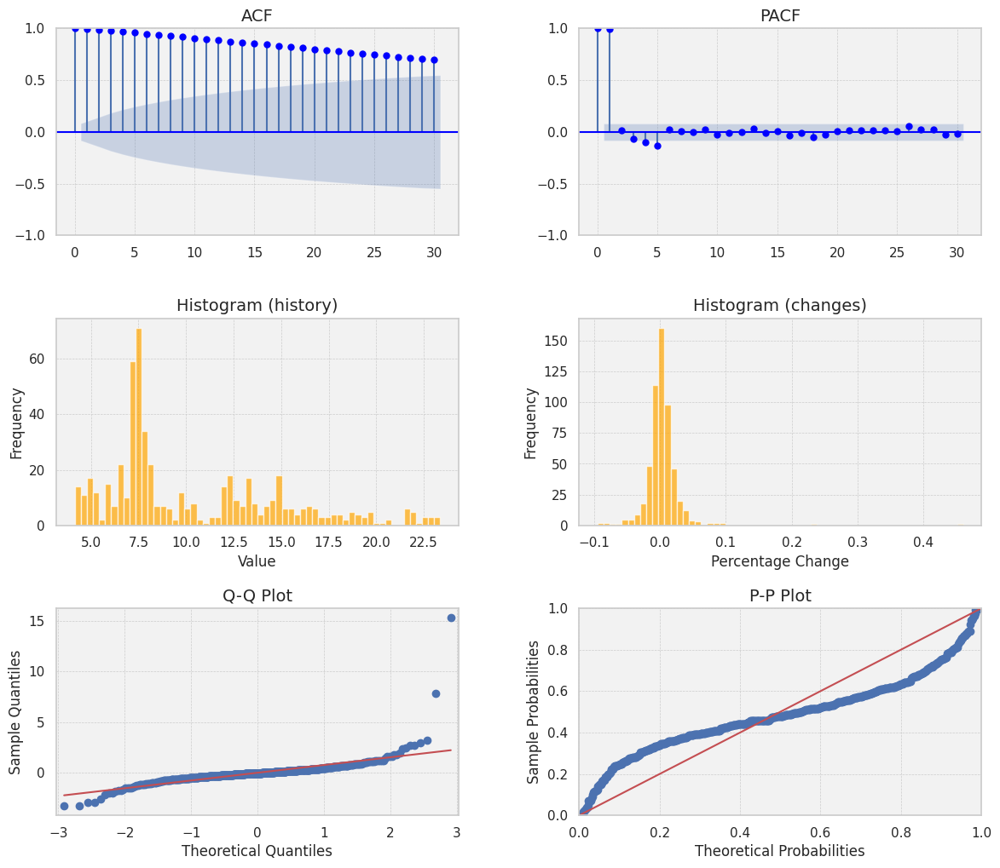

y_0_5
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.908)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.791)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.643)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.964)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


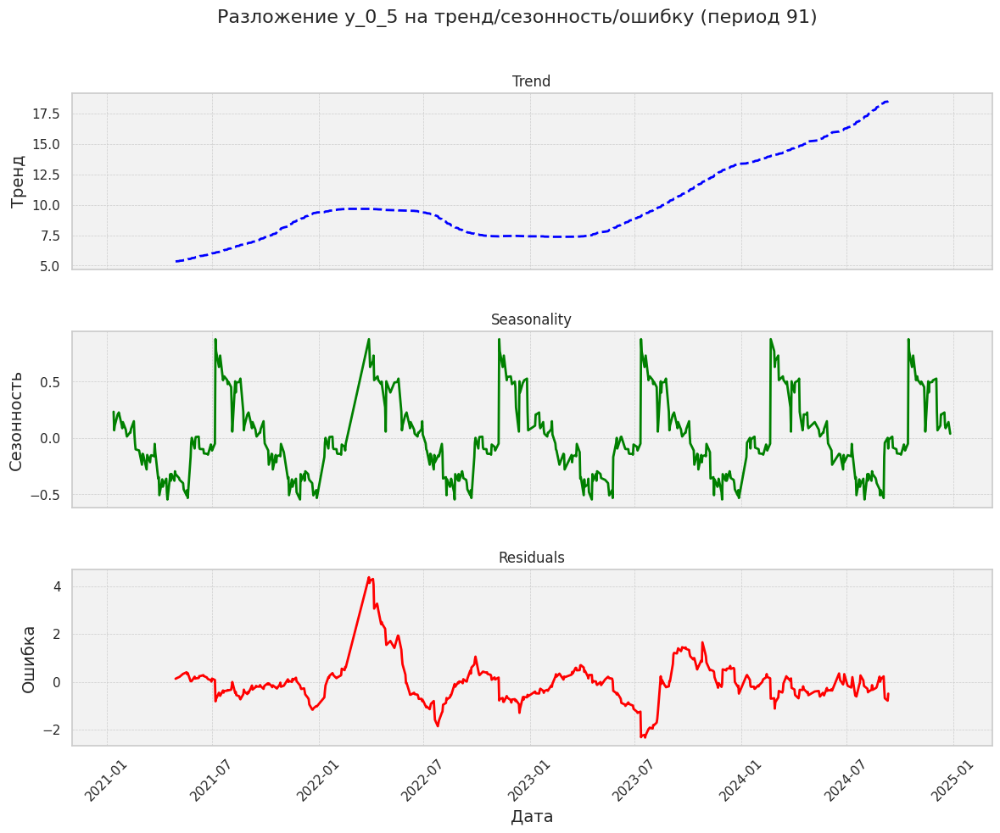

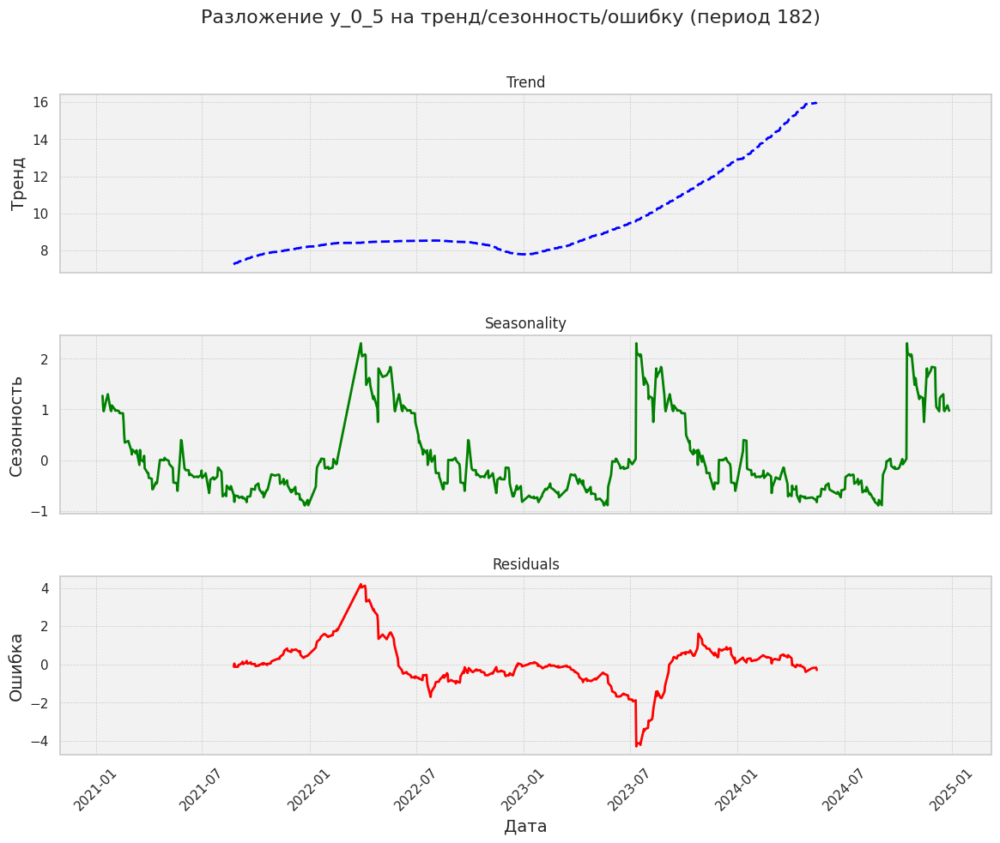

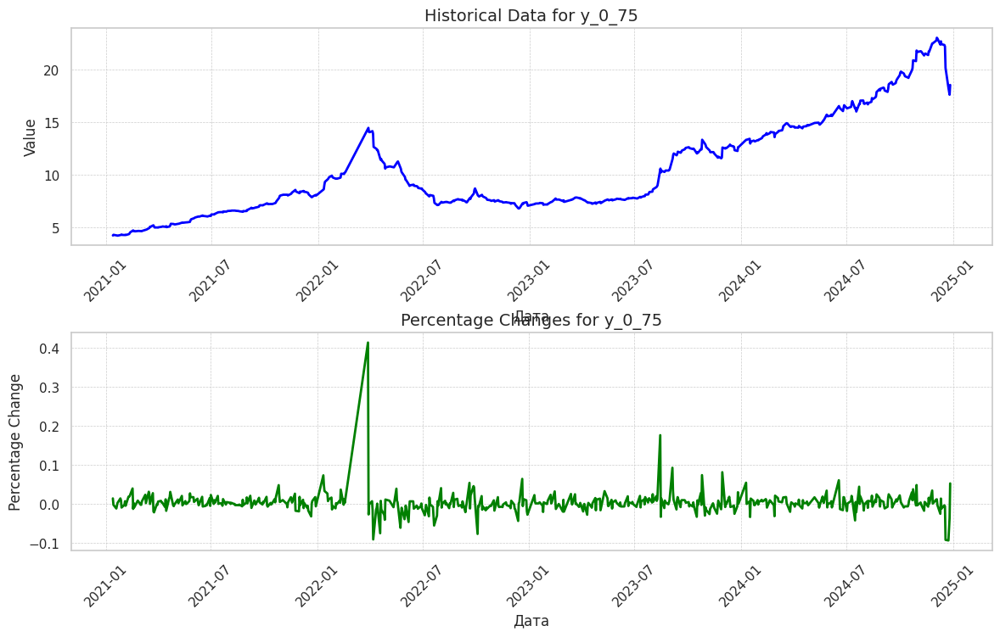

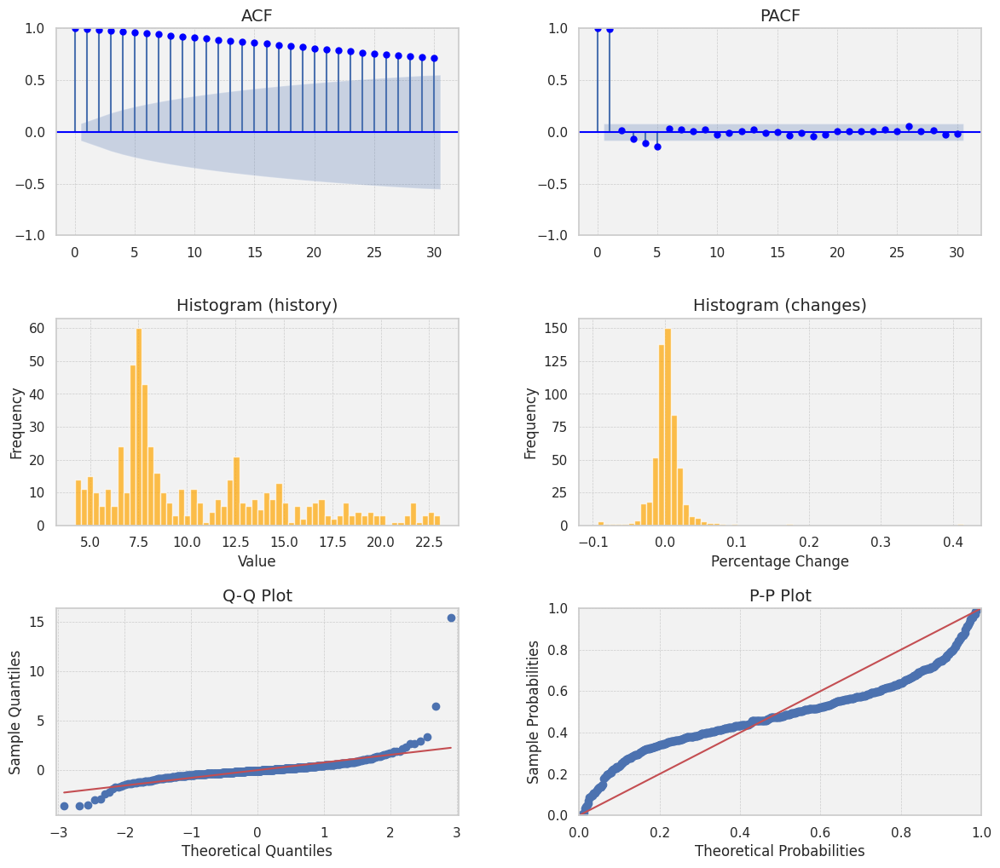

y_0_75
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.924)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.819)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.635)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.975)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


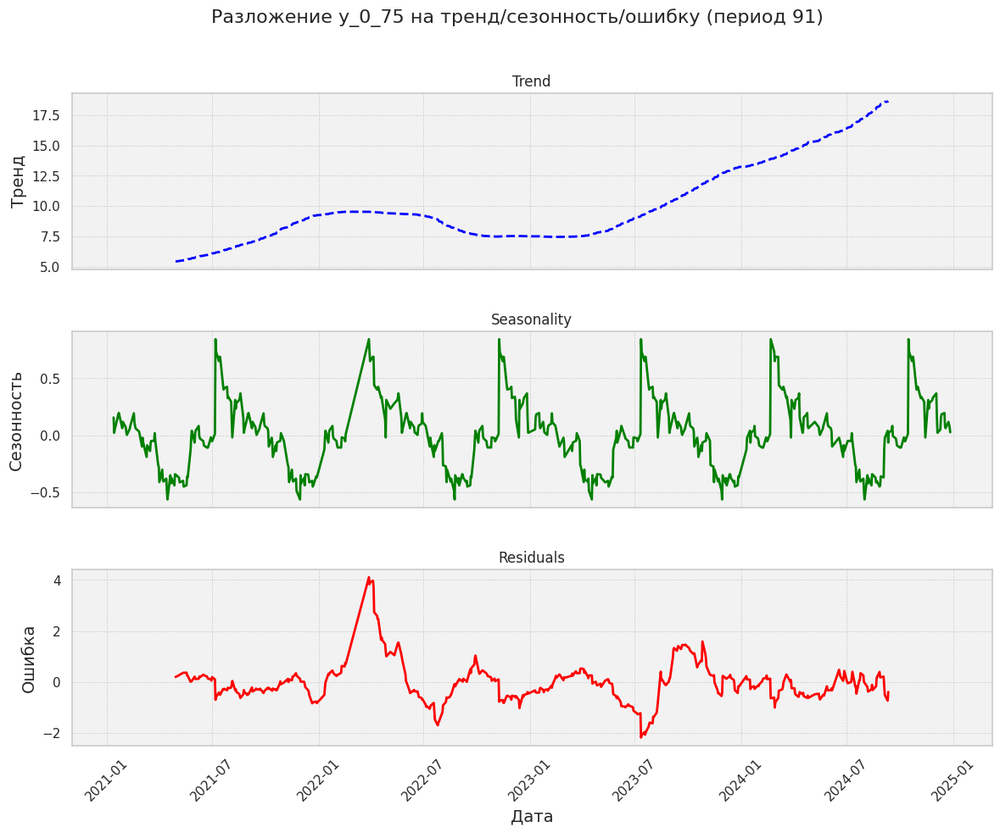

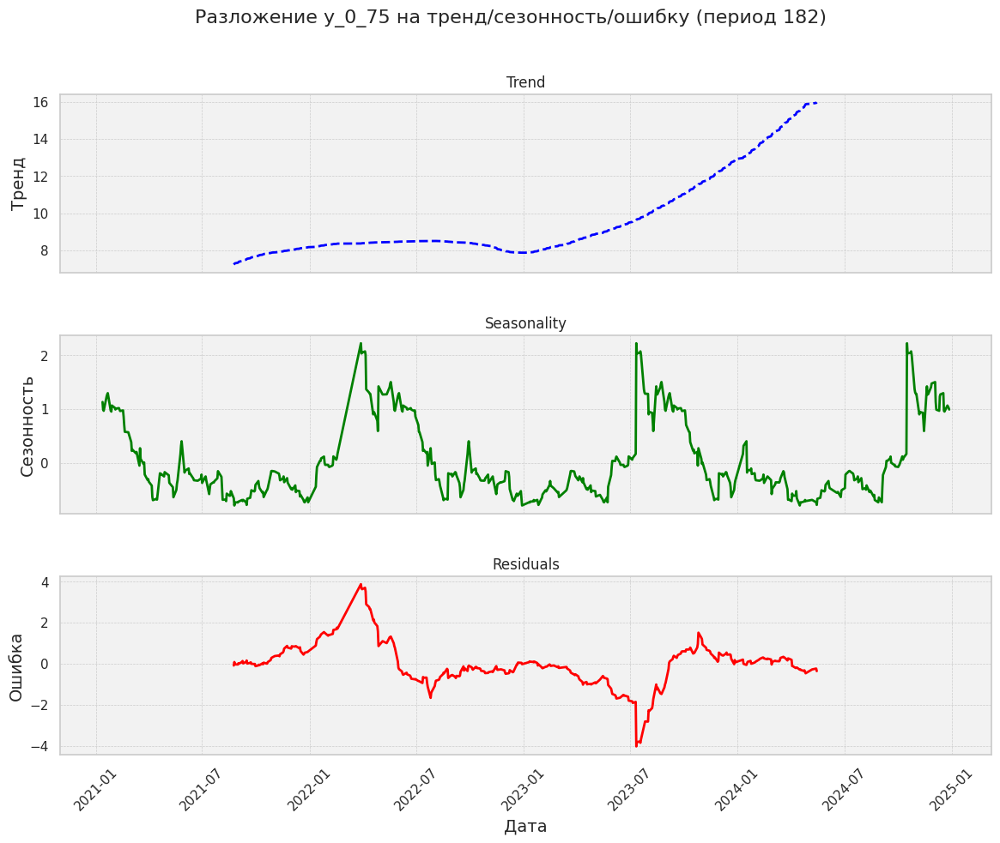

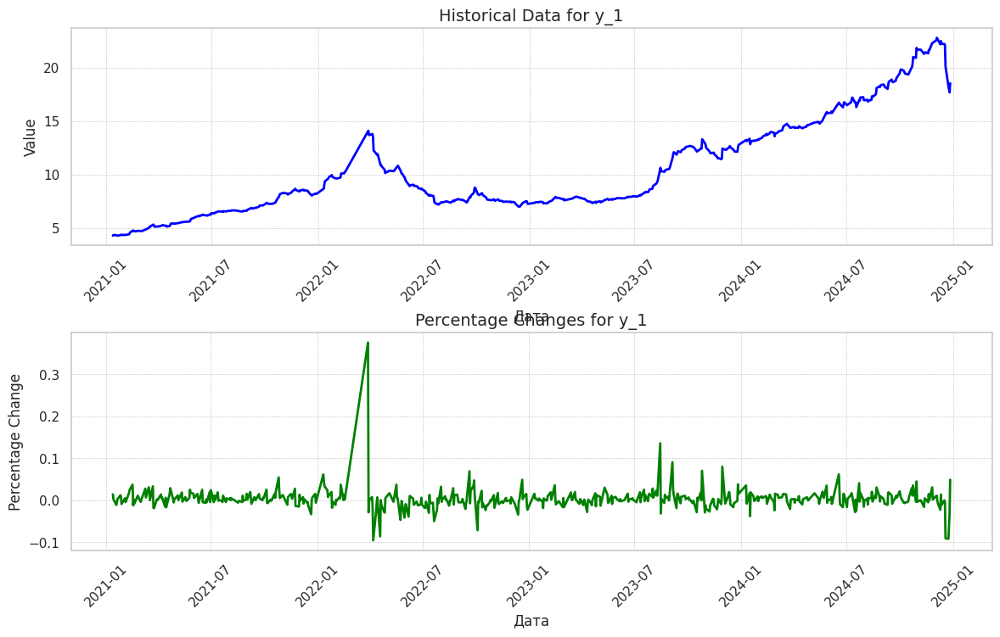

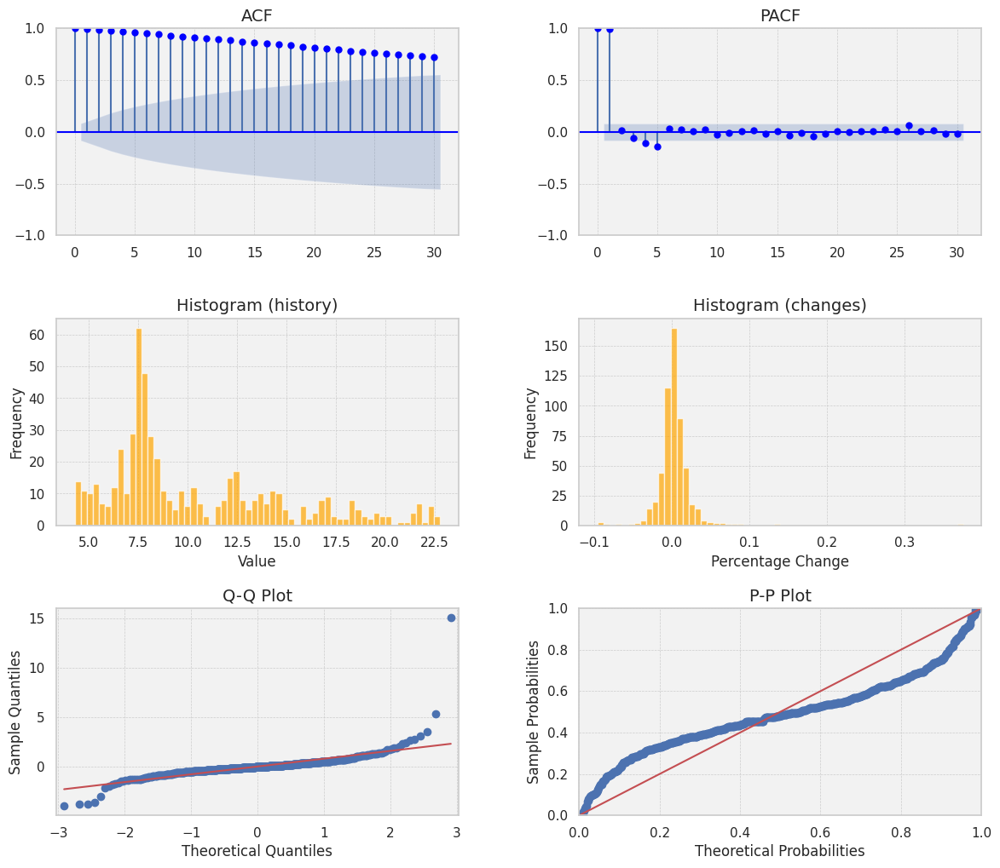

y_1
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.934)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.839)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.633)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.981)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


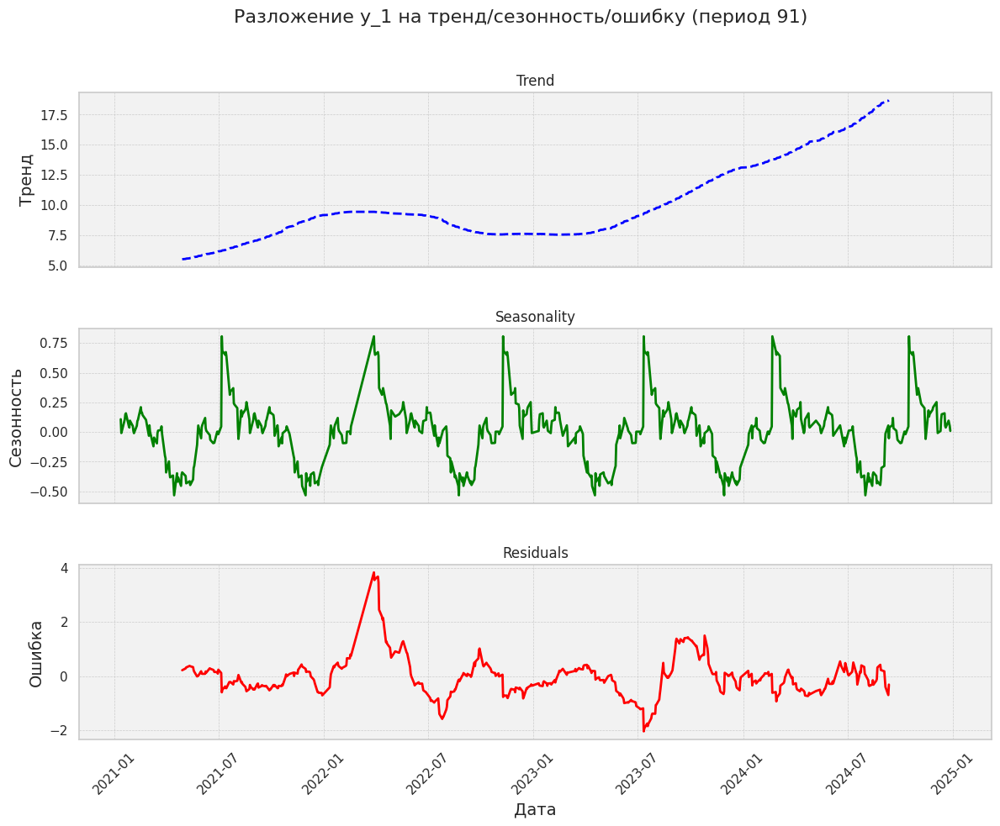

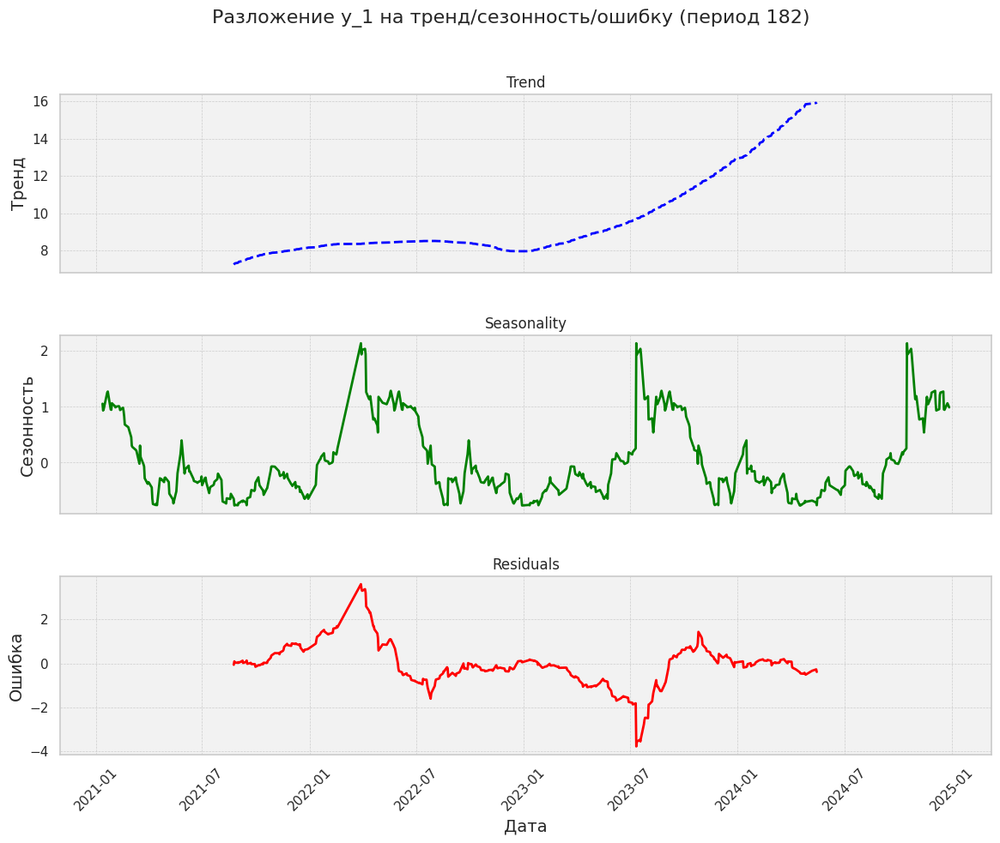

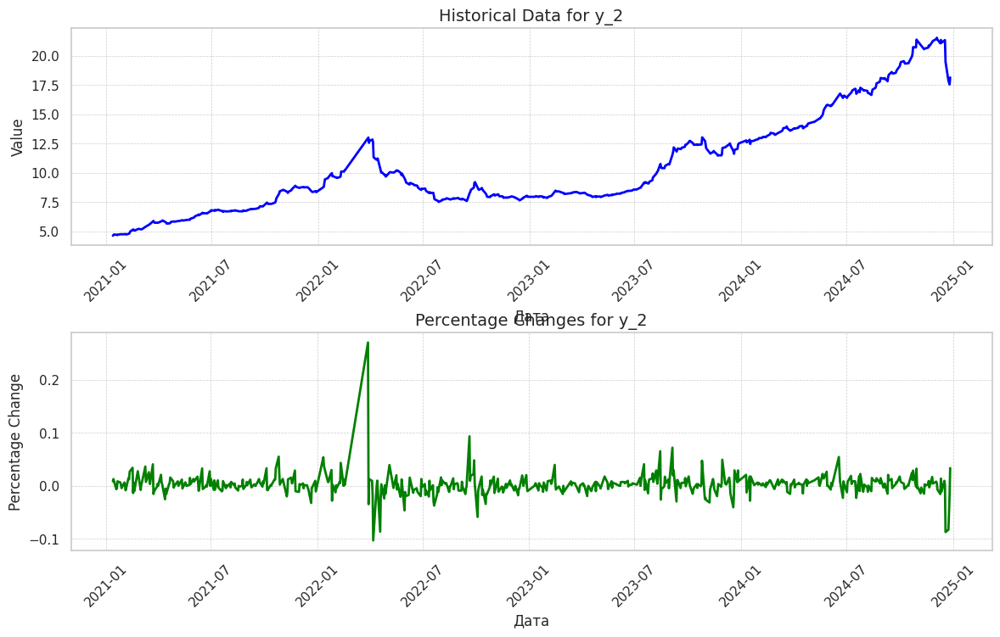

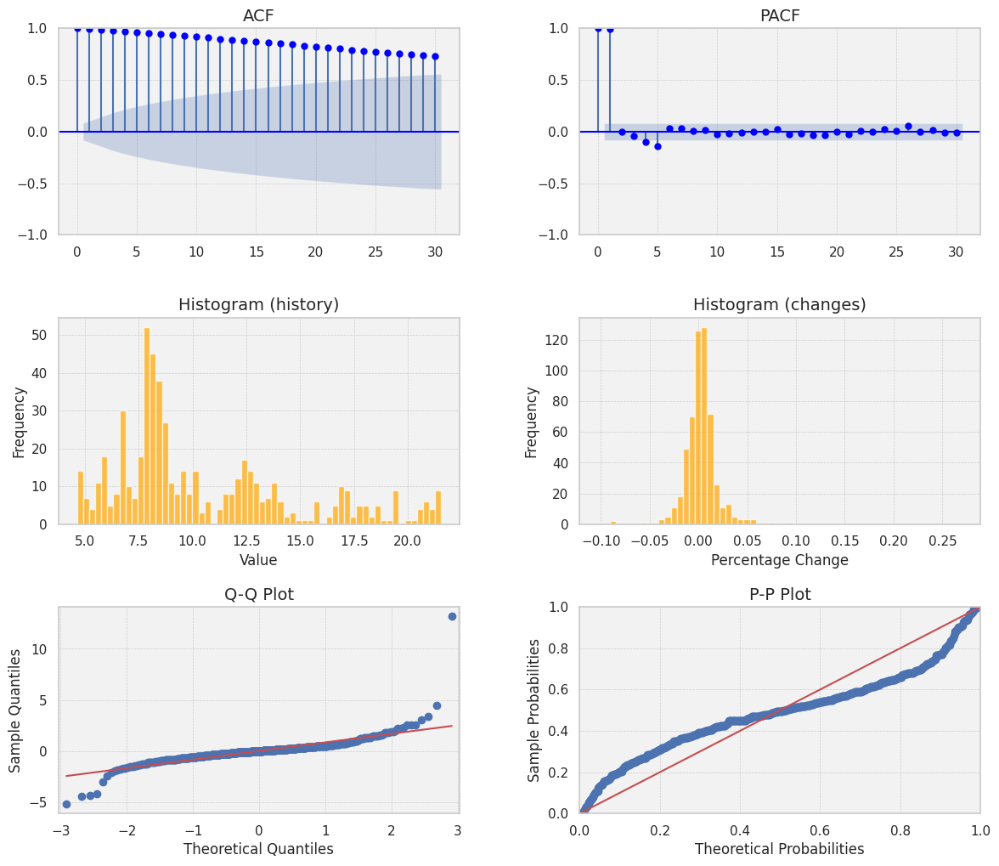

y_2
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.949)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.868)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.650)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.991)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


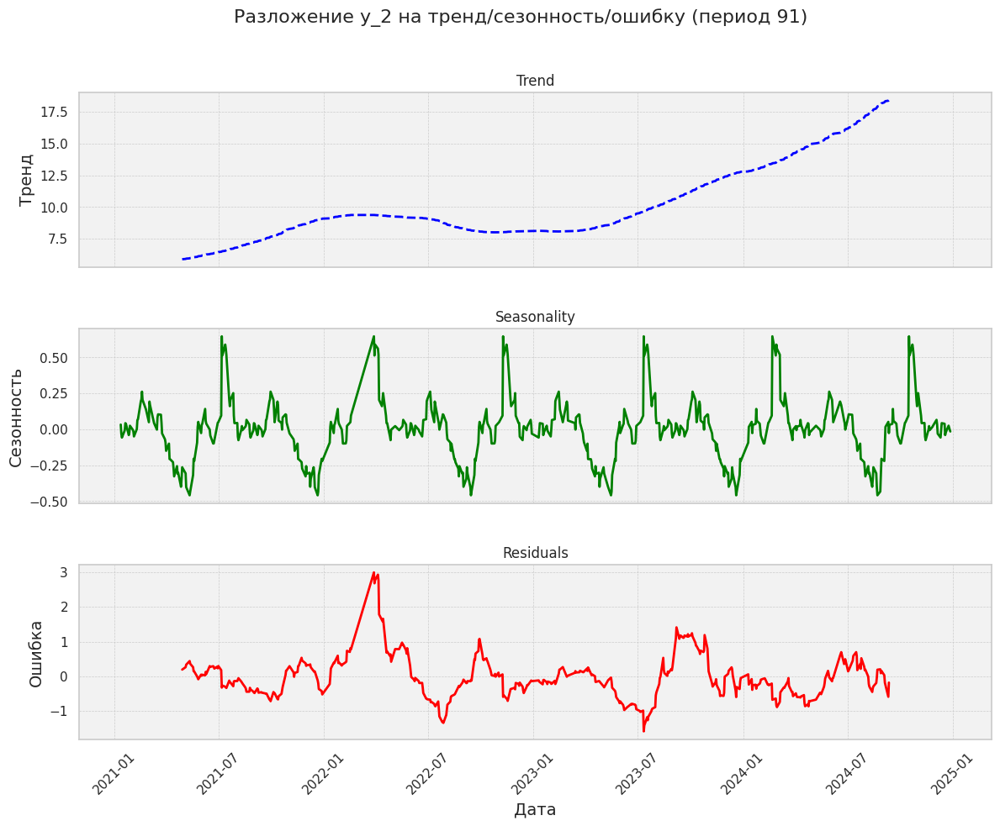

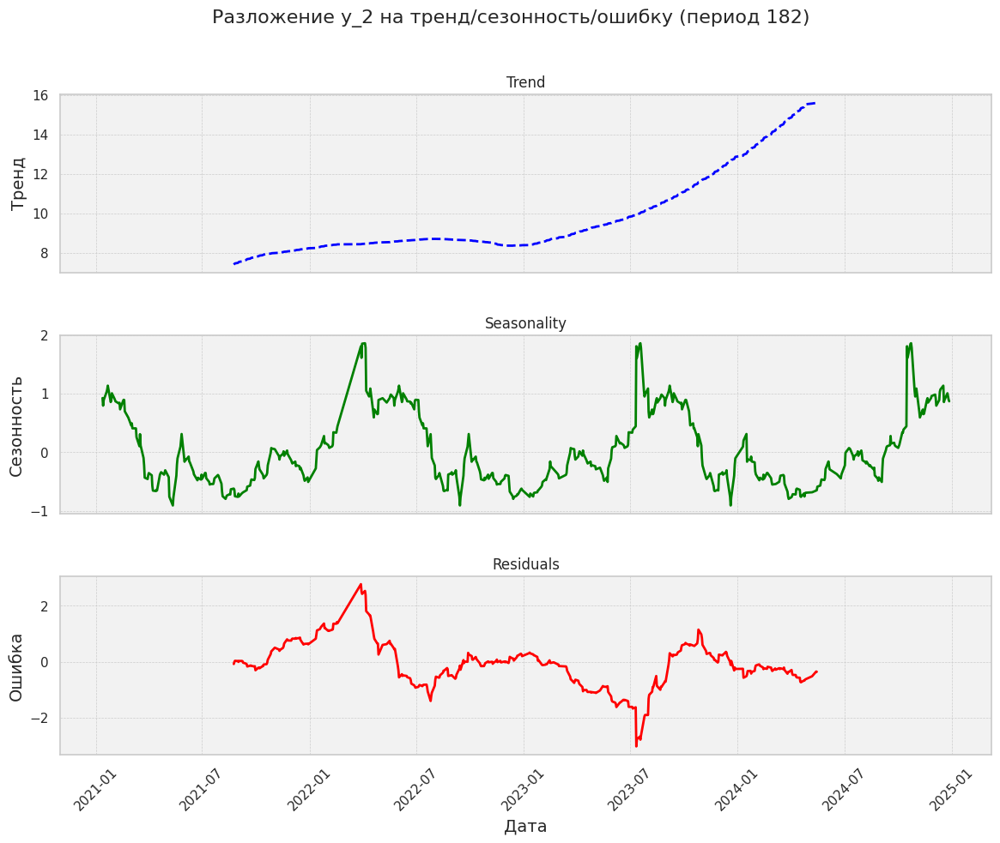

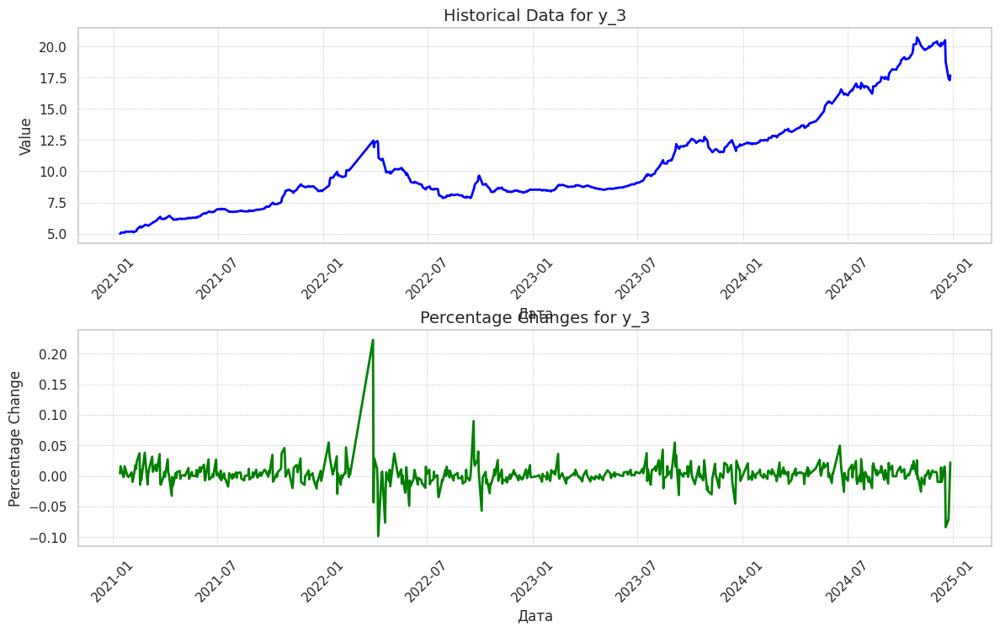

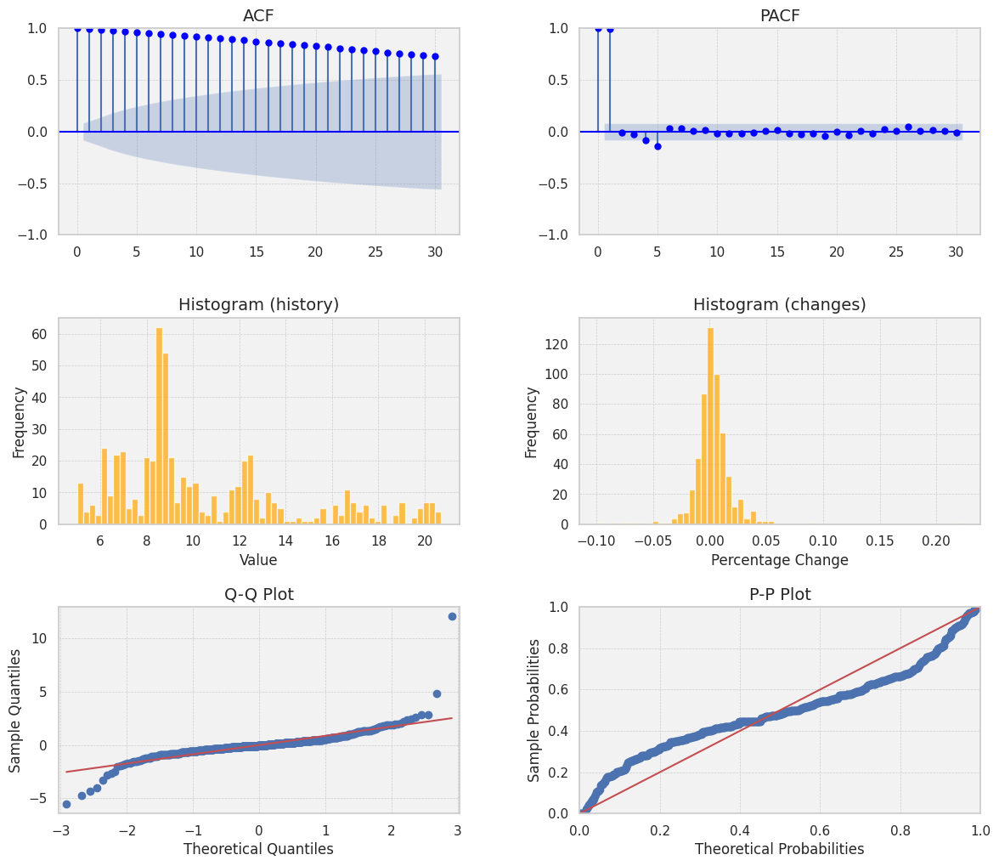

y_3
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.949)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.850)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.644)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.993)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


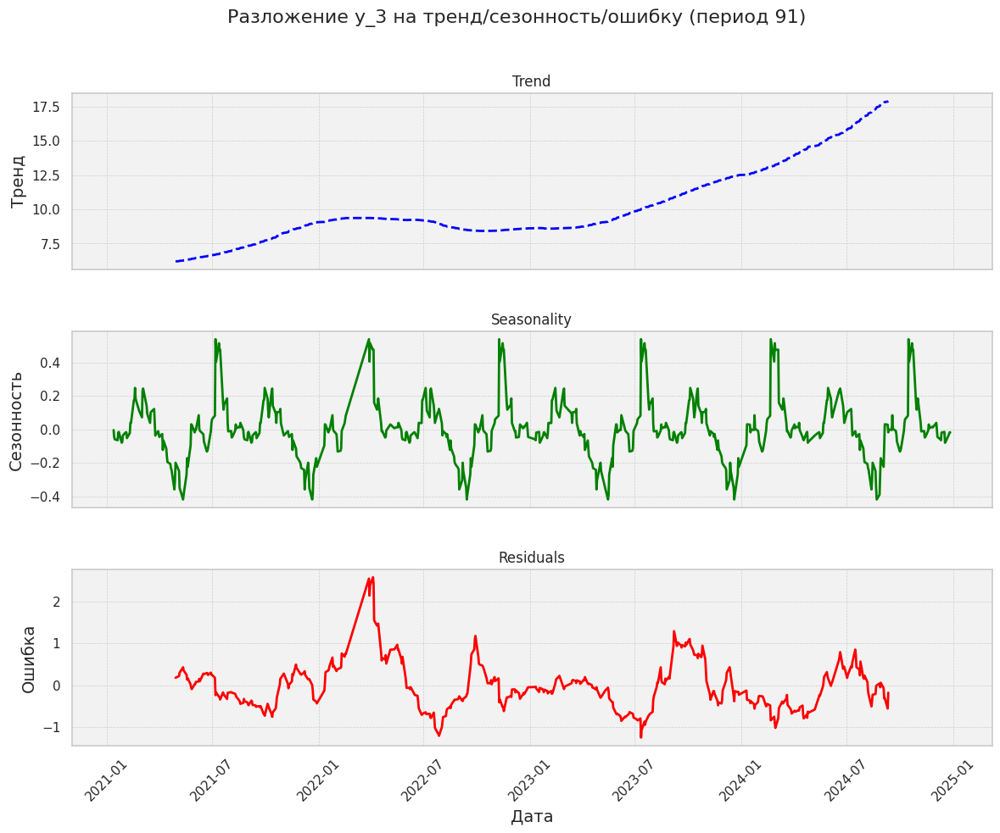

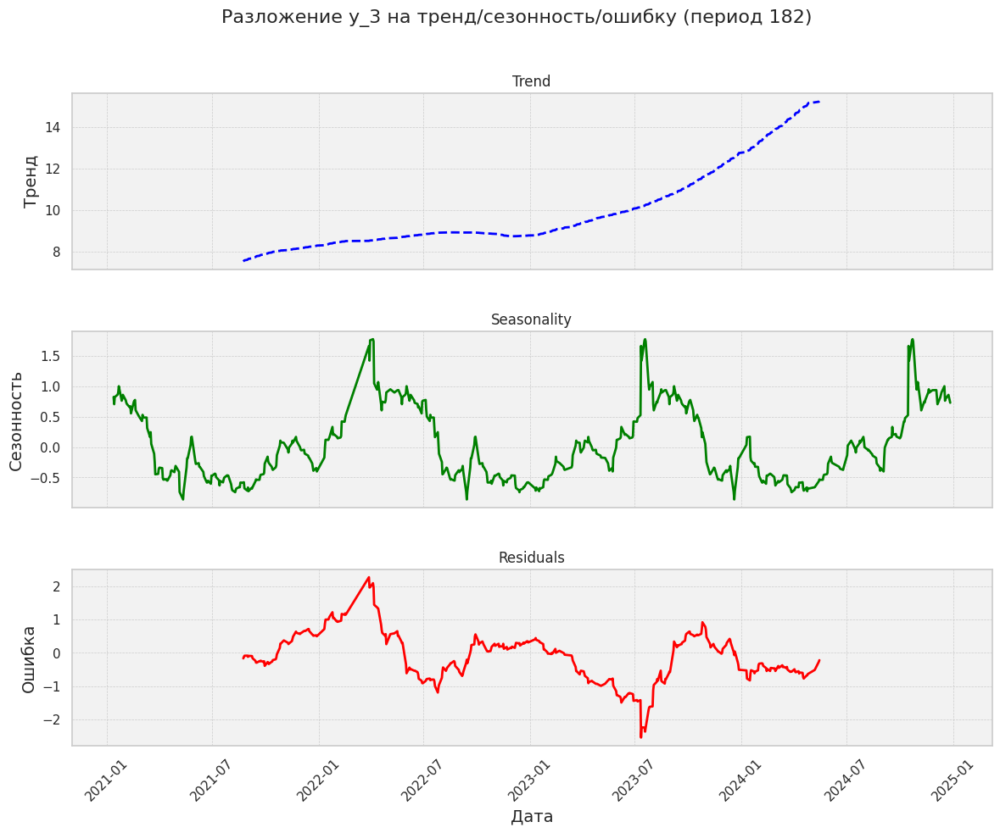

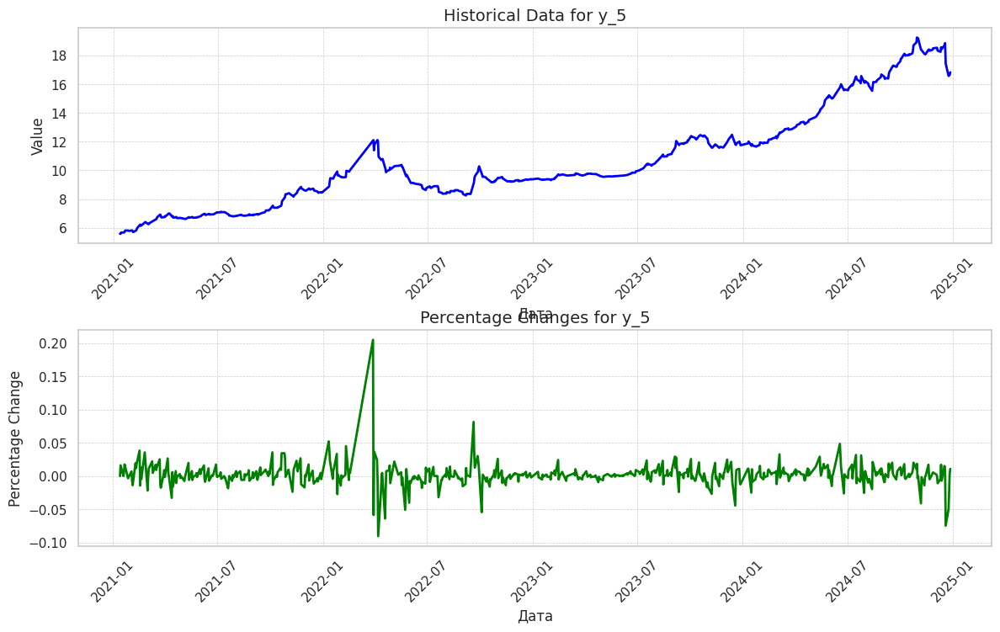

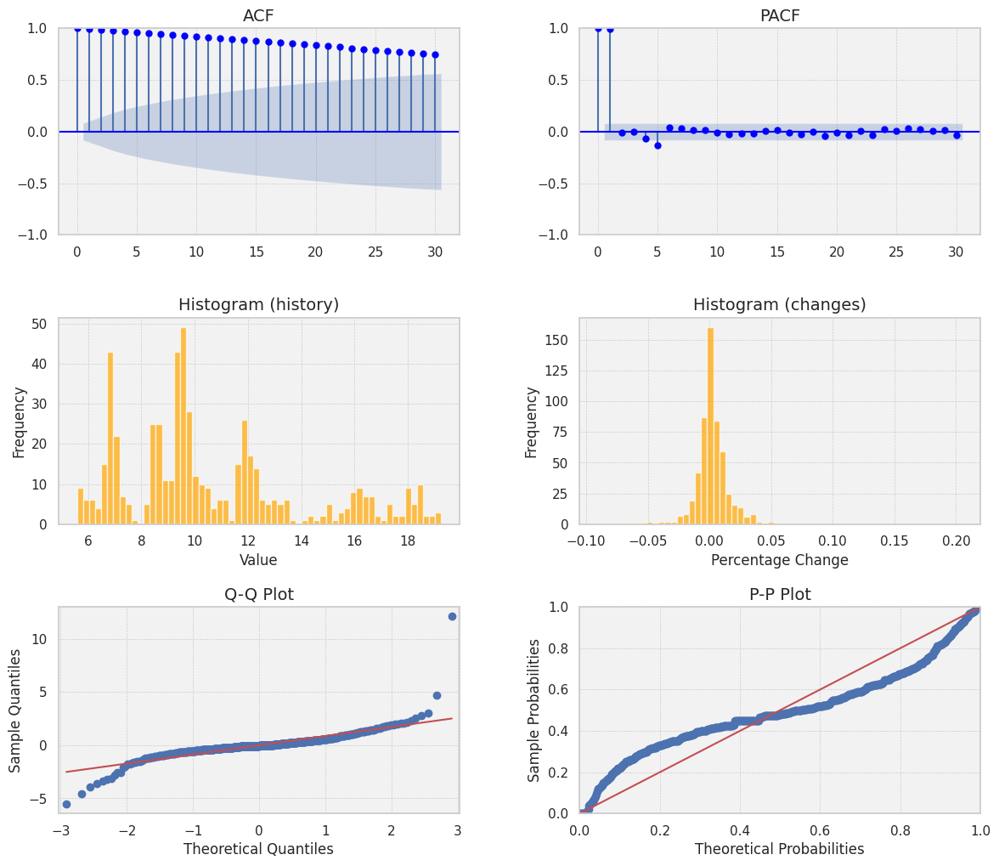

y_5
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.797)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.191)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.141)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.891)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


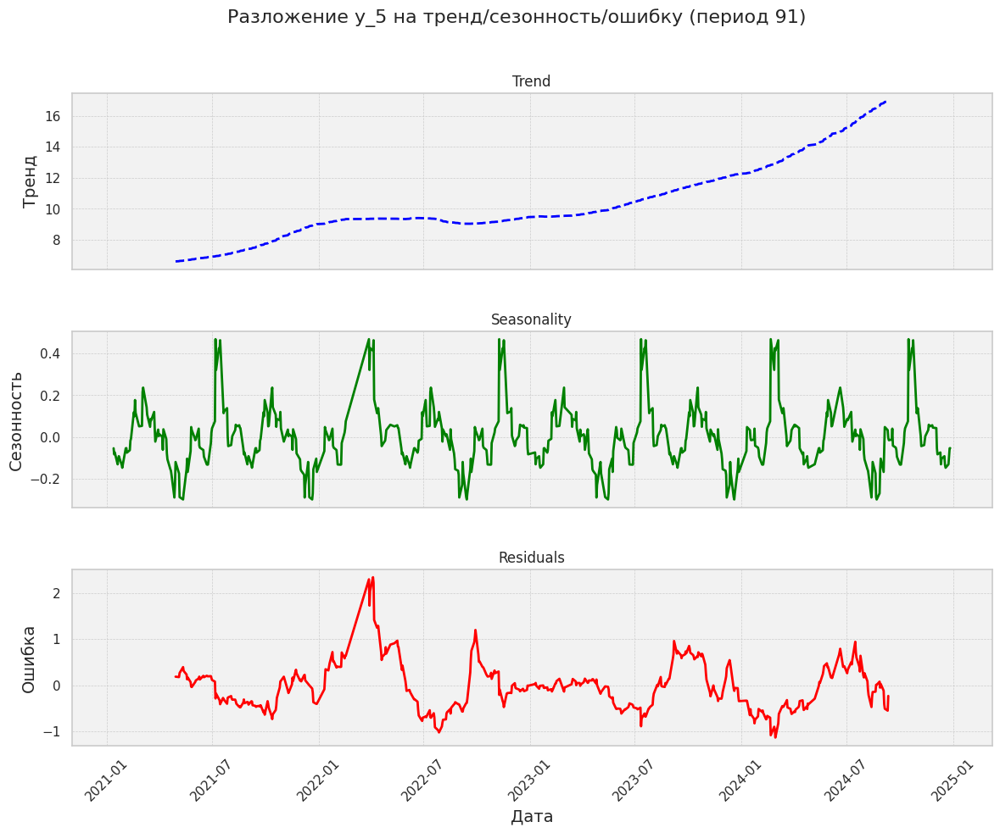

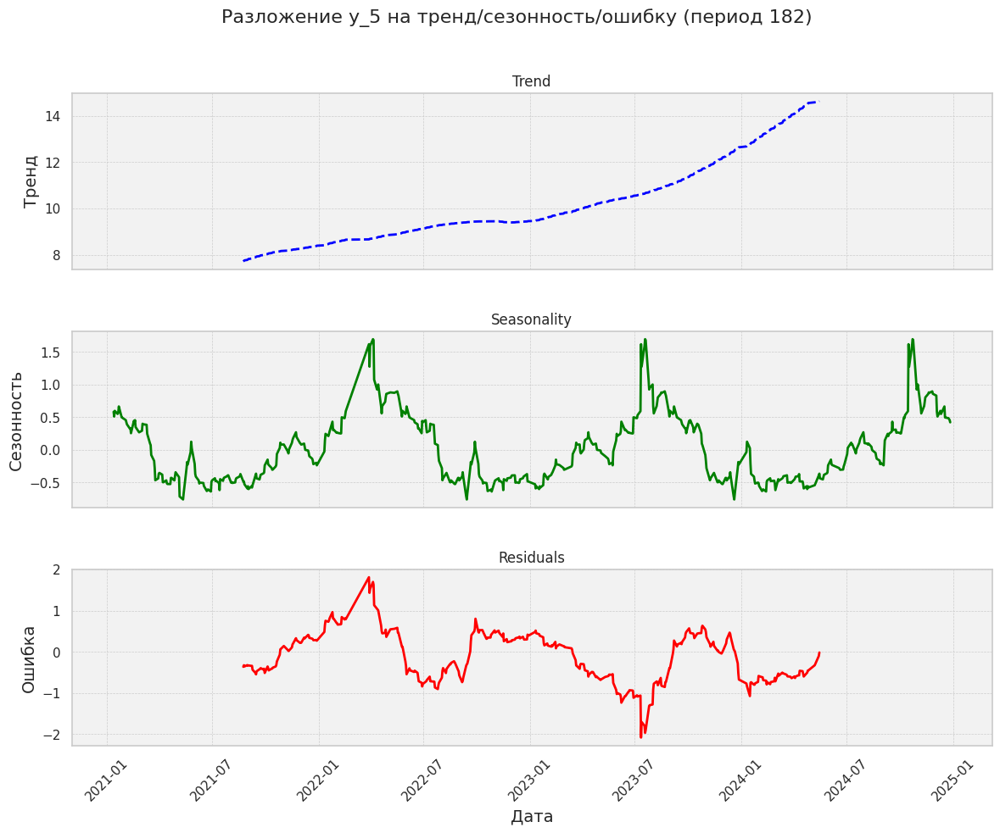

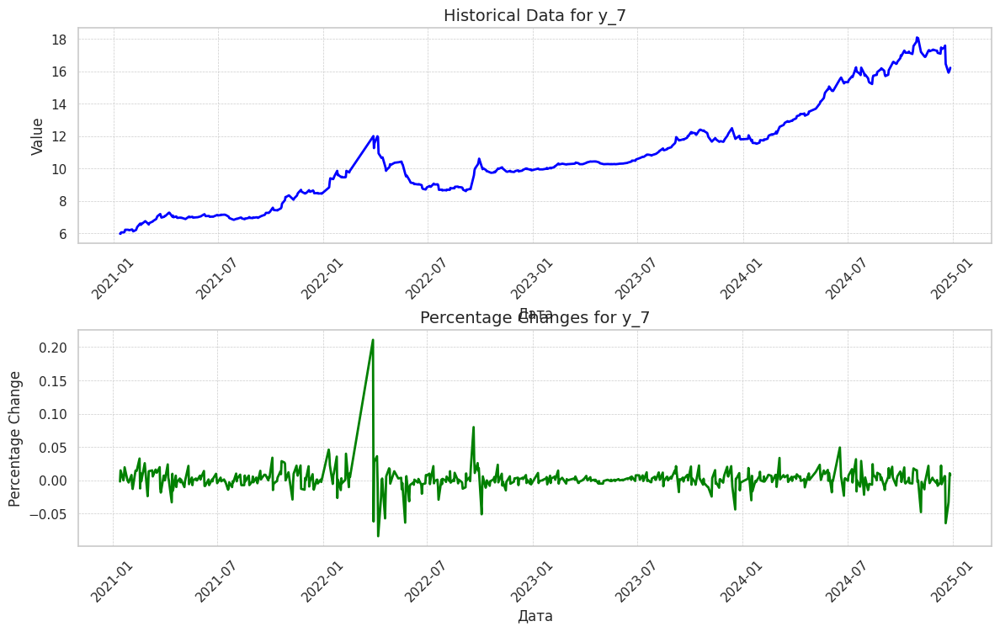

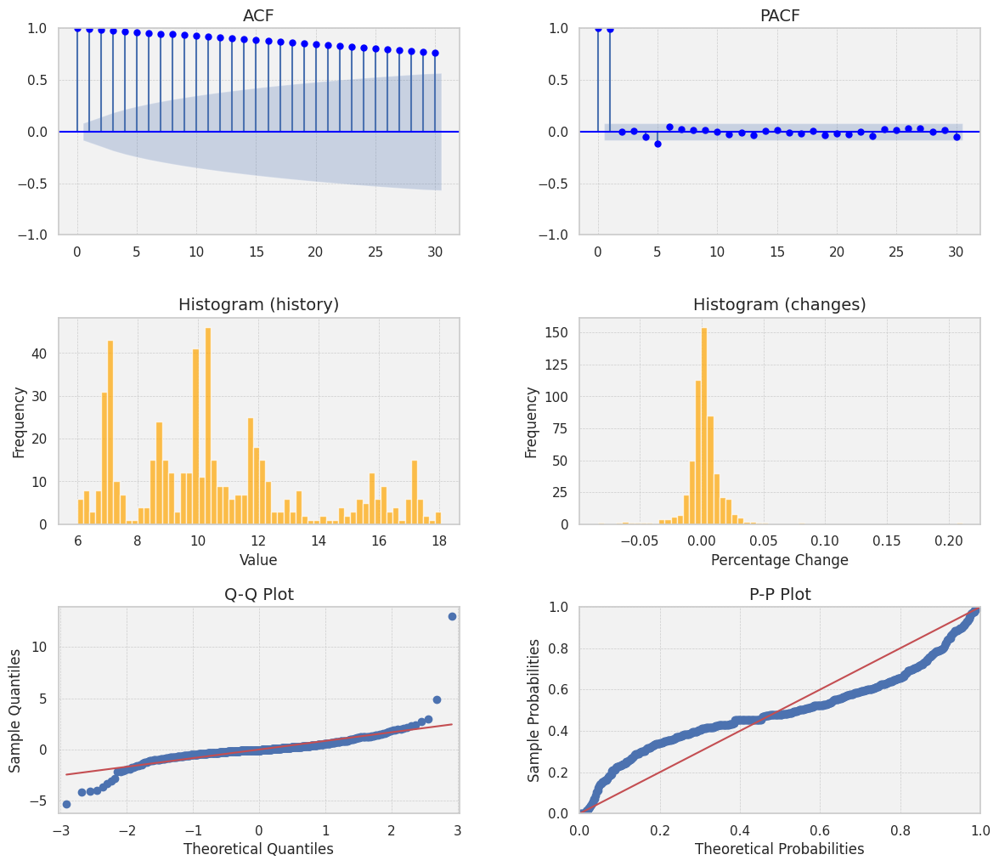

y_7
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.853)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.119)
Тест с константой, линейным и квадратичным трендом: H0 отвергается, ряд стационарен (p-value 0.086)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.931)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.001)


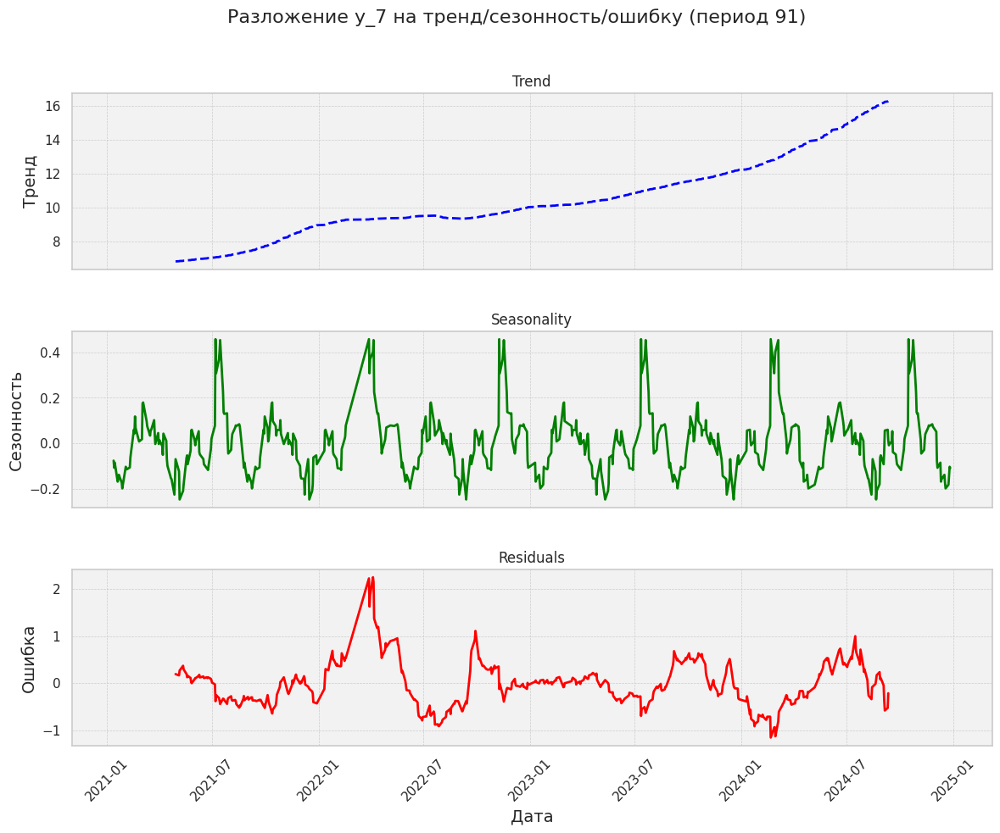

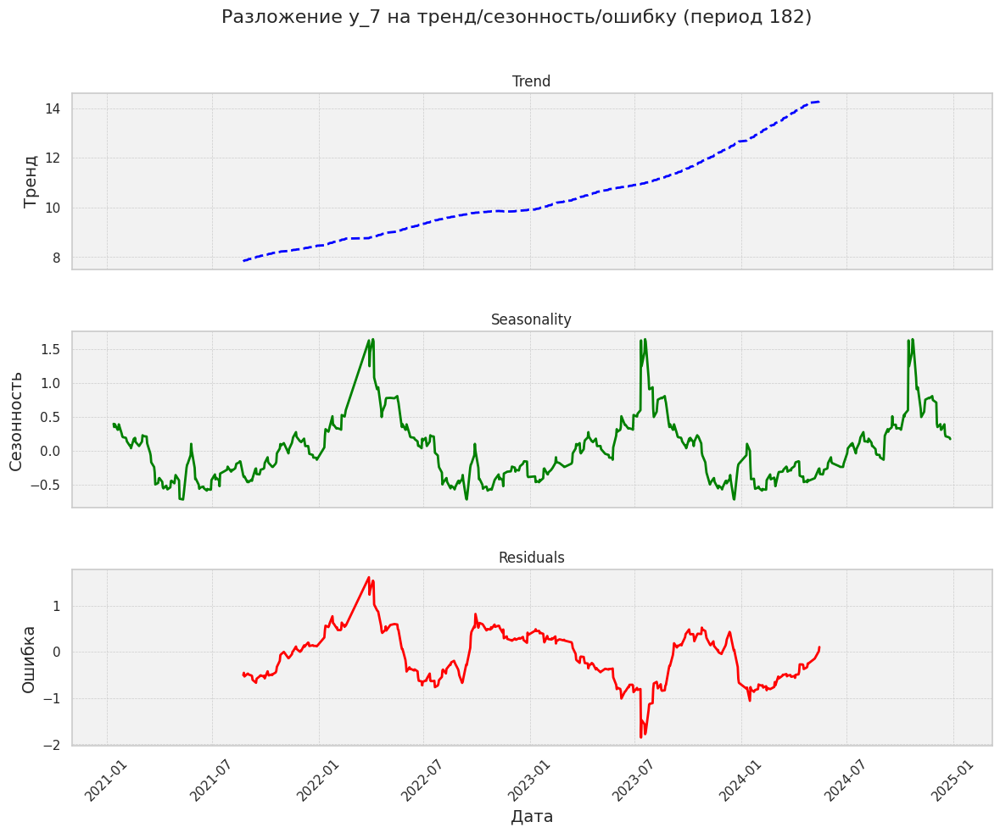

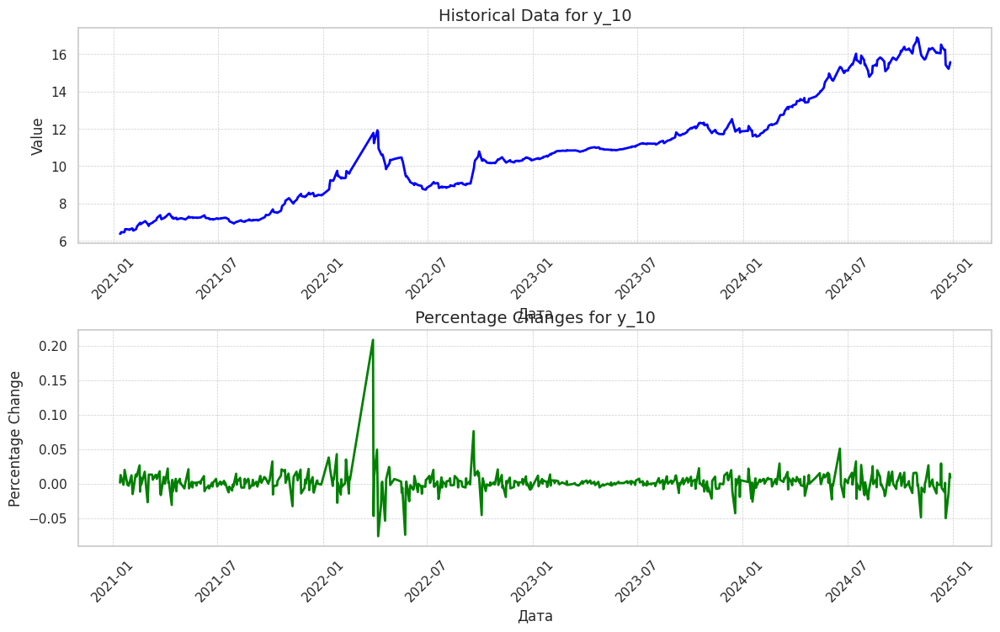

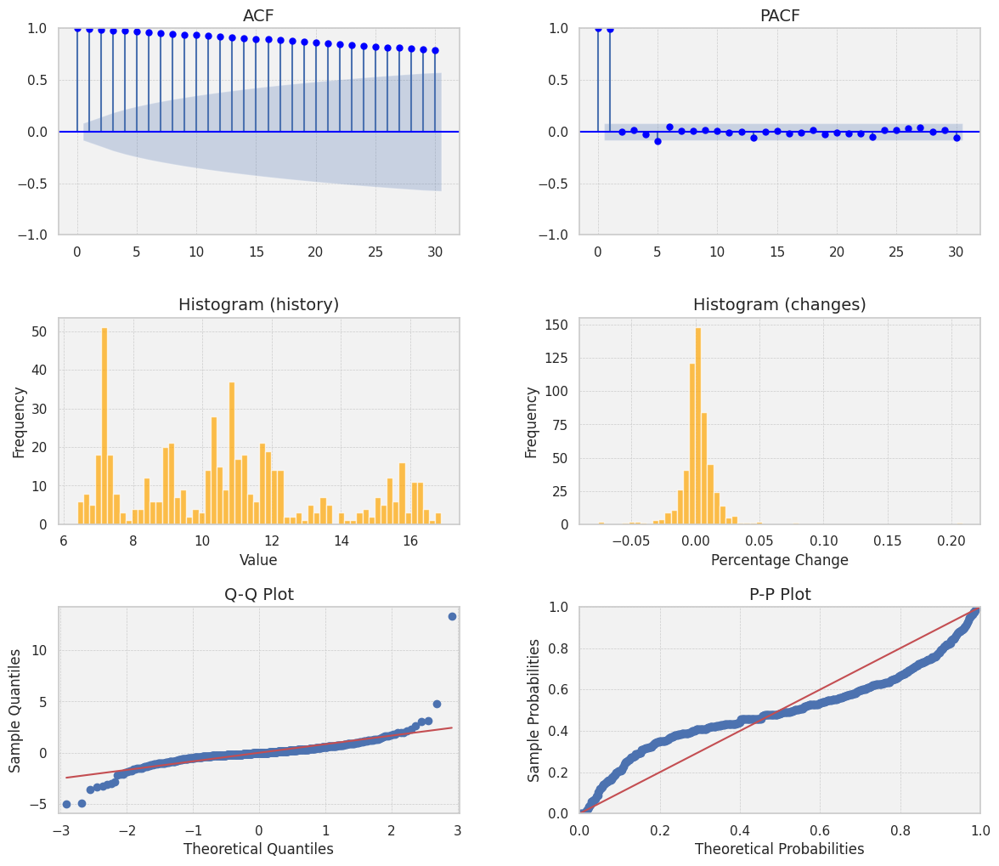

y_10
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.933)
Тест с константой и линейным трендом: H0 отвергается, ряд стационарен (p-value 0.059)
Тест с константой, линейным и квадратичным трендом: H0 отвергается, ряд стационарен (p-value 0.066)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.998)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


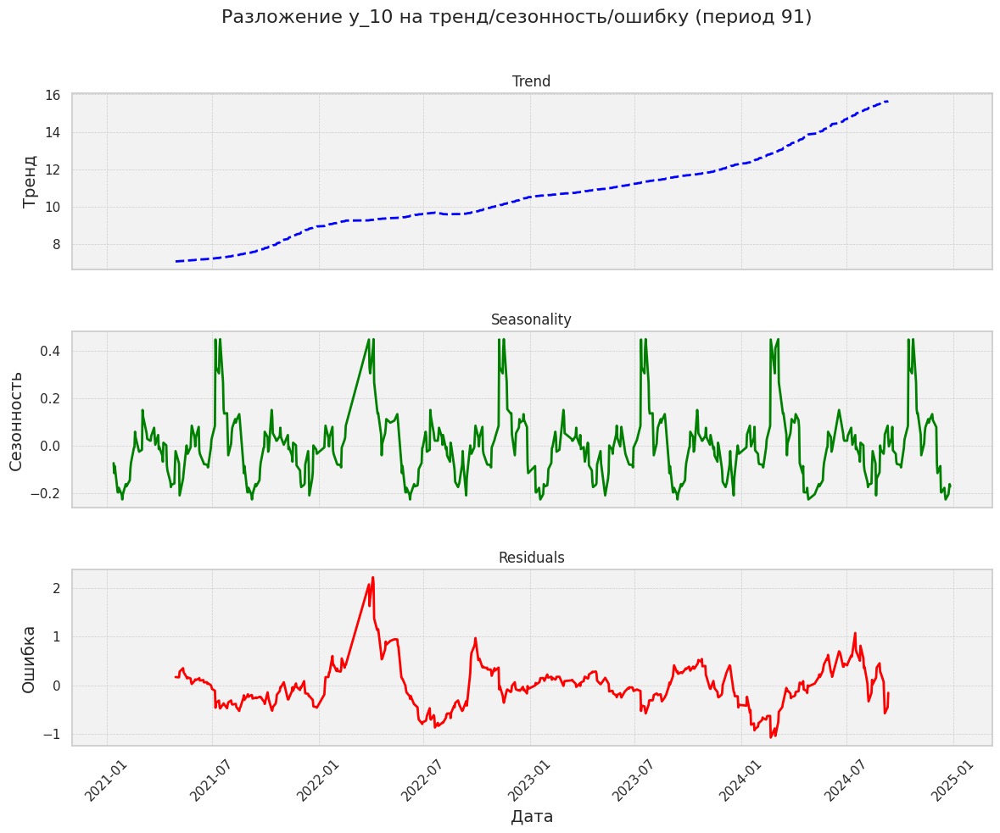

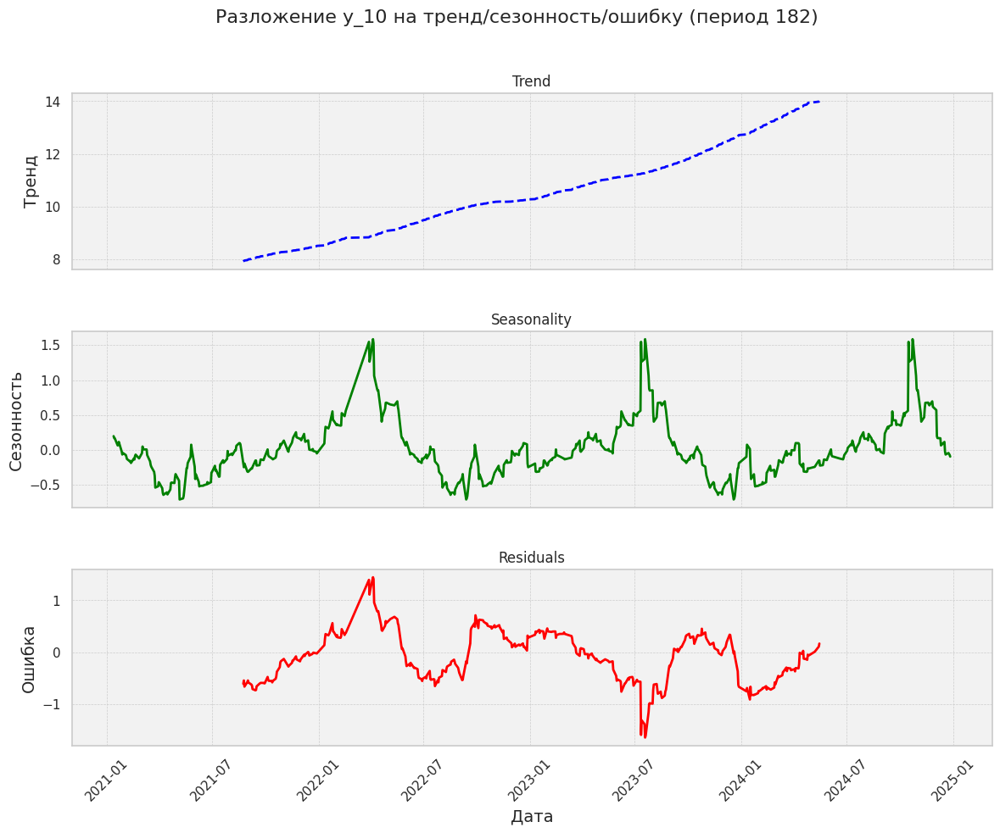

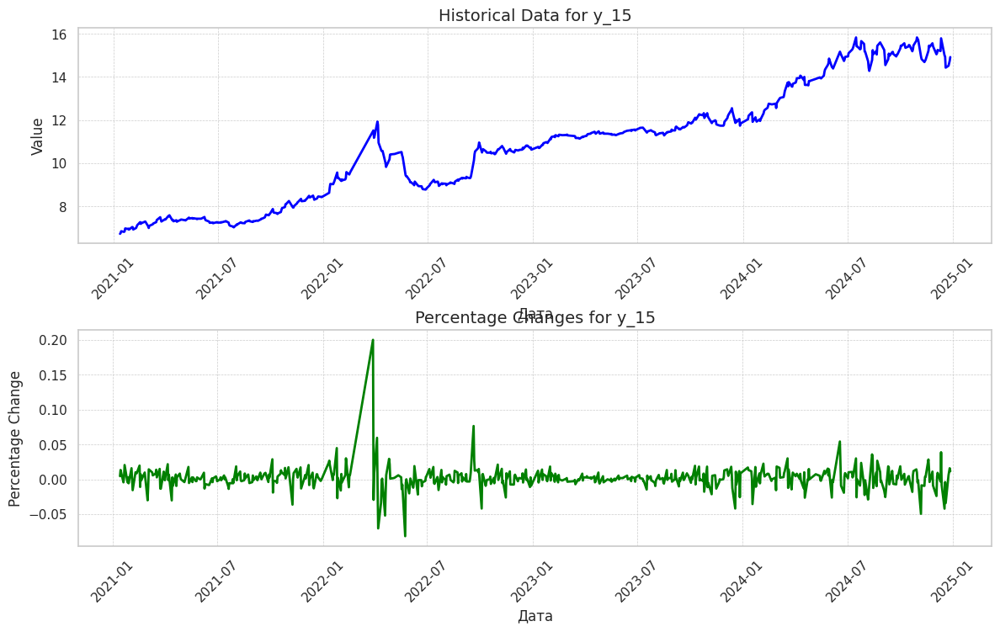

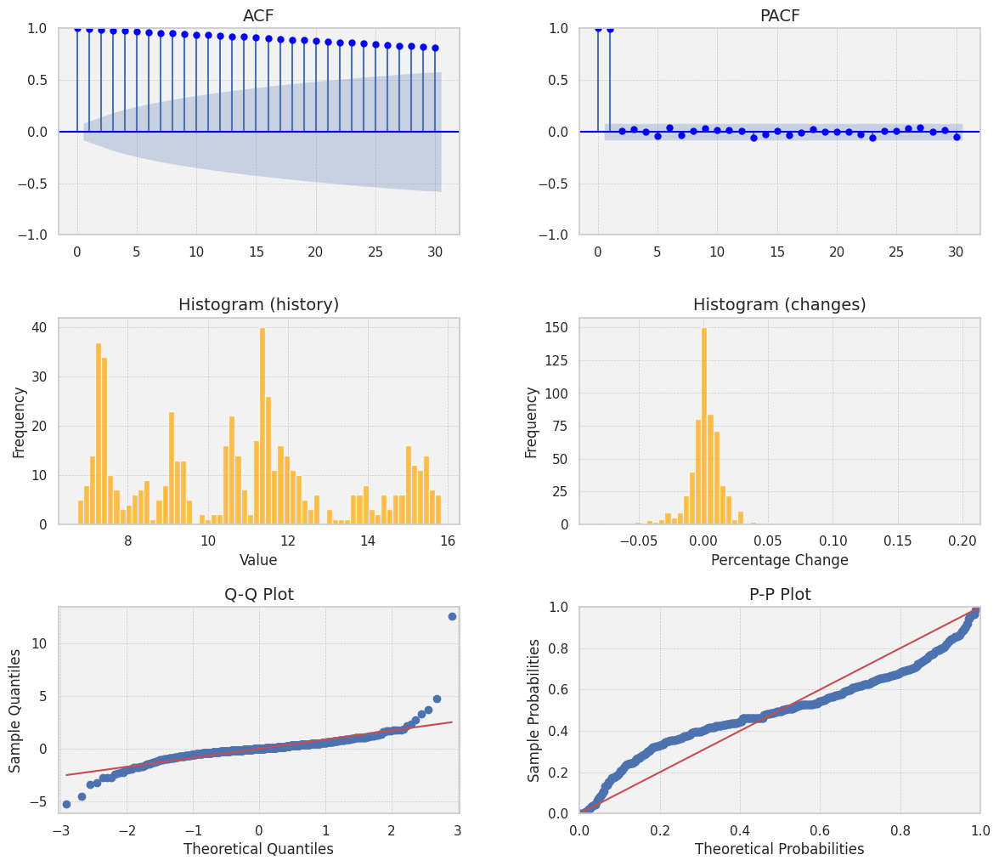

y_15
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.885)
Тест с константой и линейным трендом: H0 отвергается, ряд стационарен (p-value 0.048)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.115)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.994)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


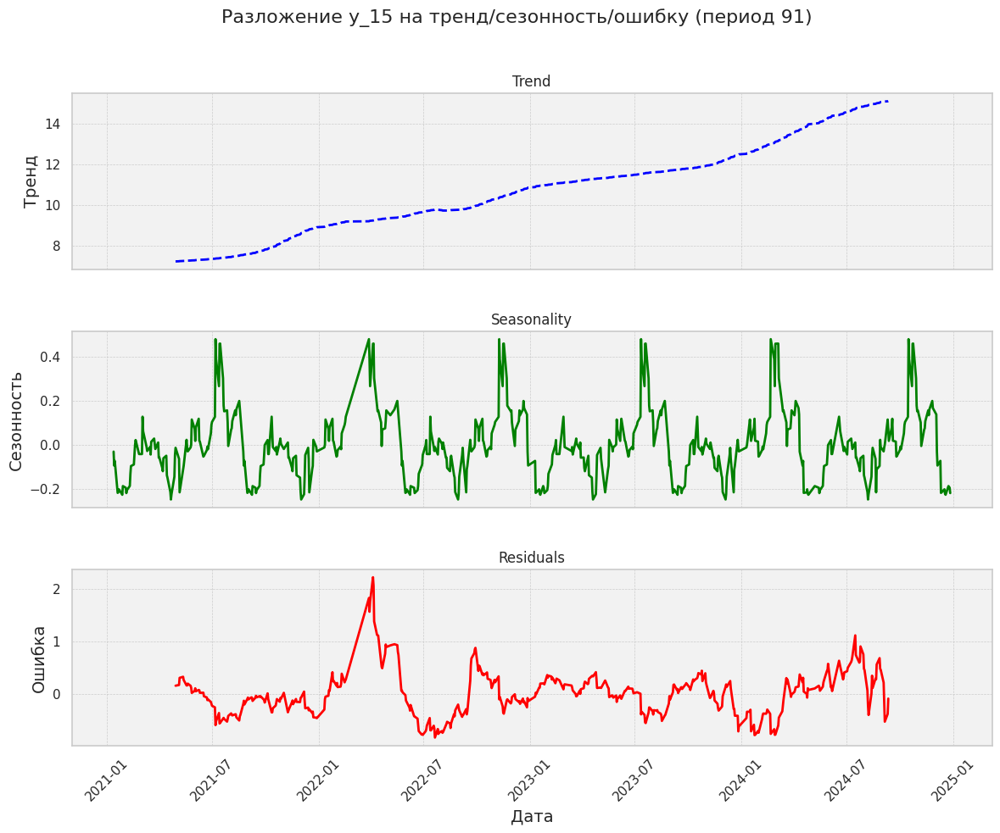

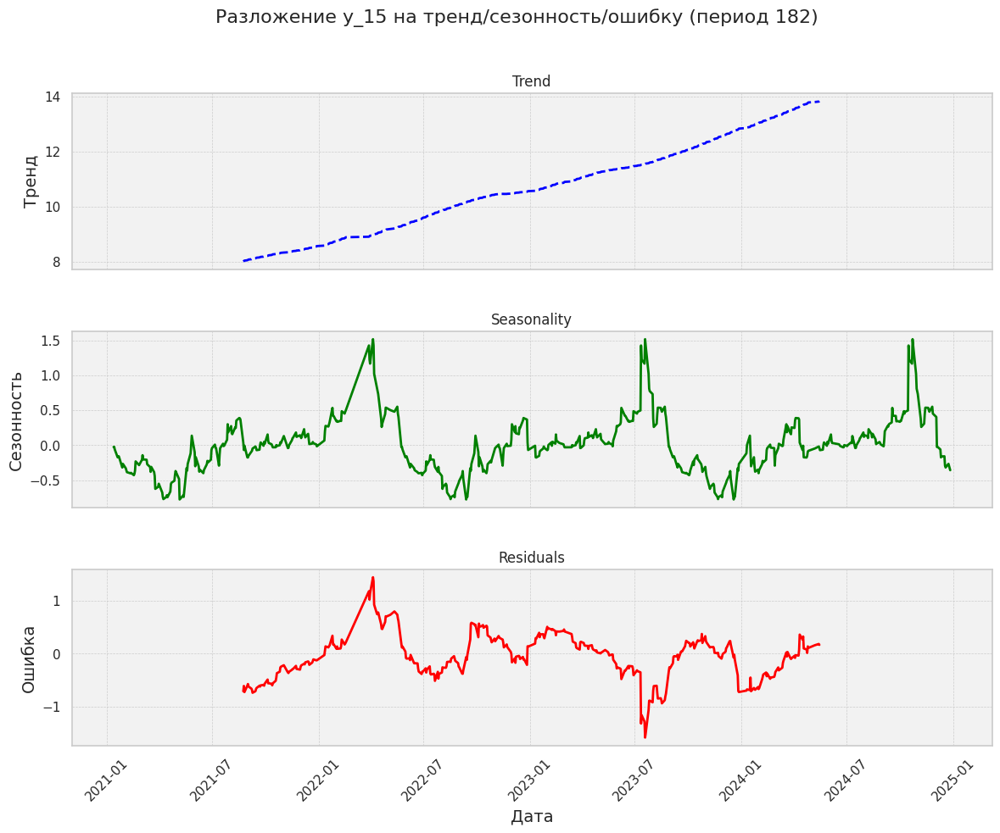

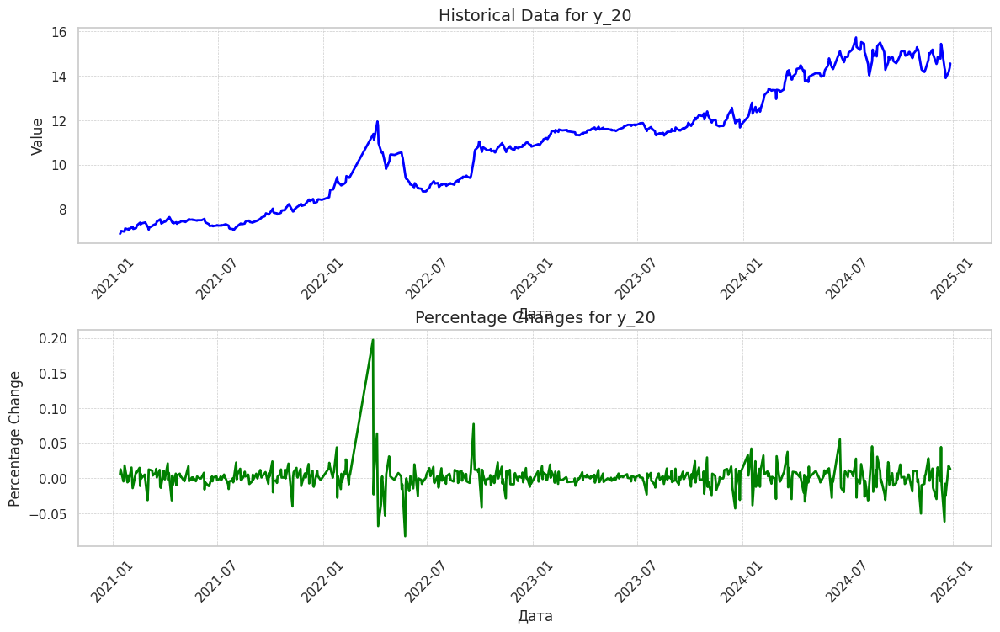

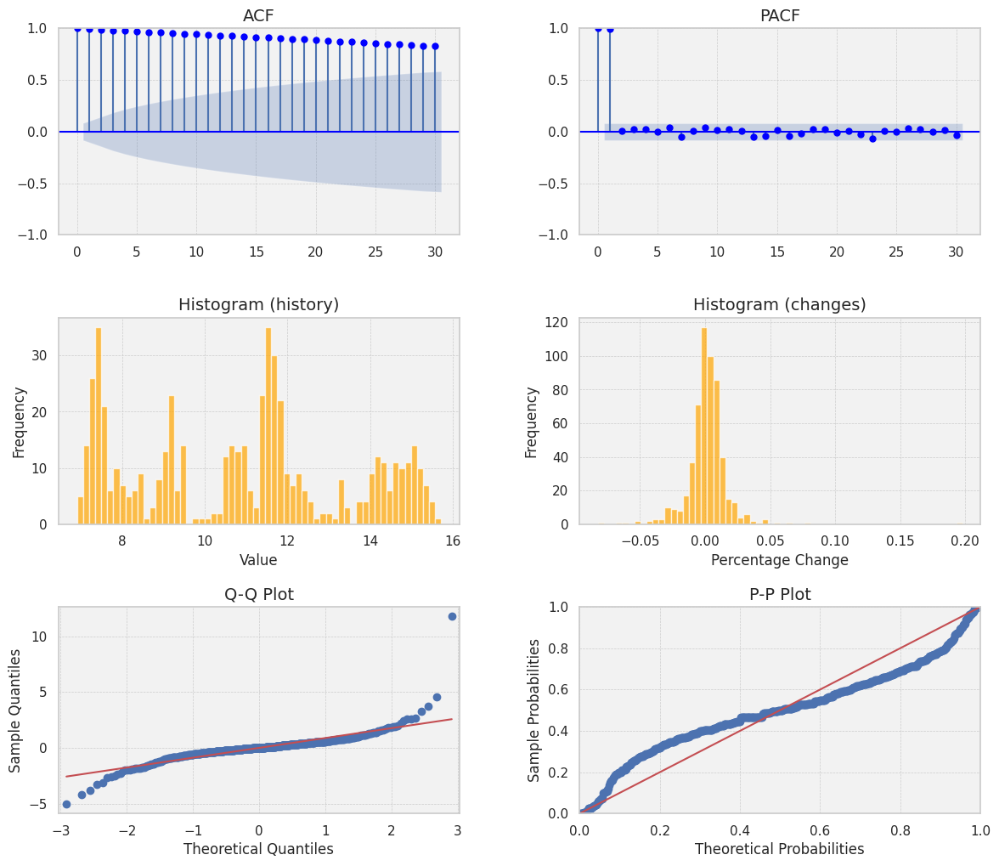

y_20
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.766)
Тест с константой и линейным трендом: H0 отвергается, ряд стационарен (p-value 0.016)
Тест с константой, линейным и квадратичным трендом: H0 отвергается, ряд стационарен (p-value 0.057)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.962)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


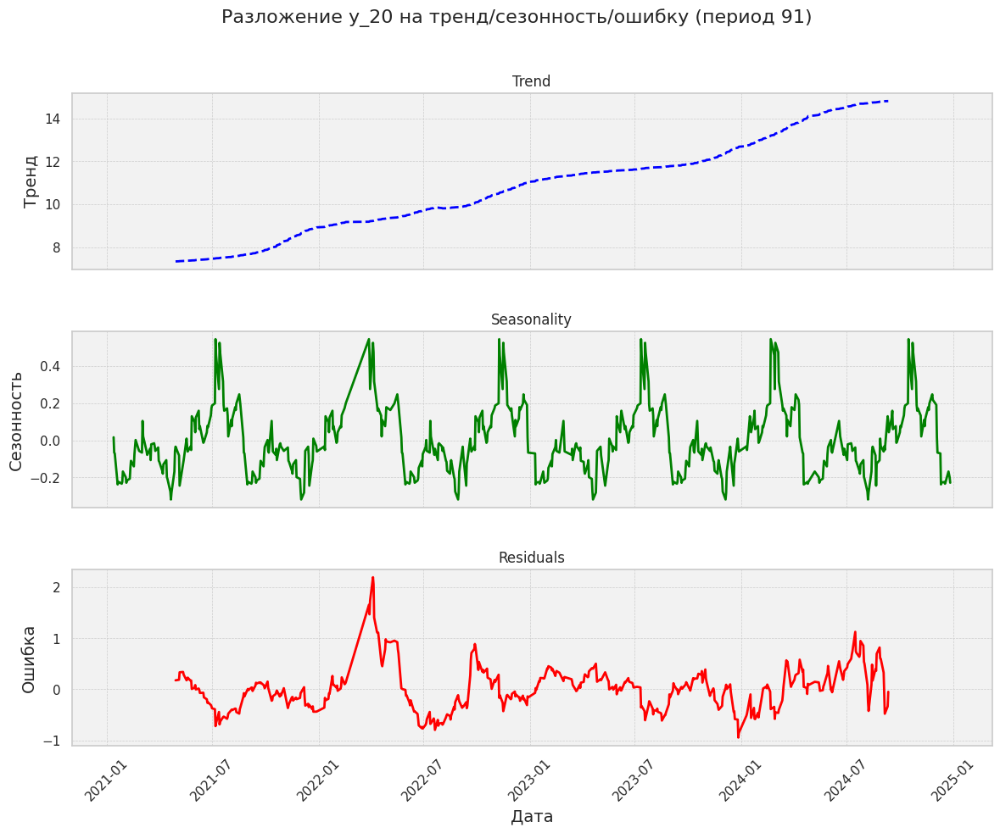

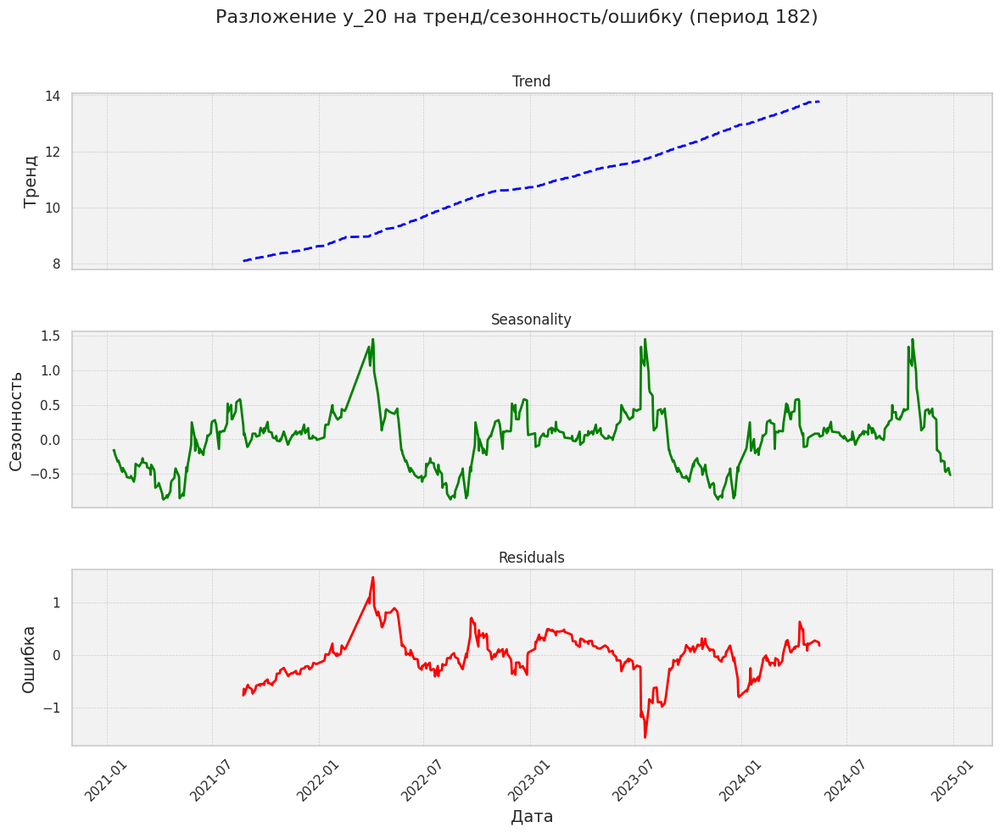

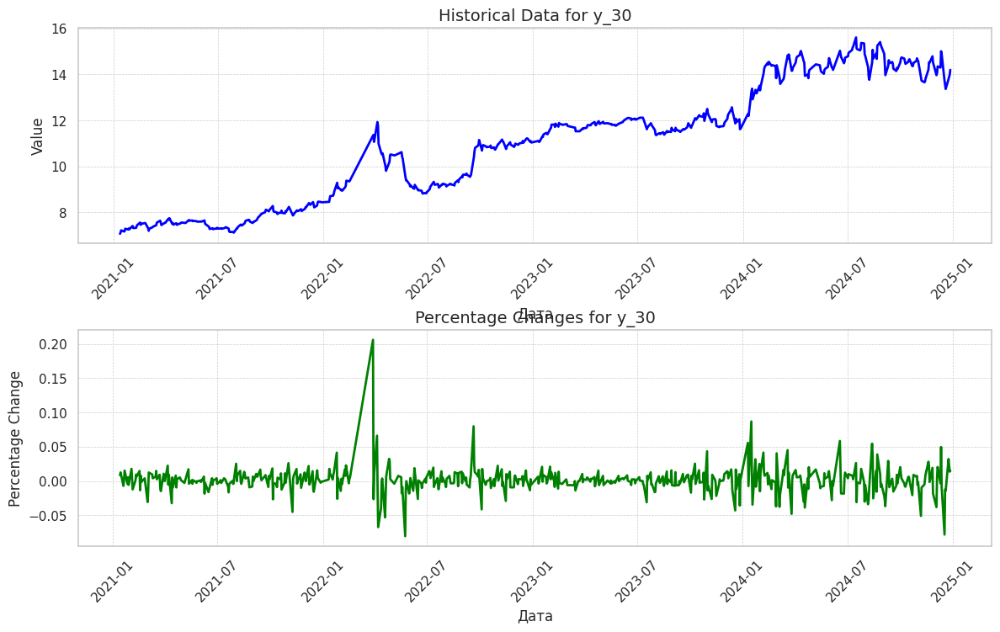

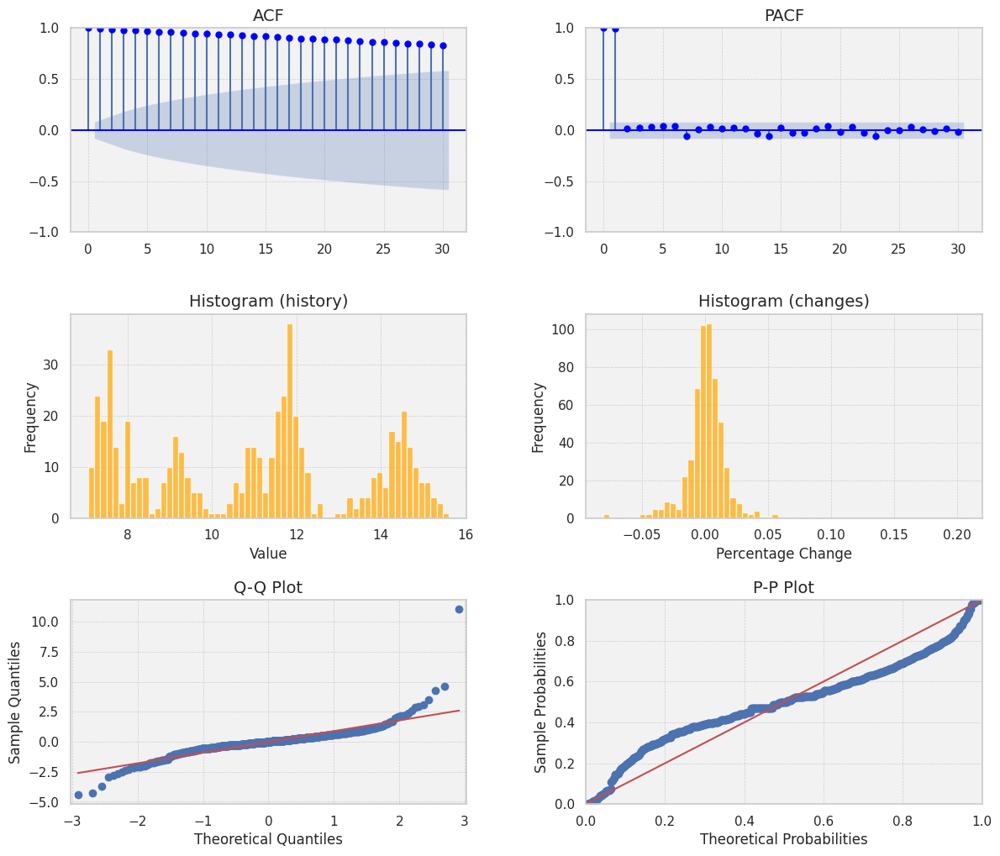

y_30
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.756)
Тест с константой и линейным трендом: H0 отвергается, ряд стационарен (p-value 0.013)
Тест с константой, линейным и квадратичным трендом: H0 отвергается, ряд стационарен (p-value 0.045)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.961)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


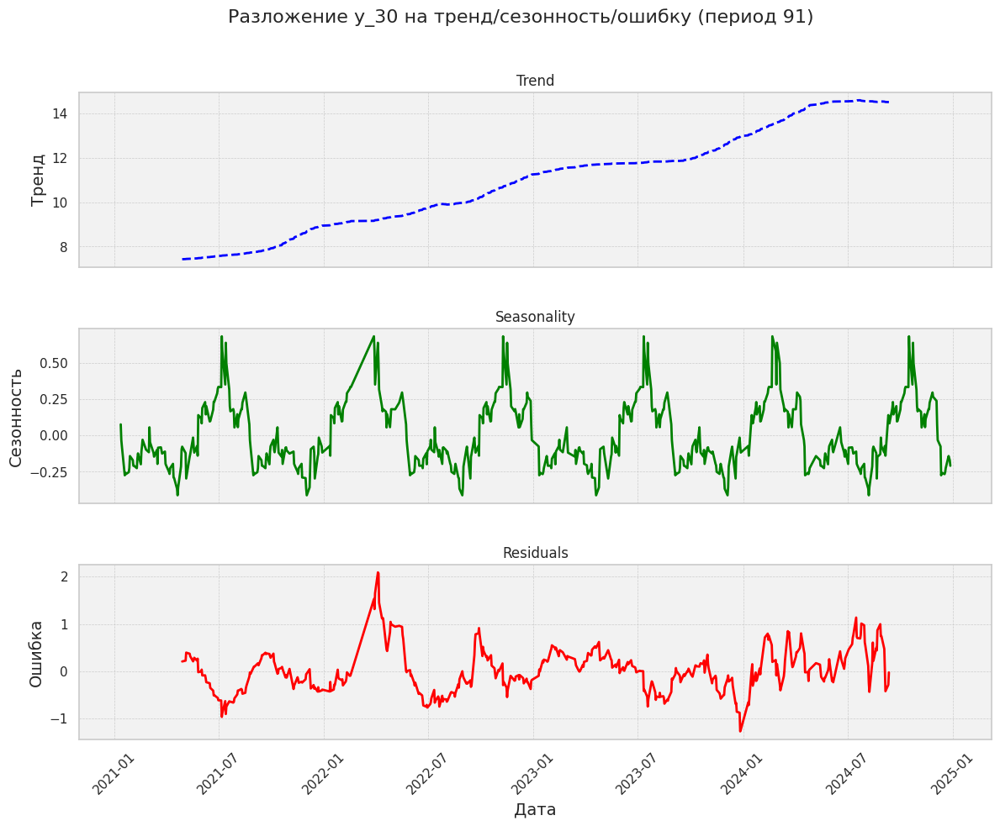

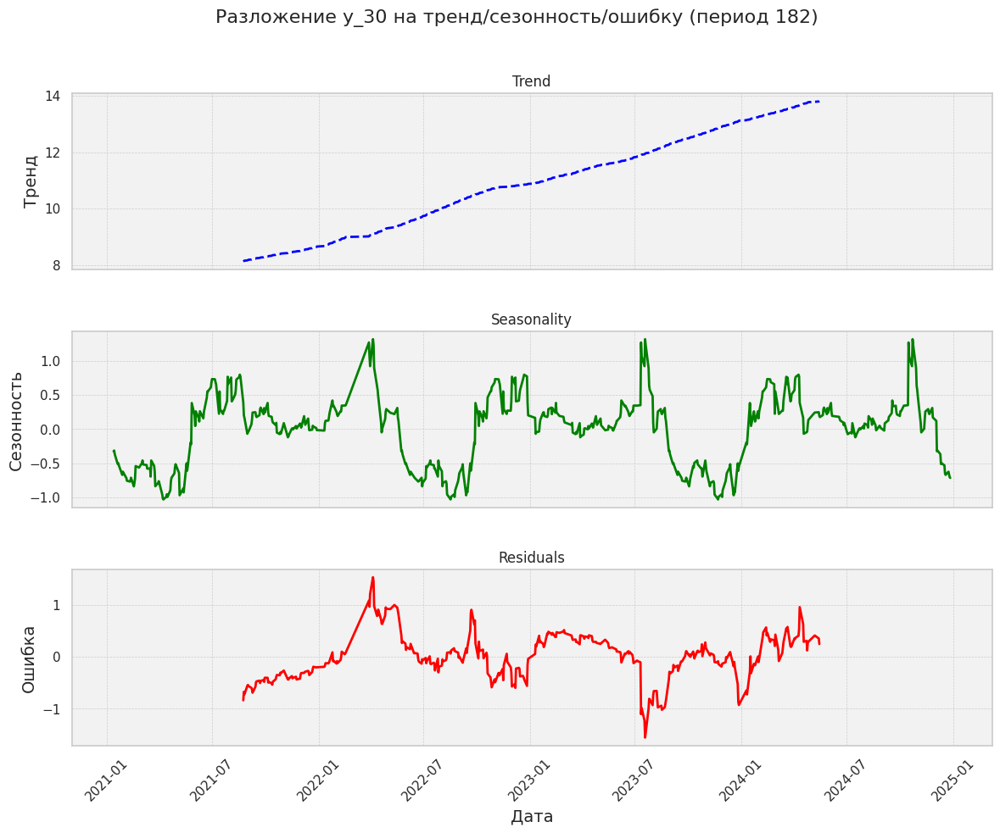

In [51]:
for column in df_risk2.columns: # детальный разбор временных рядов
    if column != 'date':
        get_description(df_risk2, column)

## 2.a Обязательно использовать анализ главных компонент или факторный анализ для уменьшения количества факторов

### PCA анализ

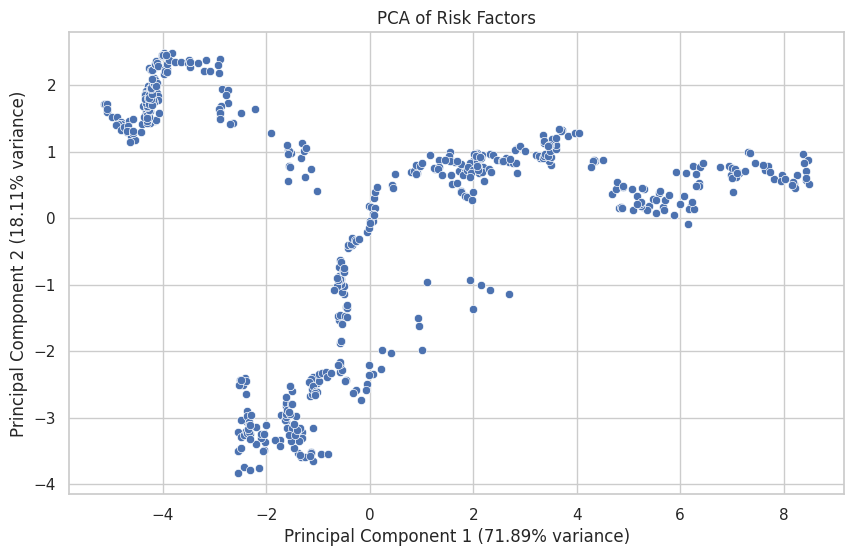

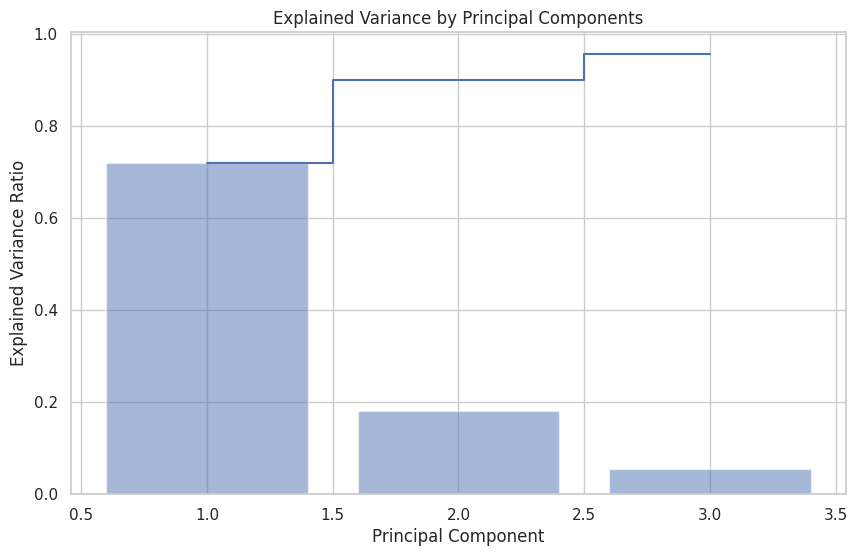

In [52]:
columns_to_use = [
    'MOEXBC', 'RTSI', 'BRENT', 'MOEX', 'USD', 'EUR',
    'y_0_25', 'y_0_5', 'y_0_75', 'y_1', 'y_2',
    'y_3', 'y_5', 'y_7', 'y_10', 'y_15', 'y_20', 'y_30'
]

plot_pca(df_risk3, columns_to_use)

# БОНУС ОПЦИОН - не разобрано !!!!!

### Условие задания

Дополнительный портфель 1:
- Состоит из двух выбранных опционов (1 Call и 1 Put) с различными ценами исполнения.
- Оба опциона должны быть "в деньгах". Это означает, что для Call опциона текущая цена базового актива должна быть выше цены исполнения, а для Put опциона - наоборот, текущая цена базового актива должна быть ниже цены исполнения.
- Базовый актив у обоих опционов должен иметь стоимость 1 млн руб.

Дополнительный портфель 2:
- Состоит из двух гипотетических облигаций со встроенными опционами.
- Одна облигация имеет опцион Put, встроенный 1 января 2024 г. со страйком 100%.
- Другая облигация имеет опцион Call, встроенный 1 января 2024 г. со страйком 100%.
- Эти облигации эквивалентны одной из выбранных государственных облигаций.

### Что мы хотим сделать
1. Выбрать модели оценки справедливой стоимости для каждого портфеля.
2. Используя реальные данные, оценить параметры модели.
3. Вычислить и сравнить расчетные цены активов в портфелях на одну выбранную дату.

### Шаг 1: Получение данных для выбранных опционов (Портфель 1)


### Выполнение задачи для Портфеля 1

1. Выбор моделей оценки справедливой стоимости:

Так как опционы в дополнительном портфеле 1 — опционы на фьючерсы на базовый актив, модель Black-Scholes для фьючерсов является подходящей.

2. Оценка параметров модели:

Необходимо использовать реальные данные для оценки параметров:
- Цена исполнения (K)
- Текущая цена фьючерса (F)
- Время до истечения опциона (T)
- Безрисковая ставка (r)
- Волатильность (σ)

3. Расчёт и сравнение цен.

In [33]:
options_api_url = "https://iss.moex.com/iss/engines/futures/markets/options/securities.json"
response = requests.get(options_api_url)
options_data = response.json()

# Преобразование данных в DataFrame
options_df = pd.DataFrame(
    options_data['securities']['data'], 
    columns=options_data['securities']['columns']
)

options_df.head()

,SECID,BOARDID,SHORTNAME,SECNAME,PREVSETTLEPRICE,DECIMALS,MINSTEP,LASTTRADEDATE,LASTDELDATE,LATNAME,ASSETCODE,PREVOPENPOSITION,PREVPRICE,OPTIONTYPE,STEPPRICE,IMNP,IMP,IMBUY,IMTIME,BUYSELLFEE,SCALPERFEE,NEGOTIATEDFEE,EXERCISEFEE,STRIKE,CENTRALSTRIKE,UNDERLYINGASSET,UNDERLYINGTYPE,UNDERLYINGSETTLEPRICE
0,AF10000BC5,ROPD,AFLT-3.25M190325CA10000,Марж. амер. Call 10000 с исп. 19 марта на фьюч...,1.0,0,1.0,2025-03-19,2025-03-19,AFLT-3.25M190325CA10000,AFLT,0.0,0.0,C,1.0,1944.20,3315.97,1.00,2024-06-20 18:59:28,0.02,0.01,0.02,0.66,10000.0,7250.0,AFH5,F,7197.0
1,AF10000BI4,ROPD,AFLT-9.24M180924CA10000,Марж. амер. Call 10000 с исп. 18 сент. на фьюч...,1.0,0,1.0,2024-09-18,2024-09-18,AFLT-9.24M180924CA10000,AFLT,0.0,0.0,C,1.0,1872.99,3261.53,1.00,2024-06-20 18:59:08,0.02,0.01,0.02,0.66,10000.0,6750.0,AFU4,F,6656.0
2,AF10000BL4,ROPD,AFLT-12.24M181224CA10000,Марж. амер. Call 10000 с исп. 18 дек. на фьюч....,1.0,0,1.0,2024-12-18,2024-12-18,AFLT-12.24M181224CA10000,AFLT,0.0,0.0,C,1.0,1904.73,3308.71,1.00,2024-06-20 18:59:14,0.02,0.01,0.02,0.66,10000.0,6750.0,AFZ4,F,6860.0
3,AF10000BO5,ROPD,AFLT-3.25M190325PA10000,Марж. амер. Put 10000 с исп. 19 марта на фьюч....,2900.0,0,1.0,2025-03-19,2025-03-19,AFLT-3.25M190325PA10000,AFLT,0.0,0.0,P,1.0,3316.97,1944.36,2882.48,2024-06-20 18:59:28,0.56,0.28,0.19,0.66,10000.0,7250.0,AFH5,F,7197.0
4,AF10000BU4,ROPD,AFLT-9.24M180924PA10000,Марж. амер. Put 10000 с исп. 18 сент. на фьюч....,3351.0,0,1.0,2024-09-18,2024-09-18,AFLT-9.24M180924PA10000,AFLT,0.0,0.0,P,1.0,3262.53,1873.15,3249.46,2024-06-20 18:59:08,0.52,0.26,0.18,0.66,10000.0,6750.0,AFU4,F,6656.0


In [34]:
# Фильтрация Call и Put опционов
call_options = options_df[options_df['OPTIONTYPE'] == 'C']
put_options = options_df[options_df['OPTIONTYPE'] == 'P']

# Рассчитываем приблизительную рыночную цену базового актива
# Используя среднее значение страйк-цены и цену закрытия (PREVSETTLEPRICE)
call_mean_price = call_options['PREVSETTLEPRICE'].mean()
put_mean_price = put_options['PREVSETTLEPRICE'].mean()

# Примерная оценка рыночной цены базового актива
F = (call_mean_price + put_mean_price) / 2

print(f"Оценка рыночной цены базового актива: {F}")

Оценка рыночной цены базового актива: 3391.6805923890315


In [35]:
call_in_the_money = call_options[call_options['STRIKE'] < F]
put_in_the_money = put_options[put_options['STRIKE'] > F]

# Убедимся, что наборы данных не пусты
if call_in_the_money.empty or put_in_the_money.empty:
    raise ValueError("Невозможно найти подходящие опционы 'в деньгах'.")

# Выбор опционов с самыми близкими страйками к текущей цене базового актива
nearest_call_option = call_in_the_money.iloc[(call_in_the_money['STRIKE'] - F).abs().argsort()][:1]
nearest_put_option = put_in_the_money.iloc[(put_in_the_money['STRIKE'] - F).abs().argsort()][:1]

strike_price_call = nearest_call_option['STRIKE'].values[0]
strike_price_put = nearest_put_option['STRIKE'].values[0]

print(f"В деньгах страйк цена Call опциона: {strike_price_call}")
print(f"В деньгах страйк цена Put опциона: {strike_price_put}")

В деньгах страйк цена Call опциона: 3390.0
В деньгах страйк цена Put опциона: 3400.0


In [47]:
from scipy.stats import norm

r = df_risk.loc[df_risk['date'] == pd.to_datetime("2023-02-15"), 'v_0_25'].values[0] / 100
current_date = "2023-02-15"

maturity_date = "2024-01-01"
T = (datetime.strptime(maturity_date, "%Y-%m-%d") - datetime.strptime(current_date, "%Y-%m-%d")).days / 365
sigma = 0.2  # Волатильность, примерное значение

def black_scholes_option(F, K, T, r, sigma, option_type="call"):
    d1 = (np.log(F/K) + 0.5 * sigma**2 * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    
    if option_type == "call":
        option_price = np.exp(-r * T) * (F * norm.cdf(d1) - K * norm.cdf(d2))
    elif option_type == "put":
        option_price = np.exp(-r * T) * (K * norm.cdf(-d2) - F * norm.cdf(-d1))
    else:
        raise ValueError(f"Invalid option type: {option_type}")
    
    return option_price

# Расчет цены опционов
price_call = black_scholes_option(F, strike_price_call, T, r, sigma, option_type="call")
price_put = black_scholes_option(F, strike_price_put, T, r, sigma, option_type="put")

print(f"Цена Call опциона: {price_call}")
print(f"Цена Put опциона: {price_put}")

Цена Call опциона: 237.8526301643015
Цена Put опциона: 241.33251731104372


### Выполнение задачи для Портфеля 2

1. Выбор моделей оценки справедливой стоимости:

Для облигаций со встроенными опционами можно использовать подход бинарного опциона или модель оценки с учётом опционов.

2. Расчет справедливой стоимости активов.


In [63]:
face_value = 100  # номинал облигации
coupon_rate = 0.03  # купонная ставка
current_date = "2023-02-15"
maturity_date_bond = "2025-01-01"  # дата истечения облигации
offer_date = "2024-01-01"  # дата оферты
r = df_risk.loc[df_risk['date'] == pd.to_datetime("2023-02-15"), 'v_0_25'].values[0] / 100  # безрисковая ставка
volatility = 0.1  # волатильность процентной ставки
n_periods_per_year = 2  # периодичность купонных выплат (полугодие)

# Расчет времени до соответственных дат
T_maturity_bond = (datetime.strptime(maturity_date_bond, "%Y-%m-%d") - datetime.strptime(current_date, "%Y-%m-%d")).days / 365
T_offer = (datetime.strptime(offer_date, "%Y-%m-%d") - datetime.strptime(current_date, "%Y-%m-%d")).days / 365

# Определение параметров биномиального дерева
n = int(T_maturity_bond * n_periods_per_year)
dt = T_maturity_bond / n
u = np.exp(volatility * np.sqrt(dt))
d = 1 / u
p = (np.exp(r * dt) - d) / (u - d)

# Функция для расчета цены облигации без встроенных опционов
def bond_price(face_value, coupon_rate, T, r):
    coupon_payment = face_value * coupon_rate / n_periods_per_year
    n = int(T * n_periods_per_year)
    discounted_coupons = sum([coupon_payment / ((1 + r / n_periods_per_year)**i) for i in range(1, n + 1)])
    discounted_face_value = face_value / ((1 + r / n_periods_per_year) ** n)
    return discounted_coupons + discounted_face_value

# Функция для построения биномиального дерева для ценообразования облигаций с опционом
def build_binomial_tree_with_options(face_value, coupon_rate, n, dt, u, d, r, p, option_type=None, T_offer=None):
    tree = np.zeros((n + 1, n + 1))
    
    # Заполнение дерева конечными ценами облигаций (учет купонной выплаты)
    for j in range(n + 1):
        tree[n, j] = face_value + face_value * coupon_rate / n_periods_per_year

    # Обратная индукция для расчета цен облигаций
    for i in range(n - 1, -1, -1):
        for j in range(i + 1):
            future_value = (p * tree[i + 1, j + 1] + (1 - p) * tree[i + 1, j]) * np.exp(-r * dt)
            coupon_payment = face_value * coupon_rate / n_periods_per_year
            option_price = future_value + coupon_payment
            
            # Проверка на применение опциона
            if option_type == "call" and T_offer is not None and ((i + 1) * dt >= T_offer > i * dt):
                tree[i, j] = min(face_value, option_price)
            elif option_type == "put" and T_offer is not None and ((i + 1) * dt >= T_offer > i * dt):
                tree[i, j] = max(face_value, option_price)
            else:
                tree[i, j] = option_price

    return tree

# Редактируем вывод для корректности данных и проверки обработки
price_bond_no_options_initial = bond_price(face_value, coupon_rate, T_maturity_bond, r)

# Расчет цен облигаций с опционом с использованием биномиального дерева

tree_with_call = build_binomial_tree_with_options(face_value, coupon_rate, n, dt, u, d, r, p, option_type="call", T_offer=T_offer)
price_bond_with_call = tree_with_call[0, 0]

tree_with_put = build_binomial_tree_with_options(face_value, coupon_rate, n, dt, u, d, r, p, option_type="put", T_offer=T_offer)
price_bond_with_put = tree_with_put[0, 0]

print(f"Цена облигации без встроенных опционов (инициализирующая): {price_bond_no_options_initial:.2f}")
print(f"Цена облигации со встроенным опционом Call: {price_bond_with_call:.2f}")
print(f"Цена облигации со встроенным опционом Put: {price_bond_with_put:.2f}")


Цена облигации без встроенных опционов (инициализирующая): 93.86
Цена облигации со встроенным опционом Call: 92.62
Цена облигации со встроенным опционом Put: 96.97
